weather forecast ML. Version 3. Forecast incluted. Milan

Data collection

In [1]:
#imports
import pandas as pd
import numpy as np
import urllib.request
from datetime import datetime, timedelta
import pytz
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
import xgboost as xgb
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt
import requests
from tqdm import tqdm
import time


In [2]:
#getting the data from the Iowa Environmental Mesonet (IEM) API regarding (Station) City #Add station name
# 1. FIXING THE DATE: Get exactly yesterday in UTC. 6 years in total
utc_now = datetime.now(pytz.utc)
end_date = (utc_now - timedelta(days=1)).date()
start_date = end_date.replace(year=end_date.year - 6)

# Construct the IEM API URL for City (LIMC)
# We are requesting:
# tmpf = Air Temperature (Fahrenheit)
# dwpf = Dew Point (Fahrenheit)
# drct = Wind Direction (Degrees)
# sknt = Wind Speed (Knots)
# NEW API URL: Added 'p01i' (Rain) and 'skyc1' (Clouds)
# Construct the IEM API URL for City (Station)
url = (
    f"https://mesonet.agron.iastate.edu/cgi-bin/request/asos.py?"
    f"station=LIMC&data=tmpf&data=dwpf&data=drct&data=sknt&" # <--- Add station
    f"data=skyc1&data=alti&"
    f"year1={start_date.year}&month1={start_date.month}&day1={start_date.day}&"
    f"year2={end_date.year}&month2={end_date.month}&day2={end_date.day}&"
    f"tz=Etc/UTC&format=onlycomma&latlon=no&missing=empty"
)

print(f"Downloading 6 years of data from: {url}")
print("This might take 10-20 seconds depending on server load...")

# Read the data directly from the URL into a pandas DataFrame
df_raw = pd.read_csv(url, parse_dates=['valid'])

# Rename the columns so they are easier for us to read
df_raw.rename(columns={
    'valid': 'Timestamp',
    'tmpf': 'Temp_F',
    'dwpf': 'Dew_Point_F',
    'drct': 'Wind_Dir_Deg',
    'sknt': 'Wind_Speed_Kts',
    'skyc1': 'Cloud_Cover_Code'
}, inplace=True)


# 2. Fix the Clouds: Map text codes to numerical Oktas (0 to 8)
cloud_map = {'CLR': 0, 'SKC': 0, 'FEW': 2, 'SCT': 4, 'BKN': 6, 'OVC': 8, 'VV ': 8}
# If the sensor reports nothing, we assume it's clear (0)
df_raw['Cloud_Cover_Okta'] = df_raw['Cloud_Cover_Code'].map(cloud_map).fillna(0)

# Drop the old text column
df_raw.drop(columns=['Cloud_Cover_Code'], inplace=True)

# Clean out rows missing the core temperature data
df_raw = df_raw.dropna(subset=['Temp_F', 'Wind_Dir_Deg', 'Dew_Point_F'])

# Localize Timezone
df_raw['Timestamp'] = df_raw['Timestamp'].dt.tz_localize('UTC').dt.tz_convert("Europe/Rome") #   <---- Add Continent/City

print("\n--- Full Physics Data Ready ---")
print(f"Total clean rows: {len(df_raw):,}")
display(df_raw.head())




This might take 10-20 seconds depending on server load...

--- Full Physics Data Ready ---
Total clean rows: 84,144


,station,Timestamp,Temp_F,Dew_Point_F,Wind_Dir_Deg,Wind_Speed_Kts,alti,Cloud_Cover_Okta
0,LIMC,2020-05-13 02:20:00+02:00,60.8,57.2,120.0,8.0,29.88,6.0
1,LIMC,2020-05-13 02:50:00+02:00,59.0,55.4,120.0,11.0,29.88,6.0
2,LIMC,2020-05-13 03:20:00+02:00,57.2,53.6,110.0,9.0,29.88,6.0
3,LIMC,2020-05-13 03:50:00+02:00,57.2,53.6,120.0,9.0,29.88,6.0
4,LIMC,2020-05-13 04:20:00+02:00,57.2,53.6,110.0,8.0,29.88,6.0


Forecasting data engineering


GFS surfuce tempratures

In [3]:
# 1. Install the European binary decoder (System Level)
!apt-get install -y libeccodes0

# 2. Install the Python data engineering stack
!pip install herbie-data xarray cfgrib tqdm

from herbie import Herbie
import xarray as xr
from tqdm import tqdm

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libeccodes0 is already the newest version (2.24.2-1).
0 upgraded, 0 newly installed, 0 to remove and 3 not upgraded.


In [ ]:
# Milan Coordinates (LIMC) #Add city/station
lat = 45.63060
lon_gfs =  8.72811
#Define the 5-Year Window
# 1. Anchor strictly to UTC
utc_now = datetime.now(pytz.utc)
# 2. Subtract 2 days for the AWS Government indexing buffer, and strip to pure dates
end_date = (utc_now - timedelta(days=2)).date()
# 3. Look back exactly 5 years for Compute Optimization
start_date = end_date.replace(year=end_date.year - 5)
date_list = pd.date_range(start=start_date, end=end_date, freq='D')

# The Forecast Hours to pull from the 00z run
# Add afternoon heating window: Eg: 12z (2 PM Local) | 15z (5 PM Local) | 18z (8 PM Local)
target_fxx = [12, 15, 18]
results = []

for dt in tqdm(date_list, desc="Mining GFS Archives (Milan)"):
    date_str = dt.strftime('%Y-%m-%d')
    daily_temps = []

    for fxx in target_fxx:
        try:
            # Point Herbie exclusively to the 00:00 UTC initialization run
            H = Herbie(
                date_str,
                model='gfs',
                product='pgrb2.0p25',
                fxx=fxx,
                priority=['aws', 'nomads']
            )

            # Download ONLY the 2-meter temperature byte-range
            ds = H.xarray("TMP:2 m above ground")

            # Surgically extract the exact MILAN pixel
            temp_kelvin = ds.t2m.sel(latitude=lat, longitude=lon_gfs, method='nearest').values

            # Convert Kelvin to Celsius
            daily_temps.append(float(temp_kelvin) - 273.15)

        except Exception as e:
            # Log missing data packets and keep the engine running
            continue

    # Calculate the Maximum predicted afternoon temperature for this day
    if daily_temps:
        max_predicted_temp = np.max(daily_temps)
        results.append({'Date': dt.date(), 'GFS_Predicted_High': round(max_predicted_temp, 2)})

    # AWS Politeness throttle
    time.sleep(0.5)


# Build the final DataFrame
df_gfs_milan = pd.DataFrame(results)   # Add city name
df_gfs_milan['Date'] = pd.to_datetime(df_gfs_milan['Date']) #Add city name

print("\n==================================")
print(" 🟢 City DATA ENGINEERING COMPLETE") #Add city name
print("==================================")
print(f"Successfully extracted {len(df_gfs_milan)} days of pure 00z supercomputer forecasts.")
display(df_gfs_milan.head())   #Add city name

Mining GFS Archives (Milan):   0%|          | 0/1827 [00:00<?, ?it/s]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   0%|          | 1/1827 [00:08<4:09:54,  8.21s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   0%|          | 2/1827 [00:14<3:42:52,  7.33s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   0%|          | 3/1827 [00:21<3:30:37,  6.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   0%|          | 4/1827 [00:28<3:29:09,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   0%|          | 5/1827 [00:34<3:24:23,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   0%|          | 6/1827 [00:41<3:22:10,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   0%|          | 7/1827 [00:47<3:17:51,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   0%|          | 8/1827 [00:53<3:17:26,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   0%|          | 9/1827 [01:00<3:16:15,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 10/1827 [01:06<3:14:57,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 11/1827 [01:13<3:21:19,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 12/1827 [01:20<3:17:58,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 13/1827 [01:26<3:18:04,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 14/1827 [01:33<3:16:54,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 15/1827 [01:39<3:16:51,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 16/1827 [01:46<3:17:14,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 17/1827 [01:52<3:17:28,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 18/1827 [01:59<3:16:37,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 19/1827 [02:05<3:18:06,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 20/1827 [02:12<3:16:30,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 21/1827 [02:18<3:13:26,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|          | 22/1827 [02:25<3:16:19,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|▏         | 23/1827 [02:31<3:13:54,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|▏         | 24/1827 [02:38<3:15:49,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|▏         | 25/1827 [02:44<3:14:59,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|▏         | 26/1827 [02:51<3:16:52,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   1%|▏         | 27/1827 [02:57<3:14:57,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 28/1827 [03:04<3:14:00,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 29/1827 [03:10<3:11:35,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 30/1827 [03:16<3:13:16,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 31/1827 [03:23<3:12:54,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 32/1827 [03:30<3:16:15,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 33/1827 [03:36<3:17:54,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 34/1827 [03:43<3:16:21,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 35/1827 [03:49<3:14:50,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 36/1827 [03:56<3:13:52,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 37/1827 [04:02<3:15:32,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 38/1827 [04:09<3:13:15,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 39/1827 [04:15<3:14:29,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 40/1827 [04:22<3:12:24,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 41/1827 [04:28<3:14:25,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 42/1827 [04:35<3:11:38,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 43/1827 [04:41<3:12:35,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 44/1827 [04:47<3:10:49,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   2%|▏         | 45/1827 [04:54<3:13:12,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 46/1827 [05:01<3:13:14,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 47/1827 [05:07<3:11:30,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 48/1827 [05:13<3:11:29,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 49/1827 [05:20<3:11:56,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 50/1827 [05:27<3:14:38,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 51/1827 [05:33<3:14:00,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 52/1827 [05:40<3:15:17,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 53/1827 [05:47<3:14:52,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 54/1827 [05:53<3:12:38,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 55/1827 [05:59<3:11:28,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 56/1827 [06:06<3:09:54,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 57/1827 [06:12<3:09:56,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 58/1827 [06:19<3:14:30,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 59/1827 [06:26<3:14:07,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 60/1827 [06:32<3:12:29,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 61/1827 [06:38<3:11:10,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 62/1827 [06:45<3:09:03,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   3%|▎         | 63/1827 [06:52<3:19:26,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▎         | 64/1827 [06:59<3:15:03,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▎         | 65/1827 [07:05<3:12:21,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▎         | 66/1827 [07:11<3:11:24,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▎         | 67/1827 [07:18<3:12:30,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▎         | 68/1827 [07:25<3:11:22,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 69/1827 [07:31<3:10:02,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 70/1827 [07:38<3:11:42,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 71/1827 [07:44<3:10:41,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 72/1827 [07:51<3:11:59,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 73/1827 [07:57<3:10:20,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 74/1827 [08:04<3:10:32,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 75/1827 [08:10<3:11:04,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 76/1827 [08:17<3:12:40,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 77/1827 [08:24<3:15:23,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 78/1827 [08:30<3:12:22,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 79/1827 [08:37<3:12:00,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 80/1827 [08:43<3:10:20,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 81/1827 [08:50<3:10:33,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   4%|▍         | 82/1827 [08:57<3:11:11,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▍         | 83/1827 [09:03<3:10:02,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▍         | 84/1827 [09:09<3:09:12,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▍         | 85/1827 [09:16<3:09:34,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▍         | 86/1827 [09:23<3:10:01,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▍         | 87/1827 [09:29<3:08:24,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▍         | 88/1827 [09:35<3:08:30,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▍         | 89/1827 [09:42<3:08:29,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▍         | 90/1827 [09:48<3:08:04,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▍         | 91/1827 [09:55<3:05:54,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▌         | 92/1827 [10:01<3:06:53,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▌         | 93/1827 [10:08<3:05:35,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▌         | 94/1827 [10:14<3:04:59,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▌         | 95/1827 [10:20<3:04:10,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▌         | 96/1827 [10:27<3:03:07,  6.35s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▌         | 97/1827 [10:33<3:05:08,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▌         | 98/1827 [10:40<3:05:25,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▌         | 99/1827 [10:46<3:06:30,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   5%|▌         | 100/1827 [10:52<3:03:18,  6.37s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 101/1827 [10:59<3:01:48,  6.32s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 102/1827 [11:05<3:03:02,  6.37s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 103/1827 [11:11<3:02:36,  6.36s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 104/1827 [11:18<3:03:05,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 105/1827 [11:24<3:01:57,  6.34s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 106/1827 [11:30<3:01:21,  6.32s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 107/1827 [11:37<3:02:20,  6.36s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 108/1827 [11:43<3:02:22,  6.37s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 109/1827 [11:49<3:02:21,  6.37s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 110/1827 [11:56<3:03:16,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 111/1827 [12:02<3:02:52,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 112/1827 [12:09<3:03:46,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 113/1827 [12:15<3:02:43,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▌         | 114/1827 [12:22<3:03:02,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▋         | 115/1827 [12:28<3:01:18,  6.35s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▋         | 116/1827 [12:34<3:02:57,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▋         | 117/1827 [12:41<3:02:41,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   6%|▋         | 118/1827 [12:47<3:02:43,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 119/1827 [12:54<3:03:28,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 120/1827 [13:00<3:04:35,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 121/1827 [13:07<3:05:45,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 122/1827 [13:13<3:03:42,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 123/1827 [13:20<3:07:27,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 124/1827 [13:26<3:03:16,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 125/1827 [13:33<3:03:26,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 126/1827 [13:39<3:02:26,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 127/1827 [13:46<3:03:09,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 128/1827 [13:52<3:03:04,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 129/1827 [13:59<3:03:50,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 130/1827 [14:05<3:04:39,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 131/1827 [14:12<3:06:27,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 132/1827 [14:19<3:08:26,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 133/1827 [14:25<3:07:01,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 134/1827 [14:32<3:06:29,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 135/1827 [14:38<3:03:19,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 136/1827 [14:45<3:05:00,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   7%|▋         | 137/1827 [14:52<3:11:57,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 138/1827 [14:59<3:06:22,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 139/1827 [15:05<3:07:41,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 140/1827 [15:12<3:06:08,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 141/1827 [15:18<3:06:01,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 142/1827 [15:25<3:04:04,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 143/1827 [15:31<3:03:21,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 144/1827 [15:38<3:02:15,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 145/1827 [15:44<3:01:24,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 146/1827 [15:51<3:00:23,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 147/1827 [15:57<2:59:16,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 148/1827 [16:03<2:59:05,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 149/1827 [16:09<2:57:26,  6.34s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 150/1827 [16:16<3:00:16,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 151/1827 [16:23<3:01:28,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 152/1827 [16:30<3:03:50,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 153/1827 [16:36<3:05:49,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 154/1827 [16:43<3:04:50,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   8%|▊         | 155/1827 [16:49<3:02:43,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▊         | 156/1827 [16:56<3:01:01,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▊         | 157/1827 [17:02<3:02:02,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▊         | 158/1827 [17:09<3:04:48,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▊         | 159/1827 [17:16<3:03:50,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 160/1827 [17:22<3:03:54,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 161/1827 [17:29<3:04:18,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 162/1827 [17:36<3:03:38,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 163/1827 [17:42<3:00:58,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 164/1827 [17:48<3:00:06,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 165/1827 [17:55<2:57:48,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 166/1827 [18:01<2:57:52,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 167/1827 [18:08<2:59:07,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 168/1827 [18:14<2:58:37,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 169/1827 [18:21<2:59:01,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 170/1827 [18:27<3:01:15,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 171/1827 [18:34<3:03:16,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 172/1827 [18:41<3:01:49,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):   9%|▉         | 173/1827 [18:47<2:59:40,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|▉         | 174/1827 [18:54<2:59:24,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|▉         | 175/1827 [19:00<3:01:05,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|▉         | 176/1827 [19:07<3:00:27,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|▉         | 177/1827 [19:13<3:00:07,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|▉         | 178/1827 [19:20<3:00:45,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|▉         | 179/1827 [19:26<2:59:54,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|▉         | 180/1827 [19:33<2:59:23,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|▉         | 181/1827 [19:40<3:00:07,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|▉         | 182/1827 [19:46<3:01:38,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|█         | 183/1827 [19:53<3:02:05,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|█         | 184/1827 [20:00<3:01:56,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|█         | 185/1827 [20:06<3:00:51,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|█         | 186/1827 [20:13<3:01:52,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|█         | 187/1827 [20:19<3:00:48,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|█         | 188/1827 [20:26<3:02:16,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|█         | 189/1827 [20:33<3:01:19,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|█         | 190/1827 [20:39<2:59:34,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  10%|█         | 191/1827 [20:46<3:00:22,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 192/1827 [20:52<2:58:52,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 193/1827 [20:59<3:01:06,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 194/1827 [21:06<2:59:16,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 195/1827 [21:13<3:01:07,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 196/1827 [21:19<3:01:39,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 197/1827 [21:26<3:02:31,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 198/1827 [21:33<3:00:40,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 199/1827 [21:39<3:02:14,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 200/1827 [21:46<3:04:08,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 201/1827 [21:53<3:01:25,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 202/1827 [22:00<3:02:01,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 203/1827 [22:06<2:59:54,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 204/1827 [22:13<3:01:19,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█         | 205/1827 [22:20<3:00:40,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█▏        | 206/1827 [22:26<3:00:25,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█▏        | 207/1827 [22:33<3:00:56,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█▏        | 208/1827 [22:39<2:58:37,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█▏        | 209/1827 [22:46<3:01:18,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  11%|█▏        | 210/1827 [22:53<3:00:34,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 211/1827 [23:00<3:01:30,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 212/1827 [23:07<3:00:34,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 213/1827 [23:13<2:59:47,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 214/1827 [23:20<2:58:59,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 215/1827 [23:26<2:55:39,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 216/1827 [23:33<2:56:38,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 217/1827 [23:39<2:56:29,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 218/1827 [23:46<2:57:03,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 219/1827 [23:52<2:55:14,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 220/1827 [23:59<2:56:30,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 221/1827 [24:06<2:56:52,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 222/1827 [24:12<2:54:44,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 223/1827 [24:19<2:56:00,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 224/1827 [24:25<2:57:11,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 225/1827 [24:32<2:57:44,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 226/1827 [24:39<2:56:36,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 227/1827 [24:45<2:56:35,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  12%|█▏        | 228/1827 [24:52<2:56:32,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 229/1827 [24:59<2:55:58,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 230/1827 [25:05<2:57:28,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 231/1827 [25:12<2:55:06,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 232/1827 [25:18<2:56:22,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 233/1827 [25:25<2:54:37,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 234/1827 [25:31<2:54:17,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 235/1827 [25:38<2:53:11,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 236/1827 [25:44<2:53:14,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 237/1827 [25:51<2:53:22,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 238/1827 [25:58<2:52:55,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 239/1827 [26:04<2:54:50,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 240/1827 [26:11<2:53:38,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 241/1827 [26:18<2:55:02,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 242/1827 [26:24<2:55:20,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 243/1827 [26:31<2:56:57,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 244/1827 [26:38<2:56:56,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 245/1827 [26:44<2:56:28,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  13%|█▎        | 246/1827 [26:51<2:56:02,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▎        | 247/1827 [26:58<2:57:29,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▎        | 248/1827 [27:05<2:56:42,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▎        | 249/1827 [27:11<2:56:10,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▎        | 250/1827 [27:18<2:55:03,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▎        | 251/1827 [27:24<2:54:35,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 252/1827 [27:31<2:54:45,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 253/1827 [27:38<2:54:04,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 254/1827 [27:44<2:52:06,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 255/1827 [27:51<2:52:58,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 256/1827 [27:57<2:52:02,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 257/1827 [28:04<2:55:55,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 258/1827 [28:11<2:55:12,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 259/1827 [28:18<2:56:20,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 260/1827 [28:25<2:56:25,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 261/1827 [28:31<2:54:40,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 262/1827 [28:38<2:54:04,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 263/1827 [28:44<2:52:49,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  14%|█▍        | 264/1827 [28:51<2:51:48,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▍        | 265/1827 [28:57<2:51:40,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▍        | 266/1827 [29:04<2:50:58,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▍        | 267/1827 [29:10<2:50:00,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▍        | 268/1827 [29:17<2:51:42,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▍        | 269/1827 [29:24<2:51:27,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▍        | 270/1827 [29:31<2:51:57,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▍        | 271/1827 [29:37<2:49:40,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▍        | 272/1827 [29:43<2:49:34,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▍        | 273/1827 [29:50<2:51:24,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▍        | 274/1827 [29:56<2:47:37,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▌        | 275/1827 [30:03<2:50:08,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▌        | 276/1827 [30:10<2:49:58,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▌        | 277/1827 [30:16<2:48:41,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▌        | 278/1827 [30:23<2:48:52,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▌        | 279/1827 [30:29<2:49:26,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▌        | 280/1827 [30:36<2:47:48,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▌        | 281/1827 [30:42<2:48:26,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▌        | 282/1827 [30:49<2:52:03,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  15%|█▌        | 283/1827 [30:56<2:51:37,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 284/1827 [31:03<2:51:06,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 285/1827 [31:09<2:51:31,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 286/1827 [31:16<2:51:41,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 287/1827 [31:23<2:53:13,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 288/1827 [31:30<2:54:06,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 289/1827 [31:36<2:53:03,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 290/1827 [31:43<2:49:36,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 291/1827 [31:49<2:47:42,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 292/1827 [31:56<2:49:11,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 293/1827 [32:02<2:48:31,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 294/1827 [32:09<2:49:05,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 295/1827 [32:16<2:49:43,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▌        | 296/1827 [32:23<2:52:50,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▋        | 297/1827 [32:30<2:51:19,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▋        | 298/1827 [32:36<2:49:29,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▋        | 299/1827 [32:43<2:50:39,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▋        | 300/1827 [32:50<2:51:10,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  16%|█▋        | 301/1827 [32:56<2:51:42,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 302/1827 [33:03<2:50:21,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 303/1827 [33:10<2:50:05,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 304/1827 [33:16<2:48:20,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 305/1827 [33:23<2:47:13,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 306/1827 [33:29<2:47:23,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 307/1827 [33:36<2:48:12,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 308/1827 [33:43<2:48:22,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 309/1827 [33:49<2:46:17,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 310/1827 [33:56<2:44:50,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 311/1827 [34:02<2:45:46,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 312/1827 [34:09<2:50:33,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 313/1827 [34:16<2:49:42,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 314/1827 [34:23<2:50:55,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 315/1827 [34:30<2:51:05,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 316/1827 [34:36<2:48:36,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 317/1827 [34:43<2:47:09,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 318/1827 [34:49<2:45:09,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  17%|█▋        | 319/1827 [34:56<2:44:23,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 320/1827 [35:02<2:44:01,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 321/1827 [35:09<2:44:18,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 322/1827 [35:15<2:41:37,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 323/1827 [35:21<2:41:15,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 324/1827 [35:28<2:40:26,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 325/1827 [35:34<2:39:23,  6.37s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 326/1827 [35:41<2:43:09,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 327/1827 [35:47<2:43:34,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 328/1827 [35:54<2:45:21,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 329/1827 [36:01<2:44:33,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 330/1827 [36:07<2:44:42,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 331/1827 [36:14<2:42:18,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 332/1827 [36:20<2:44:09,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 333/1827 [36:27<2:44:39,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 334/1827 [36:33<2:42:21,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 335/1827 [36:40<2:45:02,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 336/1827 [36:47<2:43:22,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  18%|█▊        | 337/1827 [36:53<2:43:58,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▊        | 338/1827 [37:00<2:43:46,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▊        | 339/1827 [37:07<2:44:19,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▊        | 340/1827 [37:13<2:43:56,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▊        | 341/1827 [37:20<2:43:26,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▊        | 342/1827 [37:26<2:42:32,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 343/1827 [37:33<2:41:10,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 344/1827 [37:39<2:42:03,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 345/1827 [37:46<2:41:15,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 346/1827 [37:52<2:41:00,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 347/1827 [37:59<2:39:35,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 348/1827 [38:05<2:41:52,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 349/1827 [38:12<2:41:49,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 350/1827 [38:19<2:43:33,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 351/1827 [38:25<2:41:40,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 352/1827 [38:32<2:40:10,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 353/1827 [38:38<2:40:22,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 354/1827 [38:45<2:39:48,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 355/1827 [38:52<2:41:54,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  19%|█▉        | 356/1827 [38:58<2:39:39,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|█▉        | 357/1827 [39:05<2:41:48,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|█▉        | 358/1827 [39:11<2:39:43,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|█▉        | 359/1827 [39:18<2:40:52,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|█▉        | 360/1827 [39:24<2:40:07,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|█▉        | 361/1827 [39:31<2:40:53,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|█▉        | 362/1827 [39:38<2:41:30,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|█▉        | 363/1827 [39:44<2:39:58,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|█▉        | 364/1827 [39:51<2:40:55,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|█▉        | 365/1827 [39:57<2:39:28,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|██        | 366/1827 [40:04<2:40:39,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|██        | 367/1827 [40:10<2:40:29,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|██        | 368/1827 [40:17<2:39:45,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|██        | 369/1827 [40:23<2:38:39,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|██        | 370/1827 [40:30<2:36:40,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|██        | 371/1827 [40:36<2:37:19,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|██        | 372/1827 [40:42<2:35:43,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|██        | 373/1827 [40:49<2:37:50,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  20%|██        | 374/1827 [40:56<2:37:32,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 375/1827 [41:02<2:38:39,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 376/1827 [41:09<2:36:45,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 377/1827 [41:15<2:36:26,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 378/1827 [41:22<2:36:37,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 379/1827 [41:28<2:35:38,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 380/1827 [41:35<2:36:42,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 381/1827 [41:41<2:36:20,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 382/1827 [41:47<2:34:20,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 383/1827 [41:54<2:34:09,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 384/1827 [42:00<2:35:21,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 385/1827 [42:06<2:33:44,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 386/1827 [42:13<2:36:26,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 387/1827 [42:20<2:37:38,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██        | 388/1827 [42:26<2:36:41,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██▏       | 389/1827 [42:33<2:39:59,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██▏       | 390/1827 [42:40<2:38:14,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██▏       | 391/1827 [42:47<2:39:52,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  21%|██▏       | 392/1827 [42:53<2:38:40,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 393/1827 [43:00<2:37:40,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 394/1827 [43:06<2:36:12,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 395/1827 [43:13<2:37:01,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 396/1827 [43:19<2:37:14,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 397/1827 [43:26<2:35:28,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 398/1827 [43:32<2:36:24,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 399/1827 [43:39<2:34:32,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 400/1827 [43:45<2:34:01,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 401/1827 [43:51<2:32:03,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 402/1827 [43:58<2:33:55,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 403/1827 [44:04<2:31:37,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 404/1827 [44:11<2:32:44,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 405/1827 [44:17<2:32:58,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 406/1827 [44:24<2:34:17,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 407/1827 [44:31<2:35:17,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 408/1827 [44:37<2:33:25,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 409/1827 [44:44<2:33:39,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 410/1827 [44:50<2:32:39,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  22%|██▏       | 411/1827 [44:56<2:32:24,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 412/1827 [45:03<2:32:18,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 413/1827 [45:09<2:31:58,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 414/1827 [45:16<2:31:12,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 415/1827 [45:22<2:33:54,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 416/1827 [45:29<2:33:40,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 417/1827 [45:35<2:32:11,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 418/1827 [45:42<2:31:56,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 419/1827 [45:48<2:30:19,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 420/1827 [45:54<2:30:37,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 421/1827 [46:01<2:31:21,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 422/1827 [46:08<2:31:59,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 423/1827 [46:14<2:30:25,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 424/1827 [46:20<2:30:04,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 425/1827 [46:27<2:32:45,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 426/1827 [46:34<2:32:49,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 427/1827 [46:40<2:32:53,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 428/1827 [46:46<2:30:44,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  23%|██▎       | 429/1827 [46:53<2:30:41,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▎       | 430/1827 [46:59<2:30:57,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▎       | 431/1827 [47:06<2:30:22,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▎       | 432/1827 [47:12<2:30:19,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▎       | 433/1827 [47:19<2:31:39,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 434/1827 [47:26<2:35:27,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 435/1827 [47:33<2:34:37,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 436/1827 [47:39<2:34:57,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 437/1827 [47:46<2:31:23,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 438/1827 [47:52<2:32:34,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 439/1827 [47:59<2:31:50,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 440/1827 [48:05<2:31:03,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 441/1827 [48:12<2:30:50,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 442/1827 [48:19<2:32:21,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 443/1827 [48:25<2:33:00,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 444/1827 [48:32<2:32:32,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 445/1827 [48:38<2:32:14,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 446/1827 [48:45<2:32:41,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  24%|██▍       | 447/1827 [48:52<2:31:00,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▍       | 448/1827 [48:58<2:28:30,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▍       | 449/1827 [49:05<2:32:13,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▍       | 450/1827 [49:11<2:30:16,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▍       | 451/1827 [49:18<2:30:14,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▍       | 452/1827 [49:24<2:28:40,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▍       | 453/1827 [49:31<2:29:13,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▍       | 454/1827 [49:37<2:28:55,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▍       | 455/1827 [49:44<2:28:15,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▍       | 456/1827 [49:50<2:28:22,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▌       | 457/1827 [49:57<2:28:43,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▌       | 458/1827 [50:03<2:30:31,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▌       | 459/1827 [50:10<2:29:17,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▌       | 460/1827 [50:16<2:27:40,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▌       | 461/1827 [50:23<2:27:26,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▌       | 462/1827 [50:29<2:28:28,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▌       | 463/1827 [50:36<2:31:27,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▌       | 464/1827 [50:43<2:29:36,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  25%|██▌       | 465/1827 [50:49<2:30:03,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 466/1827 [50:56<2:28:08,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 467/1827 [51:02<2:28:50,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 468/1827 [51:09<2:27:51,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 469/1827 [51:15<2:28:02,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 470/1827 [51:22<2:26:07,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 471/1827 [51:28<2:24:25,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 472/1827 [51:34<2:24:02,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 473/1827 [51:41<2:24:53,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 474/1827 [51:47<2:24:51,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 475/1827 [51:53<2:23:14,  6.36s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 476/1827 [52:00<2:23:55,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 477/1827 [52:06<2:22:27,  6.33s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 478/1827 [52:13<2:23:49,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▌       | 479/1827 [52:19<2:24:15,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▋       | 480/1827 [52:26<2:25:06,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▋       | 481/1827 [52:32<2:23:48,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▋       | 482/1827 [52:38<2:24:49,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▋       | 483/1827 [52:45<2:25:01,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  26%|██▋       | 484/1827 [52:51<2:24:28,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 485/1827 [52:58<2:24:37,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 486/1827 [53:05<2:26:31,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 487/1827 [53:11<2:27:40,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 488/1827 [53:18<2:25:38,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 489/1827 [53:24<2:23:50,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 490/1827 [53:30<2:22:31,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 491/1827 [53:37<2:23:01,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 492/1827 [53:43<2:24:11,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 493/1827 [53:50<2:24:40,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 494/1827 [53:56<2:24:14,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 495/1827 [54:03<2:22:43,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 496/1827 [54:09<2:21:47,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 497/1827 [54:15<2:20:44,  6.35s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 498/1827 [54:22<2:22:32,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 499/1827 [54:28<2:21:23,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 500/1827 [54:34<2:20:18,  6.34s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 501/1827 [54:41<2:20:14,  6.35s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  27%|██▋       | 502/1827 [54:47<2:20:46,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 503/1827 [54:53<2:20:05,  6.35s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 504/1827 [55:00<2:20:49,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 505/1827 [55:06<2:21:15,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 506/1827 [55:13<2:20:56,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 507/1827 [55:20<2:23:32,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 508/1827 [55:26<2:22:12,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 509/1827 [55:33<2:23:02,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 510/1827 [55:39<2:20:48,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 511/1827 [55:45<2:21:31,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 512/1827 [55:52<2:21:36,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 513/1827 [55:58<2:23:11,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 514/1827 [56:05<2:21:51,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 515/1827 [56:11<2:22:02,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 516/1827 [56:18<2:21:47,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 517/1827 [56:24<2:21:36,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 518/1827 [56:31<2:21:17,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 519/1827 [56:37<2:20:55,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  28%|██▊       | 520/1827 [56:44<2:20:40,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▊       | 521/1827 [56:50<2:19:53,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▊       | 522/1827 [56:57<2:20:51,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▊       | 523/1827 [57:03<2:20:11,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▊       | 524/1827 [57:10<2:21:38,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▊       | 525/1827 [57:16<2:22:15,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 526/1827 [57:23<2:23:40,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 527/1827 [57:30<2:22:23,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 528/1827 [57:36<2:22:35,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 529/1827 [57:43<2:23:38,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 530/1827 [57:49<2:22:44,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 531/1827 [57:56<2:23:22,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 532/1827 [58:03<2:23:02,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 533/1827 [58:09<2:22:58,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 534/1827 [58:16<2:23:01,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 535/1827 [58:22<2:21:26,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 536/1827 [58:29<2:23:32,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 537/1827 [58:36<2:23:08,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  29%|██▉       | 538/1827 [58:43<2:22:52,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|██▉       | 539/1827 [58:49<2:22:19,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|██▉       | 540/1827 [58:56<2:23:07,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|██▉       | 541/1827 [59:03<2:22:49,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|██▉       | 542/1827 [59:09<2:22:26,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|██▉       | 543/1827 [59:16<2:24:09,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|██▉       | 544/1827 [59:23<2:22:00,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|██▉       | 545/1827 [59:29<2:23:37,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|██▉       | 546/1827 [59:36<2:22:06,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|██▉       | 547/1827 [59:43<2:22:54,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|██▉       | 548/1827 [59:49<2:20:35,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|███       | 549/1827 [59:56<2:20:30,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|███       | 550/1827 [1:00:03<2:22:09,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|███       | 551/1827 [1:00:09<2:20:58,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|███       | 552/1827 [1:00:16<2:20:38,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|███       | 553/1827 [1:00:23<2:21:36,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|███       | 554/1827 [1:00:29<2:23:27,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|███       | 555/1827 [1:00:36<2:22:58,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|███       | 556/1827 [1:00:43<2:23:46,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  30%|███       | 557/1827 [1:00:50<2:23:08,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 558/1827 [1:00:56<2:21:45,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 559/1827 [1:01:03<2:23:19,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 560/1827 [1:01:10<2:22:53,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 561/1827 [1:01:17<2:23:03,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 562/1827 [1:01:23<2:21:10,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 563/1827 [1:01:30<2:20:33,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 564/1827 [1:01:37<2:24:01,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 565/1827 [1:01:44<2:21:46,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 566/1827 [1:01:50<2:21:55,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 567/1827 [1:01:57<2:19:15,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 568/1827 [1:02:04<2:20:57,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 569/1827 [1:02:10<2:20:11,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███       | 570/1827 [1:02:17<2:21:24,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███▏      | 571/1827 [1:02:24<2:22:14,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███▏      | 572/1827 [1:02:31<2:21:51,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███▏      | 573/1827 [1:02:38<2:20:42,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███▏      | 574/1827 [1:02:44<2:18:47,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  31%|███▏      | 575/1827 [1:02:51<2:19:28,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 576/1827 [1:02:57<2:18:33,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 577/1827 [1:03:04<2:18:50,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 578/1827 [1:03:11<2:18:20,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 579/1827 [1:03:17<2:17:40,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 580/1827 [1:03:24<2:17:45,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 581/1827 [1:03:30<2:17:49,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 582/1827 [1:03:37<2:19:02,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 583/1827 [1:03:44<2:17:00,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 584/1827 [1:03:50<2:17:07,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 585/1827 [1:03:57<2:16:24,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 586/1827 [1:04:04<2:17:05,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 587/1827 [1:04:10<2:17:16,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 588/1827 [1:04:17<2:16:54,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 589/1827 [1:04:24<2:18:05,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 590/1827 [1:04:30<2:17:54,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 591/1827 [1:04:37<2:18:19,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 592/1827 [1:04:44<2:17:19,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  32%|███▏      | 593/1827 [1:04:50<2:17:33,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 594/1827 [1:04:57<2:17:21,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 595/1827 [1:05:04<2:16:34,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 596/1827 [1:05:11<2:17:27,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 597/1827 [1:05:17<2:17:09,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 598/1827 [1:05:24<2:17:31,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 599/1827 [1:05:30<2:15:12,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 600/1827 [1:05:37<2:14:47,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 601/1827 [1:05:43<2:11:56,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 602/1827 [1:05:50<2:12:00,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 603/1827 [1:05:56<2:12:54,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 604/1827 [1:06:03<2:14:02,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 605/1827 [1:06:10<2:14:44,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 606/1827 [1:06:16<2:12:08,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 607/1827 [1:06:22<2:12:09,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 608/1827 [1:06:29<2:12:37,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 609/1827 [1:06:35<2:12:30,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 610/1827 [1:06:42<2:11:40,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 611/1827 [1:06:48<2:12:06,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  33%|███▎      | 612/1827 [1:06:55<2:11:47,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▎      | 613/1827 [1:07:01<2:12:11,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▎      | 614/1827 [1:07:08<2:13:18,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▎      | 615/1827 [1:07:15<2:11:29,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▎      | 616/1827 [1:07:21<2:11:07,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 617/1827 [1:07:28<2:11:51,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 618/1827 [1:07:34<2:13:29,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 619/1827 [1:07:41<2:12:54,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 620/1827 [1:07:48<2:12:25,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 621/1827 [1:07:54<2:14:06,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 622/1827 [1:08:01<2:13:15,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 623/1827 [1:08:08<2:12:39,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 624/1827 [1:08:14<2:11:01,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 625/1827 [1:08:21<2:11:39,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 626/1827 [1:08:27<2:10:11,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 627/1827 [1:08:33<2:09:51,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 628/1827 [1:08:40<2:08:55,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 629/1827 [1:08:46<2:09:54,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  34%|███▍      | 630/1827 [1:08:53<2:10:26,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▍      | 631/1827 [1:09:00<2:10:39,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▍      | 632/1827 [1:09:06<2:12:51,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▍      | 633/1827 [1:09:13<2:10:42,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▍      | 634/1827 [1:09:20<2:11:20,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▍      | 635/1827 [1:09:26<2:11:29,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▍      | 636/1827 [1:09:33<2:12:08,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▍      | 637/1827 [1:09:39<2:10:30,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▍      | 638/1827 [1:09:46<2:10:46,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▍      | 639/1827 [1:09:53<2:11:01,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▌      | 640/1827 [1:09:59<2:10:09,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▌      | 641/1827 [1:10:06<2:10:08,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▌      | 642/1827 [1:10:12<2:09:25,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▌      | 643/1827 [1:10:19<2:10:44,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▌      | 644/1827 [1:10:26<2:10:26,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▌      | 645/1827 [1:10:32<2:09:58,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▌      | 646/1827 [1:10:39<2:10:50,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▌      | 647/1827 [1:10:46<2:10:41,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  35%|███▌      | 648/1827 [1:10:52<2:11:03,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 649/1827 [1:10:59<2:09:11,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 650/1827 [1:11:05<2:09:14,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 651/1827 [1:11:12<2:08:49,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 652/1827 [1:11:18<2:08:16,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 653/1827 [1:11:25<2:06:50,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 654/1827 [1:11:31<2:07:29,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 655/1827 [1:11:38<2:07:06,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 656/1827 [1:11:44<2:06:01,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 657/1827 [1:11:50<2:05:46,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 658/1827 [1:11:57<2:08:04,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 659/1827 [1:12:04<2:09:21,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 660/1827 [1:12:11<2:08:22,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 661/1827 [1:12:17<2:09:23,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▌      | 662/1827 [1:12:24<2:06:41,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▋      | 663/1827 [1:12:30<2:05:24,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▋      | 664/1827 [1:12:36<2:04:24,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▋      | 665/1827 [1:12:43<2:05:54,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  36%|███▋      | 666/1827 [1:12:50<2:07:28,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 667/1827 [1:12:56<2:06:17,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 668/1827 [1:13:03<2:06:55,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 669/1827 [1:13:09<2:05:31,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 670/1827 [1:13:16<2:07:21,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 671/1827 [1:13:23<2:06:39,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 672/1827 [1:13:29<2:07:00,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 673/1827 [1:13:36<2:06:11,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 674/1827 [1:13:42<2:06:12,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 675/1827 [1:13:49<2:08:03,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 676/1827 [1:13:56<2:07:16,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 677/1827 [1:14:02<2:06:19,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 678/1827 [1:14:09<2:05:03,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 679/1827 [1:14:15<2:04:34,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 680/1827 [1:14:21<2:04:09,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 681/1827 [1:14:28<2:05:08,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 682/1827 [1:14:35<2:04:25,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 683/1827 [1:14:41<2:02:04,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 684/1827 [1:14:47<2:03:17,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  37%|███▋      | 685/1827 [1:14:54<2:01:28,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 686/1827 [1:15:00<2:03:46,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 687/1827 [1:15:07<2:02:01,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 688/1827 [1:15:13<2:02:00,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 689/1827 [1:15:19<2:00:57,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 690/1827 [1:15:26<2:01:28,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 691/1827 [1:15:32<2:01:39,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 692/1827 [1:15:39<2:01:05,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 693/1827 [1:15:45<2:01:19,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 694/1827 [1:15:52<2:02:06,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 695/1827 [1:15:58<2:02:22,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 696/1827 [1:16:04<2:00:59,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 697/1827 [1:16:11<2:02:11,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 698/1827 [1:16:17<2:01:06,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 699/1827 [1:16:24<2:01:29,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 700/1827 [1:16:30<2:00:40,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 701/1827 [1:16:37<2:01:28,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 702/1827 [1:16:43<2:00:48,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  38%|███▊      | 703/1827 [1:16:50<2:00:57,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▊      | 704/1827 [1:16:56<2:01:11,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▊      | 705/1827 [1:17:03<2:03:40,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▊      | 706/1827 [1:17:10<2:02:56,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▊      | 707/1827 [1:17:16<2:01:26,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 708/1827 [1:17:22<2:01:24,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 709/1827 [1:17:29<2:00:09,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 710/1827 [1:17:36<2:02:06,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 711/1827 [1:17:42<1:59:50,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 712/1827 [1:17:48<1:59:22,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 713/1827 [1:17:54<1:58:32,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 714/1827 [1:18:01<1:57:32,  6.34s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 715/1827 [1:18:07<1:59:29,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 716/1827 [1:18:14<1:59:00,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 717/1827 [1:18:20<2:00:30,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 718/1827 [1:18:27<2:00:08,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 719/1827 [1:18:33<1:59:48,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 720/1827 [1:18:40<1:59:24,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  39%|███▉      | 721/1827 [1:18:46<2:00:22,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|███▉      | 722/1827 [1:18:53<1:58:30,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|███▉      | 723/1827 [1:18:59<1:58:18,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|███▉      | 724/1827 [1:19:05<1:57:25,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|███▉      | 725/1827 [1:19:12<1:56:42,  6.35s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|███▉      | 726/1827 [1:19:18<1:57:12,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|███▉      | 727/1827 [1:19:25<1:57:20,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|███▉      | 728/1827 [1:19:31<1:59:28,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|███▉      | 729/1827 [1:19:38<1:57:42,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|███▉      | 730/1827 [1:19:44<1:57:15,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|████      | 731/1827 [1:19:50<1:56:33,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|████      | 732/1827 [1:19:57<1:56:30,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|████      | 733/1827 [1:20:03<1:56:49,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|████      | 734/1827 [1:20:10<1:57:01,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|████      | 735/1827 [1:20:16<1:56:26,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|████      | 736/1827 [1:20:23<1:57:29,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|████      | 737/1827 [1:20:29<1:56:42,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|████      | 738/1827 [1:20:35<1:56:14,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  40%|████      | 739/1827 [1:20:42<1:56:09,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 740/1827 [1:20:48<1:55:41,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 741/1827 [1:20:55<1:56:35,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 742/1827 [1:21:01<1:55:17,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 743/1827 [1:21:08<1:59:38,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 744/1827 [1:21:14<1:57:22,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 745/1827 [1:21:21<1:58:40,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 746/1827 [1:21:27<1:58:16,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 747/1827 [1:21:34<1:57:34,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 748/1827 [1:21:40<1:57:11,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 749/1827 [1:21:47<1:55:37,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 750/1827 [1:21:53<1:56:30,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 751/1827 [1:22:00<1:55:25,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 752/1827 [1:22:06<1:57:14,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████      | 753/1827 [1:22:13<1:55:06,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████▏     | 754/1827 [1:22:19<1:55:10,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████▏     | 755/1827 [1:22:25<1:54:23,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████▏     | 756/1827 [1:22:32<1:54:29,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████▏     | 757/1827 [1:22:38<1:53:59,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  41%|████▏     | 758/1827 [1:22:45<1:54:06,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 759/1827 [1:22:51<1:52:56,  6.34s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 760/1827 [1:22:57<1:52:42,  6.34s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 761/1827 [1:23:04<1:53:25,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 762/1827 [1:23:10<1:53:20,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 763/1827 [1:23:17<1:54:08,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 764/1827 [1:23:23<1:53:01,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 765/1827 [1:23:30<1:55:11,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 766/1827 [1:23:36<1:53:55,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 767/1827 [1:23:42<1:54:05,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 768/1827 [1:23:49<1:52:19,  6.36s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 769/1827 [1:23:55<1:51:51,  6.34s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 770/1827 [1:24:01<1:51:49,  6.35s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 771/1827 [1:24:08<1:52:32,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 772/1827 [1:24:14<1:52:42,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 773/1827 [1:24:20<1:52:28,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 774/1827 [1:24:27<1:52:07,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 775/1827 [1:24:33<1:52:06,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  42%|████▏     | 776/1827 [1:24:40<1:52:23,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 777/1827 [1:24:47<1:54:39,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 778/1827 [1:24:53<1:53:48,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 779/1827 [1:25:00<1:54:16,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 780/1827 [1:25:06<1:54:32,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 781/1827 [1:25:13<1:53:36,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 782/1827 [1:25:19<1:53:26,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 783/1827 [1:25:26<1:53:05,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 784/1827 [1:25:32<1:51:17,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 785/1827 [1:25:38<1:52:07,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 786/1827 [1:25:45<1:52:35,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 787/1827 [1:25:51<1:52:28,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 788/1827 [1:25:58<1:50:17,  6.37s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 789/1827 [1:26:04<1:50:43,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 790/1827 [1:26:10<1:50:55,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 791/1827 [1:26:17<1:50:37,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 792/1827 [1:26:23<1:49:19,  6.34s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 793/1827 [1:26:30<1:51:14,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  43%|████▎     | 794/1827 [1:26:36<1:52:05,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▎     | 795/1827 [1:26:43<1:51:41,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▎     | 796/1827 [1:26:49<1:52:14,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▎     | 797/1827 [1:26:56<1:50:50,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▎     | 798/1827 [1:27:02<1:49:56,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▎     | 799/1827 [1:27:08<1:48:05,  6.31s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 800/1827 [1:27:15<1:50:03,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 801/1827 [1:27:21<1:48:58,  6.37s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 802/1827 [1:27:28<1:50:18,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 803/1827 [1:27:34<1:51:37,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 804/1827 [1:27:41<1:49:27,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 805/1827 [1:27:47<1:49:06,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 806/1827 [1:27:53<1:48:12,  6.36s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 807/1827 [1:28:00<1:50:15,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 808/1827 [1:28:06<1:49:32,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 809/1827 [1:28:13<1:49:00,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 810/1827 [1:28:19<1:48:20,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 811/1827 [1:28:25<1:47:42,  6.36s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 812/1827 [1:28:32<1:46:56,  6.32s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  44%|████▍     | 813/1827 [1:28:38<1:47:59,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▍     | 814/1827 [1:28:44<1:46:23,  6.30s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▍     | 815/1827 [1:28:50<1:45:51,  6.28s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▍     | 816/1827 [1:28:57<1:45:39,  6.27s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▍     | 817/1827 [1:29:03<1:44:10,  6.19s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▍     | 818/1827 [1:29:09<1:45:29,  6.27s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▍     | 819/1827 [1:29:15<1:45:19,  6.27s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▍     | 820/1827 [1:29:22<1:46:41,  6.36s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▍     | 821/1827 [1:29:28<1:45:34,  6.30s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▍     | 822/1827 [1:29:35<1:46:02,  6.33s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▌     | 823/1827 [1:29:41<1:45:42,  6.32s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▌     | 824/1827 [1:29:47<1:46:37,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▌     | 825/1827 [1:29:54<1:45:44,  6.33s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▌     | 826/1827 [1:30:00<1:46:13,  6.37s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▌     | 827/1827 [1:30:06<1:46:21,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▌     | 828/1827 [1:30:13<1:46:34,  6.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▌     | 829/1827 [1:30:19<1:45:37,  6.35s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▌     | 830/1827 [1:30:26<1:46:08,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  45%|████▌     | 831/1827 [1:30:32<1:48:31,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 832/1827 [1:30:39<1:48:14,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 833/1827 [1:30:45<1:48:06,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 834/1827 [1:30:52<1:47:20,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 835/1827 [1:30:58<1:47:40,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 836/1827 [1:31:05<1:45:34,  6.39s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 837/1827 [1:31:11<1:45:42,  6.41s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 838/1827 [1:31:18<1:46:41,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 839/1827 [1:31:24<1:46:26,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 840/1827 [1:31:31<1:46:41,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 841/1827 [1:31:37<1:46:48,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 842/1827 [1:31:44<1:47:47,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 843/1827 [1:31:50<1:47:14,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▌     | 844/1827 [1:31:57<1:46:30,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▋     | 845/1827 [1:32:03<1:45:32,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▋     | 846/1827 [1:32:10<1:45:37,  6.46s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▋     | 847/1827 [1:32:16<1:44:59,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▋     | 848/1827 [1:32:23<1:45:40,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  46%|████▋     | 849/1827 [1:32:29<1:46:31,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 850/1827 [1:32:36<1:46:32,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 851/1827 [1:32:42<1:45:33,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 852/1827 [1:32:49<1:45:48,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 853/1827 [1:32:55<1:46:16,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 854/1827 [1:33:02<1:45:06,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 855/1827 [1:33:08<1:46:06,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 856/1827 [1:33:15<1:46:09,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 857/1827 [1:33:22<1:47:33,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 858/1827 [1:33:29<1:47:42,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 859/1827 [1:33:35<1:46:46,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 860/1827 [1:33:42<1:46:58,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 861/1827 [1:33:48<1:47:00,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 862/1827 [1:33:55<1:46:43,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 863/1827 [1:34:01<1:44:48,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 864/1827 [1:34:08<1:45:06,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 865/1827 [1:34:14<1:44:48,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 866/1827 [1:34:21<1:46:06,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  47%|████▋     | 867/1827 [1:34:28<1:45:17,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 868/1827 [1:34:34<1:45:33,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 869/1827 [1:34:41<1:45:57,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 870/1827 [1:34:48<1:45:14,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 871/1827 [1:34:54<1:45:51,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 872/1827 [1:35:01<1:45:28,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 873/1827 [1:35:07<1:44:51,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 874/1827 [1:35:14<1:43:55,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 875/1827 [1:35:21<1:44:48,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 876/1827 [1:35:27<1:45:12,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 877/1827 [1:35:34<1:43:46,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 878/1827 [1:35:40<1:43:28,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 879/1827 [1:35:47<1:43:16,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 880/1827 [1:35:53<1:44:05,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 881/1827 [1:36:00<1:42:47,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 882/1827 [1:36:06<1:43:12,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 883/1827 [1:36:13<1:42:25,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 884/1827 [1:36:19<1:42:17,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 885/1827 [1:36:26<1:40:58,  6.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  48%|████▊     | 886/1827 [1:36:32<1:42:22,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▊     | 887/1827 [1:36:39<1:43:54,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▊     | 888/1827 [1:36:46<1:42:20,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▊     | 889/1827 [1:36:52<1:43:14,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▊     | 890/1827 [1:36:59<1:42:13,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 891/1827 [1:37:06<1:45:17,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 892/1827 [1:37:13<1:45:29,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 893/1827 [1:37:19<1:44:09,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 894/1827 [1:37:26<1:46:01,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 895/1827 [1:37:33<1:46:10,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 896/1827 [1:37:40<1:47:46,  6.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 897/1827 [1:37:47<1:44:29,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 898/1827 [1:37:53<1:43:09,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 899/1827 [1:38:00<1:44:19,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 900/1827 [1:38:07<1:43:59,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 901/1827 [1:38:14<1:44:17,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 902/1827 [1:38:20<1:42:35,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 903/1827 [1:38:26<1:41:26,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  49%|████▉     | 904/1827 [1:38:33<1:41:04,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|████▉     | 905/1827 [1:38:40<1:42:37,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|████▉     | 906/1827 [1:38:46<1:41:07,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|████▉     | 907/1827 [1:38:53<1:43:38,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|████▉     | 908/1827 [1:39:01<1:45:38,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|████▉     | 909/1827 [1:39:08<1:45:25,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|████▉     | 910/1827 [1:39:15<1:45:52,  6.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|████▉     | 911/1827 [1:39:21<1:45:10,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|████▉     | 912/1827 [1:39:28<1:43:46,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|████▉     | 913/1827 [1:39:35<1:43:12,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|█████     | 914/1827 [1:39:42<1:43:32,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|█████     | 915/1827 [1:39:48<1:42:59,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|█████     | 916/1827 [1:39:55<1:42:11,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|█████     | 917/1827 [1:40:02<1:45:21,  6.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|█████     | 918/1827 [1:40:09<1:44:15,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|█████     | 919/1827 [1:40:16<1:44:02,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|█████     | 920/1827 [1:40:23<1:43:59,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|█████     | 921/1827 [1:40:30<1:43:30,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  50%|█████     | 922/1827 [1:40:37<1:45:39,  7.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 923/1827 [1:40:44<1:45:38,  7.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 924/1827 [1:40:51<1:45:03,  6.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 925/1827 [1:40:58<1:44:56,  6.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 926/1827 [1:41:05<1:45:15,  7.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 927/1827 [1:41:12<1:47:01,  7.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 928/1827 [1:41:20<1:47:09,  7.15s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 929/1827 [1:41:26<1:45:43,  7.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 930/1827 [1:41:33<1:43:56,  6.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 931/1827 [1:41:40<1:42:51,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 932/1827 [1:41:47<1:42:31,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 933/1827 [1:41:54<1:42:52,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 934/1827 [1:42:01<1:42:55,  6.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 935/1827 [1:42:08<1:43:23,  6.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████     | 936/1827 [1:42:14<1:42:24,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████▏    | 937/1827 [1:42:21<1:41:55,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████▏    | 938/1827 [1:42:28<1:39:44,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████▏    | 939/1827 [1:42:35<1:41:24,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  51%|█████▏    | 940/1827 [1:42:42<1:40:59,  6.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 941/1827 [1:42:48<1:41:16,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 942/1827 [1:42:56<1:42:10,  6.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 943/1827 [1:43:02<1:41:06,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 944/1827 [1:43:10<1:44:01,  7.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 945/1827 [1:43:17<1:42:39,  6.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 946/1827 [1:43:24<1:43:30,  7.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 947/1827 [1:43:31<1:43:07,  7.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 948/1827 [1:43:38<1:41:57,  6.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 949/1827 [1:43:44<1:40:59,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 950/1827 [1:43:51<1:40:06,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 951/1827 [1:43:58<1:40:48,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 952/1827 [1:44:05<1:41:03,  6.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 953/1827 [1:44:12<1:41:01,  6.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 954/1827 [1:44:19<1:40:59,  6.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 955/1827 [1:44:26<1:40:23,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 956/1827 [1:44:33<1:41:33,  7.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 957/1827 [1:44:40<1:41:34,  7.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 958/1827 [1:44:48<1:45:27,  7.28s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  52%|█████▏    | 959/1827 [1:44:55<1:44:04,  7.19s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 960/1827 [1:45:02<1:42:58,  7.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 961/1827 [1:45:09<1:41:25,  7.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 962/1827 [1:45:15<1:39:06,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 963/1827 [1:45:23<1:42:05,  7.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 964/1827 [1:45:29<1:39:53,  6.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 965/1827 [1:45:36<1:38:14,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 966/1827 [1:45:43<1:38:06,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 967/1827 [1:45:50<1:40:01,  6.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 968/1827 [1:45:57<1:39:39,  6.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 969/1827 [1:46:04<1:39:16,  6.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 970/1827 [1:46:11<1:38:11,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 971/1827 [1:46:18<1:38:14,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 972/1827 [1:46:25<1:39:59,  7.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 973/1827 [1:46:32<1:39:09,  6.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 974/1827 [1:46:39<1:38:13,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 975/1827 [1:46:46<1:38:18,  6.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 976/1827 [1:46:52<1:37:59,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  53%|█████▎    | 977/1827 [1:46:59<1:36:53,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▎    | 978/1827 [1:47:06<1:37:37,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▎    | 979/1827 [1:47:13<1:35:54,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▎    | 980/1827 [1:47:20<1:37:19,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▎    | 981/1827 [1:47:27<1:38:19,  6.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▎    | 982/1827 [1:47:34<1:37:36,  6.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 983/1827 [1:47:41<1:38:46,  7.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 984/1827 [1:47:48<1:38:09,  6.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 985/1827 [1:47:55<1:38:31,  7.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 986/1827 [1:48:02<1:36:15,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 987/1827 [1:48:08<1:35:54,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 988/1827 [1:48:16<1:37:14,  6.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 989/1827 [1:48:22<1:36:54,  6.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 990/1827 [1:48:30<1:37:48,  7.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 991/1827 [1:48:36<1:36:00,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 992/1827 [1:48:43<1:36:13,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 993/1827 [1:48:50<1:35:19,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 994/1827 [1:48:57<1:34:12,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  54%|█████▍    | 995/1827 [1:49:03<1:34:14,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▍    | 996/1827 [1:49:10<1:34:55,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▍    | 997/1827 [1:49:17<1:35:10,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▍    | 998/1827 [1:49:24<1:35:00,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▍    | 999/1827 [1:49:31<1:33:08,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▍    | 1000/1827 [1:49:38<1:34:27,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▍    | 1001/1827 [1:49:45<1:35:19,  6.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▍    | 1002/1827 [1:49:52<1:36:36,  7.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▍    | 1003/1827 [1:49:59<1:36:42,  7.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▍    | 1004/1827 [1:50:06<1:36:06,  7.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▌    | 1005/1827 [1:50:13<1:36:30,  7.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▌    | 1006/1827 [1:50:20<1:35:50,  7.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▌    | 1007/1827 [1:50:27<1:35:41,  7.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▌    | 1008/1827 [1:50:34<1:33:59,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▌    | 1009/1827 [1:50:41<1:33:56,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▌    | 1010/1827 [1:50:47<1:33:13,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▌    | 1011/1827 [1:50:54<1:31:07,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▌    | 1012/1827 [1:51:01<1:32:06,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  55%|█████▌    | 1013/1827 [1:51:07<1:31:28,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1014/1827 [1:51:15<1:32:58,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1015/1827 [1:51:22<1:33:43,  6.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1016/1827 [1:51:28<1:33:22,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1017/1827 [1:51:35<1:33:23,  6.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1018/1827 [1:51:42<1:31:45,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1019/1827 [1:51:49<1:30:49,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1020/1827 [1:51:56<1:32:34,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1021/1827 [1:52:03<1:33:00,  6.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1022/1827 [1:52:10<1:32:38,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1023/1827 [1:52:17<1:32:47,  6.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1024/1827 [1:52:23<1:31:13,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1025/1827 [1:52:30<1:29:43,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1026/1827 [1:52:36<1:29:51,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▌    | 1027/1827 [1:52:43<1:27:49,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▋    | 1028/1827 [1:52:49<1:27:27,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▋    | 1029/1827 [1:52:56<1:28:34,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▋    | 1030/1827 [1:53:03<1:29:14,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▋    | 1031/1827 [1:53:10<1:30:46,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  56%|█████▋    | 1032/1827 [1:53:17<1:32:20,  6.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1033/1827 [1:53:24<1:31:43,  6.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1034/1827 [1:53:31<1:29:46,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1035/1827 [1:53:37<1:29:38,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1036/1827 [1:53:44<1:29:54,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1037/1827 [1:53:51<1:29:17,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1038/1827 [1:53:58<1:28:20,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1039/1827 [1:54:04<1:27:10,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1040/1827 [1:54:11<1:28:08,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1041/1827 [1:54:18<1:29:48,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1042/1827 [1:54:25<1:30:19,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1043/1827 [1:54:32<1:29:25,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1044/1827 [1:54:38<1:28:15,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1045/1827 [1:54:45<1:27:39,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1046/1827 [1:54:52<1:26:37,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1047/1827 [1:54:58<1:25:46,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1048/1827 [1:55:04<1:24:54,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1049/1827 [1:55:11<1:26:33,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  57%|█████▋    | 1050/1827 [1:55:18<1:26:26,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1051/1827 [1:55:25<1:27:10,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1052/1827 [1:55:32<1:27:41,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1053/1827 [1:55:38<1:26:29,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1054/1827 [1:55:45<1:27:20,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1055/1827 [1:55:52<1:26:30,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1056/1827 [1:55:59<1:26:46,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1057/1827 [1:56:05<1:26:35,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1058/1827 [1:56:12<1:26:25,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1059/1827 [1:56:19<1:26:31,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1060/1827 [1:56:26<1:25:38,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1061/1827 [1:56:32<1:25:28,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1062/1827 [1:56:39<1:23:58,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1063/1827 [1:56:46<1:25:19,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1064/1827 [1:56:52<1:25:06,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1065/1827 [1:56:59<1:25:28,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1066/1827 [1:57:06<1:25:42,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1067/1827 [1:57:12<1:24:36,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  58%|█████▊    | 1068/1827 [1:57:19<1:25:20,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▊    | 1069/1827 [1:57:26<1:24:46,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▊    | 1070/1827 [1:57:33<1:24:33,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▊    | 1071/1827 [1:57:40<1:25:56,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▊    | 1072/1827 [1:57:47<1:26:08,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▊    | 1073/1827 [1:57:53<1:25:44,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1074/1827 [1:58:00<1:26:15,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1075/1827 [1:58:07<1:25:05,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1076/1827 [1:58:13<1:23:44,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1077/1827 [1:58:21<1:25:42,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1078/1827 [1:58:28<1:26:16,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1079/1827 [1:58:34<1:25:24,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1080/1827 [1:58:41<1:24:33,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1081/1827 [1:58:48<1:23:33,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1082/1827 [1:58:54<1:24:03,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1083/1827 [1:59:01<1:24:19,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1084/1827 [1:59:09<1:25:59,  6.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1085/1827 [1:59:15<1:25:23,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1086/1827 [1:59:22<1:24:18,  6.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  59%|█████▉    | 1087/1827 [1:59:29<1:23:44,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|█████▉    | 1088/1827 [1:59:35<1:22:25,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|█████▉    | 1089/1827 [1:59:42<1:22:27,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|█████▉    | 1090/1827 [1:59:49<1:22:41,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|█████▉    | 1091/1827 [1:59:56<1:23:14,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|█████▉    | 1092/1827 [2:00:03<1:23:36,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|█████▉    | 1093/1827 [2:00:09<1:22:07,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|█████▉    | 1094/1827 [2:00:16<1:22:23,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|█████▉    | 1095/1827 [2:00:22<1:21:12,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|█████▉    | 1096/1827 [2:00:29<1:22:06,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|██████    | 1097/1827 [2:00:36<1:21:42,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|██████    | 1098/1827 [2:00:43<1:22:33,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|██████    | 1099/1827 [2:00:50<1:21:53,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|██████    | 1100/1827 [2:00:56<1:21:22,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|██████    | 1101/1827 [2:01:03<1:21:43,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|██████    | 1102/1827 [2:01:10<1:20:48,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|██████    | 1103/1827 [2:01:16<1:20:47,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|██████    | 1104/1827 [2:01:23<1:19:58,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  60%|██████    | 1105/1827 [2:01:30<1:21:38,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1106/1827 [2:01:37<1:21:30,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1107/1827 [2:01:43<1:20:23,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1108/1827 [2:01:51<1:22:50,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1109/1827 [2:01:57<1:22:05,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1110/1827 [2:02:04<1:21:15,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1111/1827 [2:02:10<1:19:57,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1112/1827 [2:02:17<1:21:07,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1113/1827 [2:02:24<1:19:52,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1114/1827 [2:02:31<1:20:11,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1115/1827 [2:02:37<1:18:47,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1116/1827 [2:02:44<1:20:28,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1117/1827 [2:02:51<1:20:47,  6.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1118/1827 [2:02:58<1:20:13,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████    | 1119/1827 [2:03:05<1:20:16,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████▏   | 1120/1827 [2:03:11<1:19:31,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████▏   | 1121/1827 [2:03:18<1:19:33,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████▏   | 1122/1827 [2:03:25<1:20:40,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  61%|██████▏   | 1123/1827 [2:03:32<1:18:26,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1124/1827 [2:03:38<1:18:17,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1125/1827 [2:03:45<1:17:45,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1126/1827 [2:03:52<1:18:05,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1127/1827 [2:03:59<1:18:49,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1128/1827 [2:04:05<1:18:35,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1129/1827 [2:04:12<1:18:35,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1130/1827 [2:04:19<1:18:29,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1131/1827 [2:04:26<1:21:20,  7.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1132/1827 [2:04:33<1:19:19,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1133/1827 [2:04:40<1:18:54,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1134/1827 [2:04:46<1:18:00,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1135/1827 [2:04:53<1:17:52,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1136/1827 [2:05:00<1:17:43,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1137/1827 [2:05:06<1:16:23,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1138/1827 [2:05:13<1:16:40,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1139/1827 [2:05:20<1:18:32,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1140/1827 [2:05:27<1:17:55,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  62%|██████▏   | 1141/1827 [2:05:33<1:16:42,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1142/1827 [2:05:40<1:15:26,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1143/1827 [2:05:46<1:15:00,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1144/1827 [2:05:53<1:15:32,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1145/1827 [2:06:00<1:15:36,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1146/1827 [2:06:06<1:15:27,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1147/1827 [2:06:13<1:15:18,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1148/1827 [2:06:19<1:14:49,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1149/1827 [2:06:26<1:16:02,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1150/1827 [2:06:33<1:16:21,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1151/1827 [2:06:40<1:14:40,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1152/1827 [2:06:46<1:15:15,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1153/1827 [2:06:53<1:15:24,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1154/1827 [2:07:00<1:15:22,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1155/1827 [2:07:07<1:16:21,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1156/1827 [2:07:13<1:15:10,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1157/1827 [2:07:20<1:14:53,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1158/1827 [2:07:27<1:16:00,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1159/1827 [2:07:34<1:14:10,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  63%|██████▎   | 1160/1827 [2:07:40<1:13:53,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▎   | 1161/1827 [2:07:47<1:14:55,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▎   | 1162/1827 [2:07:53<1:12:54,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▎   | 1163/1827 [2:08:00<1:12:43,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▎   | 1164/1827 [2:08:06<1:12:35,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1165/1827 [2:08:13<1:13:05,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1166/1827 [2:08:20<1:13:53,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1167/1827 [2:08:27<1:13:20,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1168/1827 [2:08:33<1:13:34,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1169/1827 [2:08:40<1:12:42,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1170/1827 [2:08:46<1:12:06,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1171/1827 [2:08:53<1:11:50,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1172/1827 [2:08:59<1:11:21,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1173/1827 [2:09:06<1:11:39,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1174/1827 [2:09:13<1:12:00,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1175/1827 [2:09:19<1:12:07,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1176/1827 [2:09:26<1:11:13,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1177/1827 [2:09:33<1:11:48,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  64%|██████▍   | 1178/1827 [2:09:39<1:11:50,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▍   | 1179/1827 [2:09:46<1:12:54,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▍   | 1180/1827 [2:09:53<1:13:11,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▍   | 1181/1827 [2:09:59<1:11:19,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▍   | 1182/1827 [2:10:06<1:11:10,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▍   | 1183/1827 [2:10:12<1:10:15,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▍   | 1184/1827 [2:10:19<1:10:37,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▍   | 1185/1827 [2:10:26<1:10:28,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▍   | 1186/1827 [2:10:32<1:10:31,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▍   | 1187/1827 [2:10:39<1:09:56,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▌   | 1188/1827 [2:10:46<1:10:42,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▌   | 1189/1827 [2:10:52<1:09:58,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▌   | 1190/1827 [2:10:58<1:08:53,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▌   | 1191/1827 [2:11:05<1:08:36,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▌   | 1192/1827 [2:11:11<1:07:28,  6.38s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▌   | 1193/1827 [2:11:17<1:08:04,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▌   | 1194/1827 [2:11:24<1:07:44,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▌   | 1195/1827 [2:11:31<1:08:22,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  65%|██████▌   | 1196/1827 [2:11:37<1:08:08,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1197/1827 [2:11:44<1:08:40,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1198/1827 [2:11:50<1:09:09,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1199/1827 [2:11:57<1:10:34,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1200/1827 [2:12:04<1:10:44,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1201/1827 [2:12:11<1:09:34,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1202/1827 [2:12:17<1:09:20,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1203/1827 [2:12:24<1:08:22,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1204/1827 [2:12:30<1:08:31,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1205/1827 [2:12:36<1:06:50,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1206/1827 [2:12:43<1:07:43,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1207/1827 [2:12:50<1:07:15,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1208/1827 [2:12:56<1:08:01,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1209/1827 [2:13:03<1:07:45,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▌   | 1210/1827 [2:13:10<1:07:46,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▋   | 1211/1827 [2:13:16<1:07:44,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▋   | 1212/1827 [2:13:23<1:07:01,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▋   | 1213/1827 [2:13:29<1:06:32,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  66%|██████▋   | 1214/1827 [2:13:35<1:06:03,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1215/1827 [2:13:42<1:06:00,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1216/1827 [2:13:48<1:05:56,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1217/1827 [2:13:55<1:05:48,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1218/1827 [2:14:01<1:05:48,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1219/1827 [2:14:08<1:05:40,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1220/1827 [2:14:14<1:06:00,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1221/1827 [2:14:21<1:06:23,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1222/1827 [2:14:28<1:08:14,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1223/1827 [2:14:35<1:07:03,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1224/1827 [2:14:42<1:07:08,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1225/1827 [2:14:48<1:06:44,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1226/1827 [2:14:55<1:06:17,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1227/1827 [2:15:01<1:06:07,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1228/1827 [2:15:08<1:07:41,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1229/1827 [2:15:15<1:06:54,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1230/1827 [2:15:21<1:05:35,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1231/1827 [2:15:28<1:05:16,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1232/1827 [2:15:34<1:05:13,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  67%|██████▋   | 1233/1827 [2:15:41<1:04:44,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1234/1827 [2:15:47<1:04:47,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1235/1827 [2:15:54<1:04:16,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1236/1827 [2:16:00<1:04:29,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1237/1827 [2:16:07<1:04:48,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1238/1827 [2:16:14<1:05:06,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1239/1827 [2:16:20<1:03:12,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1240/1827 [2:16:27<1:03:40,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1241/1827 [2:16:33<1:03:33,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1242/1827 [2:16:40<1:03:54,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1243/1827 [2:16:46<1:03:33,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1244/1827 [2:16:53<1:03:19,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1245/1827 [2:17:00<1:04:45,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1246/1827 [2:17:06<1:04:04,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1247/1827 [2:17:13<1:04:28,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1248/1827 [2:17:20<1:03:47,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1249/1827 [2:17:26<1:04:42,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1250/1827 [2:17:33<1:04:32,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  68%|██████▊   | 1251/1827 [2:17:40<1:03:48,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▊   | 1252/1827 [2:17:46<1:03:27,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▊   | 1253/1827 [2:17:53<1:04:37,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▊   | 1254/1827 [2:18:00<1:04:40,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▊   | 1255/1827 [2:18:07<1:04:11,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▊   | 1256/1827 [2:18:14<1:04:10,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1257/1827 [2:18:21<1:05:59,  6.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1258/1827 [2:18:27<1:04:33,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1259/1827 [2:18:34<1:04:14,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1260/1827 [2:18:41<1:03:31,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1261/1827 [2:18:47<1:03:29,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1262/1827 [2:18:54<1:02:37,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1263/1827 [2:19:01<1:03:08,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1264/1827 [2:19:07<1:02:52,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1265/1827 [2:19:14<1:02:40,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1266/1827 [2:19:21<1:02:20,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1267/1827 [2:19:28<1:02:43,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1268/1827 [2:19:35<1:03:45,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  69%|██████▉   | 1269/1827 [2:19:41<1:02:58,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|██████▉   | 1270/1827 [2:19:48<1:03:30,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|██████▉   | 1271/1827 [2:19:55<1:03:10,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|██████▉   | 1272/1827 [2:20:02<1:03:10,  6.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|██████▉   | 1273/1827 [2:20:09<1:03:24,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|██████▉   | 1274/1827 [2:20:16<1:03:13,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|██████▉   | 1275/1827 [2:20:22<1:02:41,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|██████▉   | 1276/1827 [2:20:29<1:01:50,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|██████▉   | 1277/1827 [2:20:36<1:01:51,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|██████▉   | 1278/1827 [2:20:42<1:01:07,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|███████   | 1279/1827 [2:20:49<1:01:01,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|███████   | 1280/1827 [2:20:55<1:00:15,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|███████   | 1281/1827 [2:21:02<1:00:31,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|███████   | 1282/1827 [2:21:09<1:00:23,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|███████   | 1283/1827 [2:21:16<1:00:28,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|███████   | 1284/1827 [2:21:23<1:01:40,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|███████   | 1285/1827 [2:21:30<1:01:32,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|███████   | 1286/1827 [2:21:36<1:01:19,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|███████   | 1287/1827 [2:21:43<1:00:50,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  70%|███████   | 1288/1827 [2:21:50<1:00:43,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1289/1827 [2:21:56<1:00:09,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1290/1827 [2:22:03<59:51,  6.69s/it]  

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1291/1827 [2:22:10<59:57,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1292/1827 [2:22:16<59:43,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1293/1827 [2:22:23<59:56,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1294/1827 [2:22:30<1:00:15,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1295/1827 [2:22:37<1:00:09,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1296/1827 [2:22:44<1:00:31,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1297/1827 [2:22:51<1:00:07,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1298/1827 [2:22:57<1:00:06,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1299/1827 [2:23:04<1:00:07,  6.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1300/1827 [2:23:11<1:00:12,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████   | 1301/1827 [2:23:18<1:00:17,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████▏  | 1302/1827 [2:23:25<59:38,  6.82s/it]  

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████▏  | 1303/1827 [2:23:32<59:44,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████▏  | 1304/1827 [2:23:38<59:27,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████▏  | 1305/1827 [2:23:46<1:00:09,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  71%|███████▏  | 1306/1827 [2:23:53<1:00:09,  6.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1307/1827 [2:23:59<59:01,  6.81s/it]  

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1308/1827 [2:24:06<59:19,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1309/1827 [2:24:13<58:42,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1310/1827 [2:24:20<59:10,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1311/1827 [2:24:27<59:30,  6.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1312/1827 [2:24:34<59:35,  6.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1313/1827 [2:24:41<59:22,  6.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1314/1827 [2:24:47<58:05,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1315/1827 [2:24:54<58:30,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1316/1827 [2:25:01<57:37,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1317/1827 [2:25:08<57:36,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1318/1827 [2:25:14<57:06,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1319/1827 [2:25:21<56:36,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1320/1827 [2:25:28<56:40,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1321/1827 [2:25:34<56:03,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1322/1827 [2:25:41<55:56,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1323/1827 [2:25:48<56:34,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  72%|███████▏  | 1324/1827 [2:25:54<56:33,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1325/1827 [2:26:01<55:57,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1326/1827 [2:26:08<55:57,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1327/1827 [2:26:14<55:30,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1328/1827 [2:26:21<55:17,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1329/1827 [2:26:28<55:48,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1330/1827 [2:26:34<55:20,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1331/1827 [2:26:42<56:42,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1332/1827 [2:26:48<56:31,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1333/1827 [2:26:55<55:25,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1334/1827 [2:27:01<54:29,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1335/1827 [2:27:08<54:57,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1336/1827 [2:27:15<54:50,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1337/1827 [2:27:22<54:59,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1338/1827 [2:27:29<55:16,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1339/1827 [2:27:35<54:45,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1340/1827 [2:27:42<55:10,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1341/1827 [2:27:49<54:14,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  73%|███████▎  | 1342/1827 [2:27:55<54:19,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▎  | 1343/1827 [2:28:02<54:29,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▎  | 1344/1827 [2:28:09<54:13,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▎  | 1345/1827 [2:28:16<54:02,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▎  | 1346/1827 [2:28:22<52:52,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▎  | 1347/1827 [2:28:29<53:33,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1348/1827 [2:28:35<52:38,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1349/1827 [2:28:42<53:07,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1350/1827 [2:28:49<53:37,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1351/1827 [2:28:56<53:09,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1352/1827 [2:29:02<52:47,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1353/1827 [2:29:09<52:21,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1354/1827 [2:29:15<52:29,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1355/1827 [2:29:22<52:18,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1356/1827 [2:29:29<52:49,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1357/1827 [2:29:35<52:13,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1358/1827 [2:29:42<52:13,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1359/1827 [2:29:49<52:16,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1360/1827 [2:29:55<51:46,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  74%|███████▍  | 1361/1827 [2:30:02<51:50,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▍  | 1362/1827 [2:30:09<51:49,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▍  | 1363/1827 [2:30:16<51:59,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▍  | 1364/1827 [2:30:22<52:01,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▍  | 1365/1827 [2:30:29<52:19,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▍  | 1366/1827 [2:30:36<52:03,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▍  | 1367/1827 [2:30:43<52:38,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▍  | 1368/1827 [2:30:50<52:49,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▍  | 1369/1827 [2:30:57<52:12,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▍  | 1370/1827 [2:31:04<52:51,  6.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▌  | 1371/1827 [2:31:11<52:13,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▌  | 1372/1827 [2:31:17<51:23,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▌  | 1373/1827 [2:31:24<51:12,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▌  | 1374/1827 [2:31:31<51:32,  6.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▌  | 1375/1827 [2:31:38<51:46,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▌  | 1376/1827 [2:31:45<51:28,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▌  | 1377/1827 [2:31:52<51:56,  6.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▌  | 1378/1827 [2:31:59<51:36,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  75%|███████▌  | 1379/1827 [2:32:06<51:19,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1380/1827 [2:32:13<51:49,  6.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1381/1827 [2:32:19<51:14,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1382/1827 [2:32:27<52:40,  7.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1383/1827 [2:32:34<52:27,  7.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1384/1827 [2:32:41<51:52,  7.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1385/1827 [2:32:48<52:14,  7.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1386/1827 [2:32:55<51:28,  7.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1387/1827 [2:33:02<51:16,  6.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1388/1827 [2:33:09<50:32,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1389/1827 [2:33:16<50:10,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1390/1827 [2:33:22<50:02,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1391/1827 [2:33:29<49:55,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1392/1827 [2:33:36<49:54,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▌  | 1393/1827 [2:33:43<49:13,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▋  | 1394/1827 [2:33:50<49:13,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▋  | 1395/1827 [2:33:56<48:32,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▋  | 1396/1827 [2:34:03<48:05,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  76%|███████▋  | 1397/1827 [2:34:09<47:43,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1398/1827 [2:34:16<47:52,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1399/1827 [2:34:23<47:52,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1400/1827 [2:34:30<49:09,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1401/1827 [2:34:37<48:40,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1402/1827 [2:34:44<48:40,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1403/1827 [2:34:50<47:34,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1404/1827 [2:34:57<47:42,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1405/1827 [2:35:04<47:07,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1406/1827 [2:35:10<47:08,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1407/1827 [2:35:17<46:51,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1408/1827 [2:35:23<46:03,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1409/1827 [2:35:30<46:21,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1410/1827 [2:35:37<45:52,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1411/1827 [2:35:44<46:34,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1412/1827 [2:35:50<46:18,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1413/1827 [2:35:57<46:11,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1414/1827 [2:36:04<46:22,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  77%|███████▋  | 1415/1827 [2:36:10<45:51,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1416/1827 [2:36:17<44:48,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1417/1827 [2:36:23<45:19,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1418/1827 [2:36:30<45:13,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1419/1827 [2:36:37<44:34,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1420/1827 [2:36:43<44:45,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1421/1827 [2:36:50<44:21,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1422/1827 [2:36:56<43:52,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1423/1827 [2:37:03<43:49,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1424/1827 [2:37:09<43:55,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1425/1827 [2:37:16<43:38,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1426/1827 [2:37:22<43:35,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1427/1827 [2:37:29<43:25,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1428/1827 [2:37:36<44:06,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1429/1827 [2:37:42<44:09,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1430/1827 [2:37:49<44:16,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1431/1827 [2:37:56<44:20,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1432/1827 [2:38:02<43:45,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1433/1827 [2:38:09<43:08,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  78%|███████▊  | 1434/1827 [2:38:15<42:46,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▊  | 1435/1827 [2:38:22<42:47,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▊  | 1436/1827 [2:38:28<43:04,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▊  | 1437/1827 [2:38:35<42:52,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▊  | 1438/1827 [2:38:42<43:47,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1439/1827 [2:38:49<43:18,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1440/1827 [2:38:55<42:54,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1441/1827 [2:39:02<42:04,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1442/1827 [2:39:08<41:51,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1443/1827 [2:39:14<41:27,  6.48s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1444/1827 [2:39:21<41:26,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1445/1827 [2:39:28<41:38,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1446/1827 [2:39:34<41:26,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1447/1827 [2:39:41<41:23,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1448/1827 [2:39:47<41:43,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1449/1827 [2:39:54<41:31,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1450/1827 [2:40:01<41:25,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1451/1827 [2:40:07<41:50,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  79%|███████▉  | 1452/1827 [2:40:14<41:10,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|███████▉  | 1453/1827 [2:40:21<41:13,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|███████▉  | 1454/1827 [2:40:27<41:21,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|███████▉  | 1455/1827 [2:40:34<40:34,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|███████▉  | 1456/1827 [2:40:40<40:50,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|███████▉  | 1457/1827 [2:40:47<40:05,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|███████▉  | 1458/1827 [2:40:53<40:43,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|███████▉  | 1459/1827 [2:41:00<40:40,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|███████▉  | 1460/1827 [2:41:07<40:58,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|███████▉  | 1461/1827 [2:41:13<40:31,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|████████  | 1462/1827 [2:41:20<40:28,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|████████  | 1463/1827 [2:41:27<40:27,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|████████  | 1464/1827 [2:41:33<39:54,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|████████  | 1465/1827 [2:41:40<39:39,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|████████  | 1466/1827 [2:41:46<39:21,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|████████  | 1467/1827 [2:41:53<39:45,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|████████  | 1468/1827 [2:41:59<38:54,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|████████  | 1469/1827 [2:42:06<39:00,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  80%|████████  | 1470/1827 [2:42:13<39:24,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1471/1827 [2:42:19<39:24,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1472/1827 [2:42:26<39:43,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1473/1827 [2:42:33<39:22,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1474/1827 [2:42:40<39:35,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1475/1827 [2:42:46<39:16,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1476/1827 [2:42:53<39:19,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1477/1827 [2:43:00<39:01,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1478/1827 [2:43:06<38:26,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1479/1827 [2:43:13<38:41,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1480/1827 [2:43:19<38:12,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1481/1827 [2:43:26<38:09,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1482/1827 [2:43:33<37:57,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1483/1827 [2:43:39<37:43,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████  | 1484/1827 [2:43:46<37:25,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████▏ | 1485/1827 [2:43:53<37:56,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████▏ | 1486/1827 [2:43:59<37:49,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████▏ | 1487/1827 [2:44:06<37:22,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████▏ | 1488/1827 [2:44:13<38:09,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  81%|████████▏ | 1489/1827 [2:44:19<37:41,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1490/1827 [2:44:26<37:44,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1491/1827 [2:44:33<38:06,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1492/1827 [2:44:40<37:33,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1493/1827 [2:44:46<37:29,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1494/1827 [2:44:53<37:34,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1495/1827 [2:45:00<36:47,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1496/1827 [2:45:06<36:14,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1497/1827 [2:45:13<36:39,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1498/1827 [2:45:20<36:31,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1499/1827 [2:45:26<36:38,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1500/1827 [2:45:33<36:33,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1501/1827 [2:45:40<36:19,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1502/1827 [2:45:46<35:53,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1503/1827 [2:45:53<35:18,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1504/1827 [2:45:59<35:42,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1505/1827 [2:46:06<35:31,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1506/1827 [2:46:13<35:17,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  82%|████████▏ | 1507/1827 [2:46:19<35:22,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1508/1827 [2:46:26<35:16,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1509/1827 [2:46:33<35:53,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1510/1827 [2:46:40<35:35,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1511/1827 [2:46:47<36:02,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1512/1827 [2:46:53<35:37,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1513/1827 [2:47:00<35:57,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1514/1827 [2:47:07<34:58,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1515/1827 [2:47:14<35:30,  6.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1516/1827 [2:47:20<34:58,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1517/1827 [2:47:27<34:42,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1518/1827 [2:47:34<34:43,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1519/1827 [2:47:41<34:23,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1520/1827 [2:47:47<34:12,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1521/1827 [2:47:53<33:31,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1522/1827 [2:48:00<33:59,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1523/1827 [2:48:07<33:36,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1524/1827 [2:48:14<33:49,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  83%|████████▎ | 1525/1827 [2:48:20<33:43,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▎ | 1526/1827 [2:48:27<33:10,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▎ | 1527/1827 [2:48:33<32:58,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▎ | 1528/1827 [2:48:40<32:40,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▎ | 1529/1827 [2:48:47<33:02,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▎ | 1530/1827 [2:48:53<32:46,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1531/1827 [2:49:00<32:46,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1532/1827 [2:49:06<32:09,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1533/1827 [2:49:13<31:56,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1534/1827 [2:49:19<32:02,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1535/1827 [2:49:26<31:53,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1536/1827 [2:49:33<32:05,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1537/1827 [2:49:40<32:14,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1538/1827 [2:49:46<32:13,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1539/1827 [2:49:53<32:04,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1540/1827 [2:50:00<32:01,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1541/1827 [2:50:07<32:21,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1542/1827 [2:50:13<31:53,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  84%|████████▍ | 1543/1827 [2:50:20<31:44,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▍ | 1544/1827 [2:50:26<31:14,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▍ | 1545/1827 [2:50:33<31:29,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▍ | 1546/1827 [2:50:40<31:45,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▍ | 1547/1827 [2:50:47<31:27,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▍ | 1548/1827 [2:50:54<31:15,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▍ | 1549/1827 [2:51:00<31:04,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▍ | 1550/1827 [2:51:07<31:15,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▍ | 1551/1827 [2:51:14<30:52,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▍ | 1552/1827 [2:51:20<30:41,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▌ | 1553/1827 [2:51:27<30:49,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▌ | 1554/1827 [2:51:34<30:40,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▌ | 1555/1827 [2:51:40<30:09,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▌ | 1556/1827 [2:51:47<29:48,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▌ | 1557/1827 [2:51:54<29:48,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▌ | 1558/1827 [2:52:00<29:32,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▌ | 1559/1827 [2:52:07<29:29,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▌ | 1560/1827 [2:52:13<29:10,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▌ | 1561/1827 [2:52:20<29:24,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  85%|████████▌ | 1562/1827 [2:52:27<29:12,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1563/1827 [2:52:33<29:01,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1564/1827 [2:52:39<28:37,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1565/1827 [2:52:46<28:46,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1566/1827 [2:52:53<28:34,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1567/1827 [2:52:59<28:27,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1568/1827 [2:53:06<28:27,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1569/1827 [2:53:12<28:12,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1570/1827 [2:53:19<28:13,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1571/1827 [2:53:26<27:57,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1572/1827 [2:53:32<28:08,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1573/1827 [2:53:39<27:41,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1574/1827 [2:53:45<27:37,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▌ | 1575/1827 [2:53:52<27:20,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▋ | 1576/1827 [2:53:58<27:12,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▋ | 1577/1827 [2:54:05<27:09,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▋ | 1578/1827 [2:54:11<27:17,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▋ | 1579/1827 [2:54:18<27:08,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  86%|████████▋ | 1580/1827 [2:54:24<26:37,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1581/1827 [2:54:31<26:46,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1582/1827 [2:54:37<26:47,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1583/1827 [2:54:44<26:46,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1584/1827 [2:54:51<26:33,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1585/1827 [2:54:57<26:32,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1586/1827 [2:55:04<26:27,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1587/1827 [2:55:10<26:24,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1588/1827 [2:55:17<26:21,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1589/1827 [2:55:24<26:00,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1590/1827 [2:55:30<25:43,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1591/1827 [2:55:36<25:32,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1592/1827 [2:55:43<25:26,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1593/1827 [2:55:50<25:26,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1594/1827 [2:55:56<25:14,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1595/1827 [2:56:03<25:19,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1596/1827 [2:56:09<24:54,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1597/1827 [2:56:15<24:42,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  87%|████████▋ | 1598/1827 [2:56:22<24:30,  6.42s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1599/1827 [2:56:28<24:49,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1600/1827 [2:56:35<24:46,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1601/1827 [2:56:42<24:45,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1602/1827 [2:56:49<25:07,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1603/1827 [2:56:55<25:00,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1604/1827 [2:57:02<24:29,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1605/1827 [2:57:08<23:55,  6.47s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1606/1827 [2:57:15<24:15,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1607/1827 [2:57:21<24:12,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1608/1827 [2:57:28<24:16,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1609/1827 [2:57:35<24:09,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1610/1827 [2:57:42<24:35,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1611/1827 [2:57:49<24:16,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1612/1827 [2:57:55<23:52,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1613/1827 [2:58:02<23:41,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1614/1827 [2:58:08<23:13,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1615/1827 [2:58:14<23:06,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  88%|████████▊ | 1616/1827 [2:58:21<22:55,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▊ | 1617/1827 [2:58:28<23:02,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▊ | 1618/1827 [2:58:34<22:51,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▊ | 1619/1827 [2:58:41<22:43,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▊ | 1620/1827 [2:58:48<22:50,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▊ | 1621/1827 [2:58:54<22:48,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1622/1827 [2:59:01<23:07,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1623/1827 [2:59:08<22:59,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1624/1827 [2:59:15<22:41,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1625/1827 [2:59:21<22:37,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1626/1827 [2:59:28<22:38,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1627/1827 [2:59:35<22:21,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1628/1827 [2:59:41<22:01,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1629/1827 [2:59:48<22:09,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1630/1827 [2:59:55<22:05,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1631/1827 [3:00:02<22:12,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1632/1827 [3:00:08<21:50,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1633/1827 [3:00:15<22:04,  6.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1634/1827 [3:00:22<21:44,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  89%|████████▉ | 1635/1827 [3:00:29<22:04,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|████████▉ | 1636/1827 [3:00:36<21:53,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|████████▉ | 1637/1827 [3:00:43<21:35,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|████████▉ | 1638/1827 [3:00:50<21:47,  6.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|████████▉ | 1639/1827 [3:00:57<21:27,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|████████▉ | 1640/1827 [3:01:03<21:04,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|████████▉ | 1641/1827 [3:01:10<21:25,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|████████▉ | 1642/1827 [3:01:17<21:12,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|████████▉ | 1643/1827 [3:01:24<21:14,  6.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|████████▉ | 1644/1827 [3:01:31<21:11,  6.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|█████████ | 1645/1827 [3:01:38<20:56,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|█████████ | 1646/1827 [3:01:45<20:48,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|█████████ | 1647/1827 [3:01:52<20:39,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|█████████ | 1648/1827 [3:01:59<20:33,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|█████████ | 1649/1827 [3:02:06<20:35,  6.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|█████████ | 1650/1827 [3:02:13<20:32,  6.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|█████████ | 1651/1827 [3:02:20<20:12,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|█████████ | 1652/1827 [3:02:27<20:13,  6.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  90%|█████████ | 1653/1827 [3:02:34<20:06,  6.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1654/1827 [3:02:40<19:48,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1655/1827 [3:02:47<19:41,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1656/1827 [3:02:54<19:42,  6.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1657/1827 [3:03:01<19:28,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1658/1827 [3:03:07<18:57,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1659/1827 [3:03:14<18:57,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1660/1827 [3:03:21<18:41,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1661/1827 [3:03:28<18:41,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1662/1827 [3:03:35<18:42,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1663/1827 [3:03:41<18:38,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1664/1827 [3:03:49<18:56,  6.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1665/1827 [3:03:55<18:36,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1666/1827 [3:04:02<18:34,  6.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████ | 1667/1827 [3:04:09<18:24,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████▏| 1668/1827 [3:04:16<18:02,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████▏| 1669/1827 [3:04:23<17:57,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████▏| 1670/1827 [3:04:29<17:49,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  91%|█████████▏| 1671/1827 [3:04:36<17:51,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1672/1827 [3:04:43<17:39,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1673/1827 [3:04:50<17:35,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1674/1827 [3:04:57<17:32,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1675/1827 [3:05:04<17:16,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1676/1827 [3:05:11<17:13,  6.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1677/1827 [3:05:18<17:09,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1678/1827 [3:05:24<17:05,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1679/1827 [3:05:32<17:06,  6.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1680/1827 [3:05:38<16:55,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1681/1827 [3:05:46<17:03,  7.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1682/1827 [3:05:52<16:41,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1683/1827 [3:05:59<16:36,  6.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1684/1827 [3:06:06<16:21,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1685/1827 [3:06:13<16:10,  6.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1686/1827 [3:06:19<15:53,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1687/1827 [3:06:26<15:43,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1688/1827 [3:06:33<15:39,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  92%|█████████▏| 1689/1827 [3:06:40<15:33,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1690/1827 [3:06:47<15:38,  6.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1691/1827 [3:06:53<15:26,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1692/1827 [3:07:00<15:15,  6.78s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1693/1827 [3:07:07<15:13,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1694/1827 [3:07:14<14:59,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1695/1827 [3:07:21<14:58,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1696/1827 [3:07:27<14:40,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1697/1827 [3:07:34<14:43,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1698/1827 [3:07:41<14:32,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1699/1827 [3:07:48<14:34,  6.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1700/1827 [3:07:55<14:32,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1701/1827 [3:08:01<14:21,  6.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1702/1827 [3:08:08<14:11,  6.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1703/1827 [3:08:15<13:57,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1704/1827 [3:08:22<13:56,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1705/1827 [3:08:28<13:43,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1706/1827 [3:08:36<13:55,  6.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1707/1827 [3:08:42<13:44,  6.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  93%|█████████▎| 1708/1827 [3:08:49<13:23,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▎| 1709/1827 [3:08:56<13:14,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▎| 1710/1827 [3:09:02<12:58,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▎| 1711/1827 [3:09:09<12:58,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▎| 1712/1827 [3:09:15<12:48,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1713/1827 [3:09:22<12:34,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1714/1827 [3:09:29<12:34,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1715/1827 [3:09:35<12:27,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1716/1827 [3:09:43<12:38,  6.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1717/1827 [3:09:49<12:16,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1718/1827 [3:09:56<12:19,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1719/1827 [3:10:02<12:02,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1720/1827 [3:10:09<11:58,  6.72s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1721/1827 [3:10:16<11:53,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1722/1827 [3:10:23<11:50,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1723/1827 [3:10:30<11:58,  6.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1724/1827 [3:10:37<11:48,  6.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1725/1827 [3:10:44<11:42,  6.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  94%|█████████▍| 1726/1827 [3:10:50<11:22,  6.76s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▍| 1727/1827 [3:10:57<11:15,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▍| 1728/1827 [3:11:04<11:01,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▍| 1729/1827 [3:11:10<10:57,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▍| 1730/1827 [3:11:17<10:54,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▍| 1731/1827 [3:11:24<10:44,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▍| 1732/1827 [3:11:30<10:37,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▍| 1733/1827 [3:11:37<10:38,  6.79s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▍| 1734/1827 [3:11:44<10:28,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▍| 1735/1827 [3:11:51<10:19,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▌| 1736/1827 [3:11:57<10:09,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▌| 1737/1827 [3:12:04<10:00,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▌| 1738/1827 [3:12:11<09:55,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▌| 1739/1827 [3:12:17<09:47,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▌| 1740/1827 [3:12:24<09:37,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▌| 1741/1827 [3:12:31<09:38,  6.73s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▌| 1742/1827 [3:12:37<09:24,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▌| 1743/1827 [3:12:44<09:14,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  95%|█████████▌| 1744/1827 [3:12:50<09:07,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1745/1827 [3:12:57<09:02,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1746/1827 [3:13:04<09:00,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1747/1827 [3:13:10<08:52,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1748/1827 [3:13:17<08:49,  6.71s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1749/1827 [3:13:24<08:33,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1750/1827 [3:13:30<08:28,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1751/1827 [3:13:37<08:22,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1752/1827 [3:13:43<08:09,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1753/1827 [3:13:50<08:00,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1754/1827 [3:13:56<07:54,  6.49s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1755/1827 [3:14:03<07:49,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1756/1827 [3:14:09<07:44,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1757/1827 [3:14:16<07:41,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▌| 1758/1827 [3:14:22<07:32,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▋| 1759/1827 [3:14:29<07:30,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▋| 1760/1827 [3:14:36<07:22,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▋| 1761/1827 [3:14:43<07:21,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▋| 1762/1827 [3:14:50<07:18,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  96%|█████████▋| 1763/1827 [3:14:56<07:07,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1764/1827 [3:15:03<07:04,  6.74s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1765/1827 [3:15:09<06:52,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1766/1827 [3:15:17<06:52,  6.77s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1767/1827 [3:15:23<06:44,  6.75s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1768/1827 [3:15:30<06:41,  6.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1769/1827 [3:15:37<06:28,  6.69s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1770/1827 [3:15:43<06:15,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1771/1827 [3:15:50<06:10,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1772/1827 [3:15:56<05:59,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1773/1827 [3:16:02<05:51,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1774/1827 [3:16:09<05:45,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1775/1827 [3:16:16<05:45,  6.64s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1776/1827 [3:16:22<05:33,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1777/1827 [3:16:29<05:28,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1778/1827 [3:16:35<05:21,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1779/1827 [3:16:42<05:19,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1780/1827 [3:16:49<05:12,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  97%|█████████▋| 1781/1827 [3:16:55<05:04,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1782/1827 [3:17:02<04:57,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1783/1827 [3:17:08<04:48,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1784/1827 [3:17:15<04:46,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1785/1827 [3:17:22<04:34,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1786/1827 [3:17:28<04:30,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1787/1827 [3:17:35<04:24,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1788/1827 [3:17:41<04:15,  6.56s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1789/1827 [3:17:48<04:11,  6.62s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1790/1827 [3:17:55<04:02,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1791/1827 [3:18:01<03:59,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1792/1827 [3:18:08<03:51,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1793/1827 [3:18:15<03:46,  6.67s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1794/1827 [3:18:21<03:39,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1795/1827 [3:18:28<03:30,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1796/1827 [3:18:34<03:24,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1797/1827 [3:18:41<03:19,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-11 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1798/1827 [3:18:48<03:14,  6.70s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-12 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  98%|█████████▊| 1799/1827 [3:18:54<03:05,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-13 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▊| 1800/1827 [3:19:01<02:58,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-14 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▊| 1801/1827 [3:19:07<02:49,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-15 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▊| 1802/1827 [3:19:14<02:42,  6.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-16 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▊| 1803/1827 [3:19:20<02:34,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-17 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▊| 1804/1827 [3:19:27<02:28,  6.44s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-18 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1805/1827 [3:19:33<02:21,  6.45s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-19 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1806/1827 [3:19:40<02:17,  6.54s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-20 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1807/1827 [3:19:46<02:12,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-21 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1808/1827 [3:19:53<02:03,  6.51s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-22 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1809/1827 [3:19:59<01:57,  6.55s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-23 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1810/1827 [3:20:06<01:50,  6.52s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-24 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1811/1827 [3:20:13<01:45,  6.59s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-25 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1812/1827 [3:20:19<01:37,  6.53s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1813/1827 [3:20:26<01:32,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1814/1827 [3:20:32<01:25,  6.60s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1815/1827 [3:20:39<01:20,  6.68s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-29 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1816/1827 [3:20:46<01:12,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan):  99%|█████████▉| 1817/1827 [3:20:52<01:05,  6.57s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-01 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan): 100%|█████████▉| 1818/1827 [3:20:59<00:59,  6.65s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan): 100%|█████████▉| 1819/1827 [3:21:05<00:52,  6.58s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan): 100%|█████████▉| 1820/1827 [3:21:12<00:46,  6.61s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan): 100%|█████████▉| 1821/1827 [3:21:19<00:39,  6.63s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan): 100%|█████████▉| 1822/1827 [3:21:26<00:34,  6.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-06 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan): 100%|█████████▉| 1823/1827 [3:21:32<00:26,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-07 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan): 100%|█████████▉| 1824/1827 [3:21:40<00:20,  6.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-08 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan): 100%|█████████▉| 1825/1827 [3:21:47<00:13,  6.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan): 100%|█████████▉| 1826/1827 [3:21:53<00:06,  6.66s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)


✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-10 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


/usr/local/lib/python3.12/dist-packages/cfgrib/xarray_store.py:51: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  o = xr.merge([o, ds], **kwargs)
Mining GFS Archives (Milan): 100%|██████████| 1827/1827 [3:21:59<00:00,  6.63s/it]


 🟢 City DATA ENGINEERING COMPLETE
Successfully extracted 1827 days of pure 00z supercomputer forecasts.


,Date,GFS_Predicted_High
0,2021-05-10,20.24
1,2021-05-11,11.59
2,2021-05-12,19.53
3,2021-05-13,19.80
4,2021-05-14,18.57


In [ ]:
# 1. Convert the DataFrame to a CSV file
df_gfs_milan.to_csv('milan_gfs_checkpoint.csv', index=False)  #Add city name

# 2. Trigger the browser to download it to your actual computer
from google.colab import files
files.download('milan_gfs_checkpoint.csv') #Add city name

print("Checkpoint downloaded successfully!")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Checkpoint downloaded successfully!


In [3]:
##loading the forecast data
df_gfs_milan = pd.read_csv('/content/milan_gfs_checkpoint.csv', parse_dates=['Date']) # Add City name
df_gfs_milan.head()  #Add city name

,Date,GFS_Predicted_High
0,2021-05-10,20.24
1,2021-05-11,11.59
2,2021-05-12,19.53
3,2021-05-13,19.80
4,2021-05-14,18.57


ECMWF predictions

In [4]:
# City Coordinates (Station)
lat = 45.63060
lon_ecmwf = 8.72811

# Define the 5-Year Window (Same as GFS)
utc_now = datetime.now(pytz.utc)
end_date = (utc_now - timedelta(days=2)).date()
start_date = end_date.replace(year=end_date.year - 5)
date_list = pd.date_range(start=start_date, end=end_date, freq='D')

# The Forecast Hours to pull from the 00z run (Same as GFS)
# Add correct hours: EG: 12z (2 PM Local) | 15z (5 PM Local) | 18z (8 PM Local)
target_fxx = [12,15,18]  #Add correct hours
results_ecmwf = []

for dt in tqdm(date_list, desc="Mining ECMWF Archives (Milan)"): # Add City name
    date_str = dt.strftime('%Y-%m-%d')
    daily_temps = []

    for fxx in target_fxx:
        try:
            # Point Herbie exclusively to the 00:00 UTC initialization run
            # 'ifs' = Integrated Forecast System (The European Supercomputer)
            H = Herbie(
                date_str,
                model='ifs',
                product='oper',
                fxx=fxx,
                priority=['azure', 'aws'] # Azure hosts the primary ECMWF open data bucket
            )

            # Download ONLY the 2-meter temperature byte-range
            ds = H.xarray(":2t:")

            # Surgically extract the exact city pixel #Add city name
            temp_kelvin = ds.t2m.sel(latitude=lat, longitude=lon_ecmwf, method='nearest').values

            # Convert Kelvin to Celsius
            daily_temps.append(float(temp_kelvin) - 273.15)

        except Exception as e:
            # Log missing data packets and keep the engine running
            continue

    # Calculate the Maximum predicted afternoon temperature for this day
    if daily_temps:
        max_predicted_temp = np.max(daily_temps)
        results_ecmwf.append({'Date': dt.date(), 'ECMWF_Predicted_High': round(max_predicted_temp, 2)})

    # Azure/AWS Politeness throttle
    time.sleep(0.5)

# Build the final DataFrame
df_ecmwf_milan = pd.DataFrame(results_ecmwf) #Add city name
if not df_ecmwf_milan.empty: #Add city name
    df_ecmwf_milan['Date'] = pd.to_datetime(df_ecmwf_milan['Date']) #Add city name

print("\n==================================")
print(" 🇪🇺 ECMWF DATA ENGINEERING COMPLETE")
print("==================================")
print(f"Successfully extracted {len(df_ecmwf_milan)} days of pure 00z supercomputer forecasts.") #Add city name
display(df_ecmwf_milan.head()) #Add city name

Mining ECMWF Archives (Milan):   0%|          | 0/1827 [00:00<?, ?it/s]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-11 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-11 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-11 00:00 UTC F18


Mining ECMWF Archives (Milan):   0%|          | 1/1827 [00:13<6:43:52, 13.27s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-12 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-12 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-12 00:00 UTC F18


Mining ECMWF Archives (Milan):   0%|          | 2/1827 [00:26<6:42:01, 13.22s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-13 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-13 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-13 00:00 UTC F18


Mining ECMWF Archives (Milan):   0%|          | 3/1827 [00:38<6:27:48, 12.76s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-14 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-14 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-14 00:00 UTC F18


Mining ECMWF Archives (Milan):   0%|          | 4/1827 [00:51<6:25:55, 12.70s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-15 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-15 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-15 00:00 UTC F18


Mining ECMWF Archives (Milan):   0%|          | 5/1827 [01:04<6:36:35, 13.06s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-16 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-16 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-16 00:00 UTC F18


Mining ECMWF Archives (Milan):   0%|          | 6/1827 [01:17<6:27:24, 12.76s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-17 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-17 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-17 00:00 UTC F18


Mining ECMWF Archives (Milan):   0%|          | 7/1827 [01:28<6:16:44, 12.42s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-18 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-18 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-18 00:00 UTC F18


Mining ECMWF Archives (Milan):   0%|          | 8/1827 [01:39<6:01:16, 11.92s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-19 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-19 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-19 00:00 UTC F18


Mining ECMWF Archives (Milan):   0%|          | 9/1827 [01:50<5:53:00, 11.65s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-20 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-20 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-20 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 10/1827 [01:59<5:29:40, 10.89s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-21 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-21 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-21 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 11/1827 [02:10<5:27:39, 10.83s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-22 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-22 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-22 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 12/1827 [02:23<5:43:42, 11.36s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-23 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-23 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-23 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 13/1827 [02:36<5:57:29, 11.82s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-24 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-24 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-24 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 14/1827 [02:48<5:59:11, 11.89s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-25 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-25 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-25 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 15/1827 [02:58<5:48:14, 11.53s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-26 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-26 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-26 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 16/1827 [03:10<5:46:23, 11.48s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-27 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-27 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-27 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 17/1827 [03:22<5:52:57, 11.70s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-28 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-28 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-28 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 18/1827 [03:33<5:46:33, 11.49s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-29 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-29 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-29 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 19/1827 [03:44<5:39:36, 11.27s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-30 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-30 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-30 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 20/1827 [03:54<5:26:21, 10.84s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-31 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-31 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-May-31 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 21/1827 [04:04<5:24:04, 10.77s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-01 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-01 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-01 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|          | 22/1827 [04:13<5:06:25, 10.19s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-02 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-02 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-02 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|▏         | 23/1827 [04:24<5:15:21, 10.49s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-03 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-03 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-03 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|▏         | 24/1827 [04:36<5:31:16, 11.02s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-04 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-04 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-04 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|▏         | 25/1827 [04:46<5:20:40, 10.68s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-05 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-05 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-05 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|▏         | 26/1827 [04:57<5:23:07, 10.76s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-06 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-06 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-06 00:00 UTC F18


Mining ECMWF Archives (Milan):   1%|▏         | 27/1827 [05:07<5:17:03, 10.57s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-07 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-07 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-07 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 28/1827 [05:18<5:18:07, 10.61s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-08 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-08 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-08 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 29/1827 [05:49<8:24:57, 16.85s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-09 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-09 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-09 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 30/1827 [06:02<7:42:47, 15.45s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-10 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-10 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-10 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 31/1827 [06:13<7:03:11, 14.14s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-11 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-11 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-11 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 32/1827 [06:23<6:31:42, 13.09s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-12 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-12 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-12 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 33/1827 [06:36<6:27:59, 12.98s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-13 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-13 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-13 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 34/1827 [06:46<6:03:33, 12.17s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-14 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-14 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-14 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 35/1827 [06:57<5:48:27, 11.67s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-15 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-15 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-15 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 36/1827 [07:07<5:33:47, 11.18s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-16 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-16 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-16 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 37/1827 [07:18<5:28:56, 11.03s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-17 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-17 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-17 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 38/1827 [07:31<5:45:51, 11.60s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-18 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-18 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-18 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 39/1827 [07:42<5:41:44, 11.47s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-19 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-19 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-19 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 40/1827 [07:55<5:55:54, 11.95s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-20 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-20 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-20 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 41/1827 [08:07<5:57:02, 11.99s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-21 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-21 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-21 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 42/1827 [08:19<5:57:31, 12.02s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-22 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-22 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-22 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 43/1827 [08:32<6:06:46, 12.34s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-23 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-23 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-23 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 44/1827 [08:44<6:05:23, 12.30s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-24 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-24 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-24 00:00 UTC F18


Mining ECMWF Archives (Milan):   2%|▏         | 45/1827 [08:57<6:10:02, 12.46s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-25 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-25 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-25 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 46/1827 [09:08<5:59:47, 12.12s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-26 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-26 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-26 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 47/1827 [09:19<5:42:53, 11.56s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-27 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-27 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-27 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 48/1827 [09:30<5:44:52, 11.63s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-28 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-28 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-28 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 49/1827 [09:43<5:54:14, 11.95s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-29 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-29 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-29 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 50/1827 [09:55<5:51:35, 11.87s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-30 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-30 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jun-30 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 51/1827 [10:07<5:57:50, 12.09s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-01 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-01 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-01 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 52/1827 [10:21<6:11:17, 12.55s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-02 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-02 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-02 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 53/1827 [10:32<5:57:20, 12.09s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-03 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-03 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-03 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 54/1827 [10:43<5:49:14, 11.82s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-04 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-04 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-04 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 55/1827 [10:54<5:41:30, 11.56s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-05 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-05 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-05 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 56/1827 [11:04<5:27:58, 11.11s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-06 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-06 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-06 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 57/1827 [11:16<5:37:30, 11.44s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-07 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-07 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-07 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 58/1827 [11:28<5:39:59, 11.53s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-08 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-08 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-08 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 59/1827 [11:39<5:36:03, 11.40s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-09 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-09 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-09 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 60/1827 [11:49<5:21:55, 10.93s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-10 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-10 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-10 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 61/1827 [11:59<5:10:19, 10.54s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-11 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-11 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-11 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 62/1827 [12:13<5:42:42, 11.65s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-12 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-12 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-12 00:00 UTC F18


Mining ECMWF Archives (Milan):   3%|▎         | 63/1827 [12:25<5:46:50, 11.80s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-13 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-13 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-13 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▎         | 64/1827 [12:36<5:39:45, 11.56s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-14 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-14 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-14 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▎         | 65/1827 [12:47<5:30:19, 11.25s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-15 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-15 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▎         | 66/1827 [12:53<4:46:58,  9.78s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-16 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-16 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-16 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▎         | 67/1827 [13:02<4:38:16,  9.49s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-17 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-17 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-17 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▎         | 68/1827 [13:14<5:00:35, 10.25s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-18 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-18 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-18 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 69/1827 [13:26<5:17:16, 10.83s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-19 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-19 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-19 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 70/1827 [13:39<5:37:48, 11.54s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-20 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-20 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-20 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 71/1827 [13:51<5:39:00, 11.58s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-21 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-21 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-21 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 72/1827 [14:04<5:54:32, 12.12s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-22 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-22 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-22 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 73/1827 [14:17<5:58:39, 12.27s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-23 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-23 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-23 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 74/1827 [14:30<6:01:16, 12.37s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-24 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-24 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-24 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 75/1827 [14:41<5:53:22, 12.10s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-25 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-25 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-25 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 76/1827 [14:53<5:55:07, 12.17s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-26 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-26 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-26 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 77/1827 [15:05<5:51:21, 12.05s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-27 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-27 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-27 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 78/1827 [15:18<6:00:37, 12.37s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-28 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-28 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-28 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 79/1827 [15:31<6:02:23, 12.44s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-29 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-29 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-29 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 80/1827 [15:42<5:52:04, 12.09s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-30 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-30 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-30 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 81/1827 [15:54<5:52:11, 12.10s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-31 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-31 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Jul-31 00:00 UTC F18


Mining ECMWF Archives (Milan):   4%|▍         | 82/1827 [16:07<6:01:41, 12.44s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-01 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-01 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-01 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▍         | 83/1827 [16:21<6:13:01, 12.83s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-02 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-02 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-02 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▍         | 84/1827 [16:33<6:06:20, 12.61s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-03 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-03 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-03 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▍         | 85/1827 [16:47<6:15:15, 12.93s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-04 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-04 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-04 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▍         | 86/1827 [16:58<5:55:32, 12.25s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-05 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-05 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-05 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▍         | 87/1827 [17:08<5:39:22, 11.70s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-06 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-06 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-06 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▍         | 88/1827 [17:22<5:59:33, 12.41s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-07 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-07 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-07 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▍         | 89/1827 [17:33<5:41:48, 11.80s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-08 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-08 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-08 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▍         | 90/1827 [17:42<5:25:06, 11.23s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-09 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-09 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-09 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▍         | 91/1827 [17:53<5:21:49, 11.12s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-10 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-10 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-10 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▌         | 92/1827 [18:06<5:38:42, 11.71s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-11 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-11 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-11 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▌         | 93/1827 [18:17<5:27:10, 11.32s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-12 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-12 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-12 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▌         | 94/1827 [18:28<5:29:25, 11.41s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-13 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-13 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-13 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▌         | 95/1827 [18:41<5:43:12, 11.89s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-14 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-14 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-14 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▌         | 96/1827 [18:53<5:36:37, 11.67s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-15 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-15 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-15 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▌         | 97/1827 [19:03<5:29:59, 11.44s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-16 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-16 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-16 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▌         | 98/1827 [19:15<5:28:46, 11.41s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-17 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-17 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-17 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▌         | 99/1827 [19:26<5:24:26, 11.27s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-18 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-18 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-18 00:00 UTC F18


Mining ECMWF Archives (Milan):   5%|▌         | 100/1827 [19:36<5:14:27, 10.92s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-19 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-19 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-19 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 101/1827 [19:46<5:03:34, 10.55s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-20 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-20 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-20 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 102/1827 [19:58<5:21:38, 11.19s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-21 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-21 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-21 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 103/1827 [20:09<5:21:50, 11.20s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-22 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-22 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-22 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 104/1827 [20:21<5:28:30, 11.44s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-23 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-23 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-23 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 105/1827 [20:32<5:19:27, 11.13s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-24 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-24 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-24 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 106/1827 [20:43<5:22:33, 11.25s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-25 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-25 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-25 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 107/1827 [20:54<5:16:16, 11.03s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-26 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-26 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-26 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 108/1827 [21:04<5:10:52, 10.85s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-27 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-27 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-27 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 109/1827 [21:15<5:07:45, 10.75s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-28 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-28 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-28 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 110/1827 [21:27<5:23:06, 11.29s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-29 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-29 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-29 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 111/1827 [21:39<5:22:16, 11.27s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-30 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-30 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-30 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 112/1827 [21:51<5:33:39, 11.67s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-31 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-31 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Aug-31 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 113/1827 [22:01<5:20:12, 11.21s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-01 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-01 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-01 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▌         | 114/1827 [22:11<5:09:43, 10.85s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-02 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-02 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-02 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▋         | 115/1827 [22:22<5:05:19, 10.70s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-03 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-03 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-03 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▋         | 116/1827 [22:32<5:03:44, 10.65s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-04 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-04 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-04 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▋         | 117/1827 [22:42<4:58:17, 10.47s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-05 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-05 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-05 00:00 UTC F18


Mining ECMWF Archives (Milan):   6%|▋         | 118/1827 [22:54<5:12:41, 10.98s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-06 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-06 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-06 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 119/1827 [23:08<5:30:22, 11.61s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-07 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-07 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-07 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 120/1827 [23:19<5:32:19, 11.68s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-08 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-08 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-08 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 121/1827 [23:29<5:18:04, 11.19s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-09 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-09 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-09 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 122/1827 [23:40<5:12:11, 10.99s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-10 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-10 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-10 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 123/1827 [23:50<5:00:27, 10.58s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-11 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-11 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-11 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 124/1827 [24:00<5:00:52, 10.60s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-12 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-12 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-12 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 125/1827 [24:13<5:17:13, 11.18s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-13 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-13 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-13 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 126/1827 [24:25<5:28:13, 11.58s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-14 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-14 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-14 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 127/1827 [24:36<5:24:53, 11.47s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-15 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-15 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-15 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 128/1827 [24:47<5:17:23, 11.21s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-16 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-16 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-16 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 129/1827 [24:58<5:17:33, 11.22s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-17 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-17 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-17 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 130/1827 [25:08<5:04:00, 10.75s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-18 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-18 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-18 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 131/1827 [25:17<4:52:05, 10.33s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-19 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-19 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-19 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 132/1827 [25:28<4:50:35, 10.29s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-20 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-20 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-20 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 133/1827 [25:40<5:09:42, 10.97s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-21 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-21 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-21 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 134/1827 [25:53<5:24:39, 11.51s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-22 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-22 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-22 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 135/1827 [26:05<5:29:21, 11.68s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-23 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-23 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-23 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 136/1827 [26:17<5:35:27, 11.90s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-24 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-24 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-24 00:00 UTC F18


Mining ECMWF Archives (Milan):   7%|▋         | 137/1827 [26:29<5:37:07, 11.97s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-25 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-25 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-25 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 138/1827 [26:42<5:38:22, 12.02s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-26 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-26 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-26 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 139/1827 [26:52<5:26:54, 11.62s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-27 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-27 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-27 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 140/1827 [27:03<5:18:38, 11.33s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-28 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-28 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-28 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 141/1827 [27:15<5:26:15, 11.61s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-29 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-29 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-29 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 142/1827 [27:27<5:27:02, 11.65s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-30 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-30 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Sep-30 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 143/1827 [27:38<5:19:56, 11.40s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-01 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-01 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-01 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 144/1827 [27:49<5:14:38, 11.22s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-02 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-02 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-02 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 145/1827 [27:58<5:01:21, 10.75s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-03 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-03 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-03 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 146/1827 [28:09<5:04:13, 10.86s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-04 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-04 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-04 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 147/1827 [28:20<5:06:08, 10.93s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-05 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-05 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-05 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 148/1827 [28:30<4:55:06, 10.55s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-06 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-06 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-06 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 149/1827 [28:41<4:58:00, 10.66s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-07 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-07 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-07 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 150/1827 [28:51<4:51:34, 10.43s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-08 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-08 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-08 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 151/1827 [29:04<5:12:53, 11.20s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-09 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-09 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-09 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 152/1827 [29:16<5:20:57, 11.50s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-10 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-10 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-10 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 153/1827 [29:28<5:24:48, 11.64s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-11 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-11 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-11 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 154/1827 [29:37<5:02:17, 10.84s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-12 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-12 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-12 00:00 UTC F18


Mining ECMWF Archives (Milan):   8%|▊         | 155/1827 [29:50<5:16:03, 11.34s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-13 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-13 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-13 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▊         | 156/1827 [30:02<5:29:15, 11.82s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-14 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-14 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-14 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▊         | 157/1827 [30:16<5:39:27, 12.20s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-15 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-15 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-15 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▊         | 158/1827 [30:27<5:31:16, 11.91s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-16 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-16 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-16 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▊         | 159/1827 [30:39<5:34:03, 12.02s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-17 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-17 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-17 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 160/1827 [30:52<5:37:42, 12.16s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-18 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-18 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-18 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 161/1827 [31:03<5:33:39, 12.02s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-19 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-19 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-19 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 162/1827 [31:15<5:32:26, 11.98s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-20 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-20 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-20 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 163/1827 [31:28<5:41:10, 12.30s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-21 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-21 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-21 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 164/1827 [31:40<5:39:28, 12.25s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-22 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-22 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-22 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 165/1827 [31:53<5:41:03, 12.31s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-23 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-23 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-23 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 166/1827 [32:06<5:48:35, 12.59s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-24 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-24 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-24 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 167/1827 [32:18<5:45:54, 12.50s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-25 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-25 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-25 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 168/1827 [32:30<5:42:57, 12.40s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-26 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-26 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-26 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 169/1827 [32:43<5:40:10, 12.31s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-27 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-27 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-27 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 170/1827 [32:54<5:35:07, 12.13s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-28 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-28 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-28 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 171/1827 [33:05<5:25:49, 11.81s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-29 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-29 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-29 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 172/1827 [33:17<5:28:01, 11.89s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-30 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-30 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-30 00:00 UTC F18


Mining ECMWF Archives (Milan):   9%|▉         | 173/1827 [33:30<5:32:31, 12.06s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-31 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-31 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Oct-31 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|▉         | 174/1827 [33:42<5:29:52, 11.97s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-01 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-01 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-01 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|▉         | 175/1827 [33:55<5:38:21, 12.29s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-02 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-02 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-02 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|▉         | 176/1827 [34:07<5:40:39, 12.38s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-03 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-03 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-03 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|▉         | 177/1827 [34:20<5:42:48, 12.47s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-04 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-04 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-04 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|▉         | 178/1827 [34:32<5:40:14, 12.38s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-05 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-05 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-05 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|▉         | 179/1827 [34:44<5:35:06, 12.20s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-06 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-06 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-06 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|▉         | 180/1827 [34:56<5:35:01, 12.20s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-07 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-07 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-07 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|▉         | 181/1827 [35:09<5:38:28, 12.34s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-08 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-08 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-08 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|▉         | 182/1827 [35:21<5:41:33, 12.46s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-09 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-09 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-09 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|█         | 183/1827 [35:35<5:46:00, 12.63s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-10 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-10 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-10 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|█         | 184/1827 [35:46<5:34:29, 12.22s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-11 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-11 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-11 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|█         | 185/1827 [35:58<5:38:16, 12.36s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-12 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-12 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-12 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|█         | 186/1827 [36:11<5:37:24, 12.34s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-13 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-13 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-13 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|█         | 187/1827 [36:24<5:43:43, 12.58s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-14 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-14 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-14 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|█         | 188/1827 [36:37<5:46:45, 12.69s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-15 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-15 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-15 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|█         | 189/1827 [36:49<5:45:33, 12.66s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-16 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-16 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-16 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|█         | 190/1827 [37:01<5:38:11, 12.40s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-17 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-17 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-17 00:00 UTC F18


Mining ECMWF Archives (Milan):  10%|█         | 191/1827 [37:15<5:46:57, 12.72s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-18 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-18 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-18 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 192/1827 [37:28<5:49:49, 12.84s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-19 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-19 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-19 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 193/1827 [37:40<5:44:29, 12.65s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-20 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-20 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-20 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 194/1827 [37:53<5:49:00, 12.82s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-21 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-21 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-21 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 195/1827 [38:05<5:40:36, 12.52s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-22 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-22 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-22 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 196/1827 [38:16<5:25:48, 11.99s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-23 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-23 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-23 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 197/1827 [38:28<5:29:01, 12.11s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-24 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-24 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-24 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 198/1827 [38:40<5:25:34, 11.99s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-25 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-25 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-25 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 199/1827 [38:53<5:31:53, 12.23s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-26 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-26 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-26 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 200/1827 [39:04<5:27:39, 12.08s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-27 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-27 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-27 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 201/1827 [39:16<5:24:56, 11.99s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-28 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-28 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-28 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 202/1827 [39:28<5:23:14, 11.94s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-29 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-29 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-29 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 203/1827 [39:39<5:13:41, 11.59s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-30 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-30 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Nov-30 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 204/1827 [39:51<5:16:29, 11.70s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-01 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-01 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-01 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█         | 205/1827 [40:02<5:08:47, 11.42s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-02 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-02 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-02 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█▏        | 206/1827 [40:15<5:22:13, 11.93s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-03 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-03 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-03 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█▏        | 207/1827 [40:25<5:09:18, 11.46s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-04 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-04 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-04 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█▏        | 208/1827 [40:37<5:09:33, 11.47s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-05 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-05 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-05 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█▏        | 209/1827 [40:49<5:18:33, 11.81s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-06 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-06 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-06 00:00 UTC F18


Mining ECMWF Archives (Milan):  11%|█▏        | 210/1827 [41:01<5:22:13, 11.96s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-07 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-07 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-07 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 211/1827 [41:14<5:27:18, 12.15s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-08 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-08 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-08 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 212/1827 [42:36<14:47:43, 32.98s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-09 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-09 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-09 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 213/1827 [42:48<11:59:53, 26.76s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-10 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-10 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-10 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 214/1827 [43:01<10:09:06, 22.66s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-11 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-11 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-11 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 215/1827 [43:14<8:48:57, 19.69s/it] 

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-12 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-12 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-12 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 216/1827 [43:26<7:52:08, 17.58s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-13 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-13 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-13 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 217/1827 [43:39<7:11:50, 16.09s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-14 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-14 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-14 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 218/1827 [43:51<6:41:05, 14.96s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-15 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-15 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-15 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 219/1827 [44:03<6:17:59, 14.10s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-16 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-16 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-16 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 220/1827 [44:15<5:56:52, 13.32s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-17 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-17 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-17 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 221/1827 [44:28<5:53:51, 13.22s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-18 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-18 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-18 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 222/1827 [44:40<5:45:16, 12.91s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-19 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-19 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-19 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 223/1827 [44:52<5:40:17, 12.73s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-20 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-20 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-20 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 224/1827 [45:03<5:27:06, 12.24s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-21 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-21 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-21 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 225/1827 [45:17<5:36:37, 12.61s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-22 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-22 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-22 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 226/1827 [45:30<5:37:36, 12.65s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-23 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-23 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-23 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 227/1827 [45:42<5:32:25, 12.47s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-24 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-24 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-24 00:00 UTC F18


Mining ECMWF Archives (Milan):  12%|█▏        | 228/1827 [45:55<5:38:09, 12.69s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-25 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-25 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-25 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 229/1827 [46:07<5:36:54, 12.65s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-26 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-26 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-26 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 230/1827 [46:20<5:33:30, 12.53s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-27 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-27 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-27 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 231/1827 [46:34<5:49:28, 13.14s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-28 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-28 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-28 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 232/1827 [46:46<5:35:42, 12.63s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-29 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-29 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-29 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 233/1827 [46:59<5:43:32, 12.93s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-30 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-30 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-30 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 234/1827 [47:11<5:33:36, 12.57s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-31 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-31 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2021-Dec-31 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 235/1827 [47:23<5:25:52, 12.28s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-01 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-01 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-01 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 236/1827 [47:33<5:12:00, 11.77s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-02 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-02 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-02 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 237/1827 [47:45<5:15:18, 11.90s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-03 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-03 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-03 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 238/1827 [48:00<5:37:49, 12.76s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-04 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-04 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-04 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 239/1827 [48:12<5:29:31, 12.45s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-05 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-05 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-05 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 240/1827 [48:22<5:11:00, 11.76s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-06 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-06 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-06 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 241/1827 [48:33<5:01:34, 11.41s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-07 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-07 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-07 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 242/1827 [48:46<5:13:05, 11.85s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-08 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-08 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-08 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 243/1827 [48:58<5:15:52, 11.96s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-09 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-09 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-09 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 244/1827 [49:09<5:08:09, 11.68s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-10 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-10 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-10 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 245/1827 [49:22<5:22:29, 12.23s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-11 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-11 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-11 00:00 UTC F18


Mining ECMWF Archives (Milan):  13%|█▎        | 246/1827 [49:34<5:17:59, 12.07s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-12 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-12 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-12 00:00 UTC F18


Mining ECMWF Archives (Milan):  14%|█▎        | 247/1827 [49:44<5:03:59, 11.54s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-13 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-13 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-13 00:00 UTC F18


Mining ECMWF Archives (Milan):  14%|█▎        | 248/1827 [49:55<4:57:08, 11.29s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-14 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-14 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-14 00:00 UTC F18


Mining ECMWF Archives (Milan):  14%|█▎        | 249/1827 [50:08<5:06:51, 11.67s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-15 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-15 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-15 00:00 UTC F18


Mining ECMWF Archives (Milan):  14%|█▎        | 250/1827 [50:19<5:06:27, 11.66s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-16 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-16 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-16 00:00 UTC F18


Mining ECMWF Archives (Milan):  14%|█▎        | 251/1827 [50:30<5:01:23, 11.47s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-17 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-17 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-17 00:00 UTC F18


Mining ECMWF Archives (Milan):  14%|█▍        | 252/1827 [50:43<5:10:27, 11.83s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-18 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-18 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-18 00:00 UTC F18


Mining ECMWF Archives (Milan):  14%|█▍        | 253/1827 [50:56<5:17:23, 12.10s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-19 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-19 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-19 00:00 UTC F18


Mining ECMWF Archives (Milan):  14%|█▍        | 254/1827 [51:08<5:16:16, 12.06s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-20 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-20 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-20 00:00 UTC F18


Mining ECMWF Archives (Milan):  14%|█▍        | 255/1827 [51:20<5:20:09, 12.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  14%|█▍        | 256/1827 [51:39<6:09:09, 14.10s/it]

💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-22 00:00 UTC F12
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-22 00:00 UTC F15
💔 Did not find ┊ model=ifs ┊ product=oper ┊ 2022-Jan-22 00:00 UTC F18


Mining ECMWF Archives (Milan):  14%|█▍        | 257/1827 [51:53<6:06:29, 14.01s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  14%|█▍        | 258/1827 [52:09<6:28:29, 14.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  14%|█▍        | 259/1827 [52:27<6:49:08, 15.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  14%|█▍        | 260/1827 [52:44<7:01:03, 16.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  14%|█▍        | 261/1827 [52:59<6:49:48, 15.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  14%|█▍        | 262/1827 [53:15<6:54:26, 15.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  14%|█▍        | 263/1827 [53:31<6:52:53, 15.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  14%|█▍        | 264/1827 [53:48<7:04:59, 16.31s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▍        | 265/1827 [54:07<7:20:23, 16.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jan-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▍        | 266/1827 [54:24<7:26:20, 17.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▍        | 267/1827 [54:41<7:23:32, 17.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▍        | 268/1827 [54:56<7:07:06, 16.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▍        | 269/1827 [55:13<7:08:26, 16.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▍        | 270/1827 [55:29<7:08:35, 16.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▍        | 271/1827 [55:46<7:12:13, 16.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▍        | 272/1827 [56:04<7:23:09, 17.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▍        | 273/1827 [56:22<7:28:11, 17.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▍        | 274/1827 [56:40<7:34:06, 17.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▌        | 275/1827 [56:57<7:27:15, 17.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▌        | 276/1827 [57:14<7:26:46, 17.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▌        | 277/1827 [57:32<7:30:53, 17.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▌        | 278/1827 [57:48<7:17:02, 16.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▌        | 279/1827 [58:03<7:03:23, 16.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▌        | 280/1827 [58:20<7:08:47, 16.63s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▌        | 281/1827 [58:39<7:21:51, 17.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▌        | 282/1827 [58:56<7:27:17, 17.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  15%|█▌        | 283/1827 [59:12<7:15:49, 16.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 284/1827 [59:28<7:01:45, 16.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 285/1827 [59:45<7:09:33, 16.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 286/1827 [1:00:00<6:57:05, 16.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 287/1827 [1:00:17<7:01:52, 16.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 288/1827 [1:00:32<6:53:21, 16.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 289/1827 [1:00:48<6:51:24, 16.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 290/1827 [1:01:04<6:48:00, 15.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 291/1827 [1:01:21<6:55:39, 16.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 292/1827 [1:01:39<7:13:34, 16.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 293/1827 [1:01:57<7:15:20, 17.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Feb-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 294/1827 [1:02:11<6:54:29, 16.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 295/1827 [1:02:28<7:02:42, 16.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▌        | 296/1827 [1:02:46<7:07:55, 16.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▋        | 297/1827 [1:03:02<7:02:32, 16.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▋        | 298/1827 [1:03:18<7:02:03, 16.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▋        | 299/1827 [1:03:37<7:16:45, 17.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▋        | 300/1827 [1:03:55<7:25:07, 17.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  16%|█▋        | 301/1827 [1:04:14<7:35:29, 17.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 302/1827 [1:04:31<7:25:16, 17.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 303/1827 [1:04:47<7:16:54, 17.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 304/1827 [1:05:04<7:12:47, 17.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 305/1827 [1:05:21<7:13:27, 17.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 306/1827 [1:05:38<7:14:11, 17.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 307/1827 [1:05:55<7:08:25, 16.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 308/1827 [1:06:12<7:10:43, 17.01s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 309/1827 [1:06:28<7:07:18, 16.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 310/1827 [1:06:46<7:12:23, 17.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 311/1827 [1:07:03<7:13:34, 17.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 312/1827 [1:07:22<7:23:59, 17.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 313/1827 [1:07:38<7:13:46, 17.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 314/1827 [1:07:54<7:02:46, 16.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 315/1827 [1:08:11<7:06:36, 16.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 316/1827 [1:08:29<7:10:36, 17.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 317/1827 [1:08:46<7:09:57, 17.08s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 318/1827 [1:09:03<7:12:17, 17.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  17%|█▋        | 319/1827 [1:09:20<7:12:17, 17.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  18%|█▊        | 320/1827 [1:09:38<7:12:29, 17.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  18%|█▊        | 321/1827 [1:09:55<7:10:22, 17.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  18%|█▊        | 322/1827 [1:10:11<7:01:57, 16.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  18%|█▊        | 323/1827 [1:10:27<6:57:34, 16.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  18%|█▊        | 324/1827 [1:10:45<7:06:43, 17.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Mar-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  18%|█▊        | 325/1827 [1:11:02<7:06:50, 17.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Apr-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Apr-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Apr-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  18%|█▊        | 326/1827 [1:11:19<7:03:56, 16.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Apr-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Apr-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  18%|█▊        | 327/1827 [1:11:30<6:23:29, 15.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Apr-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ None


Mining ECMWF Archives (Milan):  18%|█▊        | 328/1827 [1:11:35<5:01:09, 12.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Apr-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ None


Mining ECMWF Archives (Milan):  19%|█▊        | 339/1827 [1:11:54<46:54,  1.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Apr-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ None


Mining ECMWF Archives (Milan):  19%|█▉        | 353/1827 [1:12:13<29:36,  1.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Apr-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ None


Mining ECMWF Archives (Milan):  19%|█▉        | 355/1827 [1:12:17<36:14,  1.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|█▉        | 359/1827 [1:12:30<59:58,  2.45s/it]  

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ None


Mining ECMWF Archives (Milan):  20%|█▉        | 360/1827 [1:12:36<1:30:07,  3.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|█▉        | 361/1827 [1:12:48<2:27:00,  6.02s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|█▉        | 362/1827 [1:13:06<3:57:04,  9.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|█▉        | 363/1827 [1:13:23<4:45:24, 11.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|█▉        | 364/1827 [1:13:37<5:06:53, 12.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|█▉        | 365/1827 [1:13:52<5:19:41, 13.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|██        | 366/1827 [1:14:07<5:38:33, 13.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|██        | 367/1827 [1:14:22<5:46:00, 14.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|██        | 368/1827 [1:14:38<5:57:58, 14.72s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|██        | 369/1827 [1:14:56<6:22:51, 15.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|██        | 370/1827 [1:15:13<6:31:00, 16.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|██        | 371/1827 [1:15:29<6:31:36, 16.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|██        | 372/1827 [1:15:47<6:38:58, 16.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|██        | 373/1827 [1:16:04<6:48:13, 16.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  20%|██        | 374/1827 [1:16:22<6:54:10, 17.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 375/1827 [1:16:41<7:06:12, 17.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 376/1827 [1:17:01<7:25:10, 18.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 377/1827 [1:17:17<7:05:55, 17.62s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 378/1827 [1:17:34<7:01:03, 17.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 379/1827 [1:17:52<7:08:23, 17.75s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 380/1827 [1:18:10<7:05:33, 17.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 381/1827 [1:18:27<7:03:46, 17.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 382/1827 [1:18:45<7:05:05, 17.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 383/1827 [1:19:03<7:07:56, 17.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 384/1827 [1:19:21<7:07:20, 17.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 385/1827 [1:19:38<7:03:30, 17.62s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-May-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 386/1827 [1:19:55<6:58:54, 17.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 387/1827 [1:20:12<6:53:11, 17.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██        | 388/1827 [1:20:29<6:54:23, 17.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██▏       | 389/1827 [1:20:46<6:48:17, 17.04s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██▏       | 390/1827 [1:21:03<6:52:14, 17.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██▏       | 391/1827 [1:21:19<6:38:54, 16.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  21%|██▏       | 392/1827 [1:21:38<7:00:00, 17.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 393/1827 [1:21:56<6:58:15, 17.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 394/1827 [1:22:12<6:50:24, 17.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 395/1827 [1:22:30<6:51:58, 17.26s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 396/1827 [1:22:47<6:49:40, 17.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 397/1827 [1:23:03<6:46:26, 17.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 398/1827 [1:23:19<6:37:27, 16.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 399/1827 [1:23:35<6:29:29, 16.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 400/1827 [1:23:51<6:30:03, 16.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 401/1827 [1:24:09<6:38:32, 16.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 402/1827 [1:24:25<6:32:21, 16.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 403/1827 [1:24:41<6:29:02, 16.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 404/1827 [1:24:58<6:35:32, 16.68s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 405/1827 [1:25:17<6:50:01, 17.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 406/1827 [1:25:35<6:53:46, 17.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 407/1827 [1:25:53<6:55:13, 17.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 408/1827 [1:26:10<6:50:34, 17.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 409/1827 [1:26:27<6:49:54, 17.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 410/1827 [1:26:45<6:51:45, 17.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  22%|██▏       | 411/1827 [1:27:02<6:48:11, 17.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 412/1827 [1:27:18<6:41:37, 17.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 413/1827 [1:27:35<6:42:31, 17.08s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 414/1827 [1:27:52<6:39:27, 16.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 415/1827 [1:28:08<6:34:44, 16.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jun-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 416/1827 [1:28:26<6:44:11, 17.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 417/1827 [1:28:42<6:32:24, 16.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 418/1827 [1:28:58<6:28:58, 16.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 419/1827 [1:29:16<6:38:30, 16.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 420/1827 [1:29:34<6:43:49, 17.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 421/1827 [1:29:51<6:39:46, 17.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 422/1827 [1:30:09<6:49:31, 17.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 423/1827 [1:30:26<6:47:30, 17.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 424/1827 [1:30:45<6:52:31, 17.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 425/1827 [1:31:00<6:40:29, 17.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 426/1827 [1:31:17<6:34:46, 16.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 427/1827 [1:31:33<6:27:36, 16.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 428/1827 [1:31:49<6:26:54, 16.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  23%|██▎       | 429/1827 [1:32:05<6:20:48, 16.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▎       | 430/1827 [1:32:21<6:20:32, 16.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▎       | 431/1827 [1:32:37<6:15:06, 16.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▎       | 432/1827 [1:32:54<6:21:47, 16.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▎       | 433/1827 [1:33:08<6:06:56, 15.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 434/1827 [1:33:26<6:17:23, 16.25s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 435/1827 [1:33:44<6:32:20, 16.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 436/1827 [1:34:00<6:22:06, 16.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 437/1827 [1:34:15<6:12:05, 16.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 438/1827 [1:34:31<6:09:46, 15.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 439/1827 [1:34:48<6:21:11, 16.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 440/1827 [1:35:06<6:29:21, 16.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 441/1827 [1:35:24<6:35:39, 17.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 442/1827 [1:35:44<6:54:04, 17.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 443/1827 [1:35:59<6:38:32, 17.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 444/1827 [1:36:16<6:37:25, 17.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 445/1827 [1:36:32<6:27:10, 16.81s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 446/1827 [1:36:47<6:12:06, 16.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Jul-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  24%|██▍       | 447/1827 [1:37:03<6:10:12, 16.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▍       | 448/1827 [1:37:20<6:16:41, 16.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▍       | 449/1827 [1:37:37<6:21:04, 16.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▍       | 450/1827 [1:37:54<6:20:20, 16.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▍       | 451/1827 [1:38:10<6:20:14, 16.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▍       | 452/1827 [1:38:29<6:37:51, 17.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▍       | 453/1827 [1:38:48<6:46:49, 17.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▍       | 454/1827 [1:39:05<6:40:30, 17.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▍       | 455/1827 [1:39:22<6:38:16, 17.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▍       | 456/1827 [1:39:39<6:33:54, 17.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▌       | 457/1827 [1:39:56<6:30:10, 17.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▌       | 458/1827 [1:40:13<6:34:34, 17.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▌       | 459/1827 [1:40:30<6:27:19, 16.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▌       | 460/1827 [1:40:46<6:19:04, 16.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▌       | 461/1827 [1:41:02<6:16:48, 16.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▌       | 462/1827 [1:41:18<6:11:12, 16.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▌       | 463/1827 [1:41:36<6:27:52, 17.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▌       | 464/1827 [1:41:54<6:29:11, 17.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  25%|██▌       | 465/1827 [1:42:11<6:32:21, 17.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 466/1827 [1:42:28<6:28:35, 17.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 467/1827 [1:42:45<6:27:56, 17.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 468/1827 [1:43:03<6:30:22, 17.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 469/1827 [1:43:18<6:16:24, 16.63s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 470/1827 [1:43:37<6:34:22, 17.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 471/1827 [1:43:55<6:35:08, 17.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 472/1827 [1:44:13<6:38:53, 17.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 473/1827 [1:44:31<6:38:01, 17.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 474/1827 [1:44:50<6:50:36, 18.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 475/1827 [1:45:07<6:42:32, 17.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 476/1827 [1:45:25<6:43:02, 17.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 477/1827 [1:45:42<6:32:30, 17.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Aug-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 478/1827 [1:46:01<6:44:01, 17.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▌       | 479/1827 [1:46:18<6:40:54, 17.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▋       | 480/1827 [1:46:36<6:38:51, 17.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▋       | 481/1827 [1:46:54<6:39:14, 17.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▋       | 482/1827 [1:47:10<6:31:56, 17.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▋       | 483/1827 [1:47:27<6:25:35, 17.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  26%|██▋       | 484/1827 [1:47:45<6:27:08, 17.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 485/1827 [1:48:02<6:24:38, 17.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 486/1827 [1:48:23<6:50:52, 18.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 487/1827 [1:48:40<6:46:10, 18.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 488/1827 [1:48:57<6:34:17, 17.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 489/1827 [1:49:13<6:26:02, 17.31s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 490/1827 [1:49:32<6:37:18, 17.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 491/1827 [1:49:49<6:28:22, 17.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 492/1827 [1:50:06<6:22:52, 17.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 493/1827 [1:50:20<6:06:14, 16.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 494/1827 [1:50:38<6:13:00, 16.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 495/1827 [1:50:55<6:15:24, 16.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 496/1827 [1:51:10<6:03:51, 16.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 497/1827 [1:51:26<5:56:47, 16.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 498/1827 [1:51:41<5:54:09, 15.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 499/1827 [1:52:04<6:39:50, 18.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 500/1827 [1:52:20<6:21:09, 17.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 501/1827 [1:52:37<6:20:49, 17.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  27%|██▋       | 502/1827 [1:52:55<6:26:38, 17.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 503/1827 [1:53:12<6:25:52, 17.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 504/1827 [1:53:33<6:48:29, 18.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 505/1827 [1:53:51<6:40:28, 18.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 506/1827 [1:54:07<6:24:22, 17.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 507/1827 [1:54:24<6:21:41, 17.35s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Sep-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 508/1827 [1:54:41<6:19:12, 17.25s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 509/1827 [1:54:58<6:17:06, 17.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 510/1827 [1:55:14<6:12:48, 16.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 511/1827 [1:55:32<6:18:32, 17.26s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 512/1827 [1:55:48<6:10:56, 16.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 513/1827 [1:56:06<6:17:21, 17.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 514/1827 [1:56:24<6:20:34, 17.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 515/1827 [1:56:40<6:14:46, 17.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 516/1827 [1:56:57<6:07:37, 16.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 517/1827 [1:57:13<6:01:50, 16.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 518/1827 [1:57:27<5:48:23, 15.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 519/1827 [1:57:41<5:36:12, 15.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  28%|██▊       | 520/1827 [1:57:57<5:36:32, 15.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▊       | 521/1827 [1:58:13<5:42:48, 15.75s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▊       | 522/1827 [1:58:28<5:36:05, 15.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▊       | 523/1827 [1:58:46<5:51:04, 16.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▊       | 524/1827 [1:59:02<5:50:51, 16.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▊       | 525/1827 [1:59:20<6:02:39, 16.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 526/1827 [1:59:37<6:06:04, 16.88s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 527/1827 [1:59:51<5:45:45, 15.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 528/1827 [2:00:05<5:34:47, 15.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 529/1827 [2:00:23<5:46:44, 16.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 530/1827 [2:00:38<5:42:56, 15.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 531/1827 [2:00:54<5:41:37, 15.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 532/1827 [2:01:12<5:56:06, 16.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 533/1827 [2:01:30<6:06:31, 16.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 534/1827 [2:01:44<5:48:21, 16.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 535/1827 [2:01:59<5:36:39, 15.63s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 536/1827 [2:02:09<5:02:25, 14.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 537/1827 [2:02:24<5:08:08, 14.33s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ None
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  29%|██▉       | 538/1827 [2:02:37<4:56:17, 13.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Oct-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|██▉       | 539/1827 [2:02:53<5:11:00, 14.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|██▉       | 540/1827 [2:03:08<5:15:47, 14.72s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|██▉       | 541/1827 [2:03:26<5:38:15, 15.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|██▉       | 542/1827 [2:03:45<5:59:54, 16.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|██▉       | 543/1827 [2:04:05<6:17:55, 17.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|██▉       | 544/1827 [2:04:22<6:15:19, 17.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|██▉       | 545/1827 [2:04:39<6:09:35, 17.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|██▉       | 546/1827 [2:04:54<5:56:10, 16.68s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|██▉       | 547/1827 [2:05:09<5:43:15, 16.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|██▉       | 548/1827 [2:05:23<5:28:21, 15.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|███       | 549/1827 [2:05:37<5:21:20, 15.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|███       | 550/1827 [2:05:53<5:24:59, 15.27s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|███       | 551/1827 [2:06:08<5:23:33, 15.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|███       | 552/1827 [2:06:22<5:16:37, 14.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|███       | 553/1827 [2:06:32<4:44:29, 13.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|███       | 554/1827 [2:06:49<5:05:55, 14.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|███       | 555/1827 [2:07:05<5:18:56, 15.04s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|███       | 556/1827 [2:07:23<5:33:41, 15.75s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  30%|███       | 557/1827 [2:07:40<5:41:15, 16.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 558/1827 [2:07:56<5:39:02, 16.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 559/1827 [2:08:10<5:31:36, 15.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 560/1827 [2:08:27<5:39:06, 16.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 561/1827 [2:08:45<5:46:11, 16.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 562/1827 [2:09:01<5:48:05, 16.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 563/1827 [2:09:18<5:46:03, 16.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 564/1827 [2:09:33<5:40:32, 16.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 565/1827 [2:09:49<5:38:30, 16.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 566/1827 [2:10:07<5:47:05, 16.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 567/1827 [2:10:22<5:42:58, 16.33s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 568/1827 [2:10:37<5:31:25, 15.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Nov-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 569/1827 [2:10:52<5:26:36, 15.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███       | 570/1827 [2:11:07<5:24:54, 15.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███▏      | 571/1827 [2:11:26<5:44:47, 16.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ None


Mining ECMWF Archives (Milan):  31%|███▏      | 572/1827 [2:11:41<5:33:26, 15.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███▏      | 573/1827 [2:11:52<5:05:11, 14.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███▏      | 574/1827 [2:12:08<5:13:07, 14.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  31%|███▏      | 575/1827 [2:12:24<5:18:27, 15.26s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 576/1827 [2:12:39<5:12:53, 15.01s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 577/1827 [2:12:52<5:05:56, 14.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 578/1827 [2:13:07<5:07:30, 14.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 579/1827 [2:13:23<5:14:16, 15.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 580/1827 [2:13:38<5:08:57, 14.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 581/1827 [2:13:52<5:08:24, 14.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 582/1827 [2:14:10<5:27:03, 15.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 583/1827 [2:14:27<5:32:32, 16.04s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 584/1827 [2:14:40<5:15:37, 15.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 585/1827 [2:14:58<5:28:07, 15.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 586/1827 [2:15:15<5:35:54, 16.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 587/1827 [2:15:32<5:39:38, 16.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 588/1827 [2:15:48<5:40:46, 16.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 589/1827 [2:16:05<5:39:48, 16.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 590/1827 [2:16:20<5:34:21, 16.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 591/1827 [2:16:36<5:28:46, 15.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 592/1827 [2:16:51<5:22:47, 15.68s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ None
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  32%|███▏      | 593/1827 [2:16:58<4:28:24, 13.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 594/1827 [2:17:14<4:46:51, 13.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ None
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 595/1827 [2:17:24<4:26:19, 12.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 596/1827 [2:17:35<4:11:48, 12.27s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 597/1827 [2:17:51<4:35:52, 13.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 598/1827 [2:18:09<5:01:48, 14.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 599/1827 [2:18:25<5:10:47, 15.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2022-Dec-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 600/1827 [2:18:42<5:18:40, 15.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 601/1827 [2:18:56<5:07:35, 15.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 602/1827 [2:19:14<5:24:52, 15.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 603/1827 [2:19:31<5:32:39, 16.31s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 604/1827 [2:19:48<5:37:59, 16.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 605/1827 [2:20:06<5:49:05, 17.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 606/1827 [2:20:23<5:42:53, 16.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 607/1827 [2:20:38<5:32:54, 16.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 608/1827 [2:20:55<5:38:05, 16.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 609/1827 [2:21:14<5:53:15, 17.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 610/1827 [2:21:32<5:54:05, 17.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 611/1827 [2:21:47<5:42:08, 16.88s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  33%|███▎      | 612/1827 [2:22:04<5:38:11, 16.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▎      | 613/1827 [2:22:20<5:36:45, 16.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▎      | 614/1827 [2:22:36<5:32:22, 16.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▎      | 615/1827 [2:22:51<5:24:41, 16.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▎      | 616/1827 [2:23:05<5:09:56, 15.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 617/1827 [2:23:20<5:05:55, 15.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 618/1827 [2:23:36<5:12:08, 15.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 619/1827 [2:23:50<5:03:00, 15.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 620/1827 [2:24:05<5:00:43, 14.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 621/1827 [2:24:20<5:00:12, 14.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 622/1827 [2:24:34<4:56:15, 14.75s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 623/1827 [2:24:49<4:56:05, 14.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 624/1827 [2:25:04<4:55:48, 14.75s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 625/1827 [2:25:18<4:52:26, 14.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 626/1827 [2:25:36<5:15:17, 15.75s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 627/1827 [2:25:54<5:26:37, 16.33s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 628/1827 [2:26:08<5:12:48, 15.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 629/1827 [2:26:23<5:08:57, 15.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  34%|███▍      | 630/1827 [2:26:39<5:09:21, 15.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jan-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▍      | 631/1827 [2:26:53<5:02:13, 15.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▍      | 632/1827 [2:27:08<5:02:37, 15.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▍      | 633/1827 [2:27:24<5:08:20, 15.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▍      | 634/1827 [2:27:41<5:16:01, 15.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▍      | 635/1827 [2:27:55<5:04:42, 15.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▍      | 636/1827 [2:28:10<4:58:52, 15.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▍      | 637/1827 [2:28:24<4:53:23, 14.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▍      | 638/1827 [2:28:33<4:22:18, 13.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  35%|███▍      | 639/1827 [2:28:47<4:25:42, 13.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  35%|███▌      | 640/1827 [2:28:58<4:10:39, 12.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▌      | 641/1827 [2:29:15<4:35:56, 13.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▌      | 642/1827 [2:29:32<4:51:27, 14.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▌      | 643/1827 [2:29:48<4:57:18, 15.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▌      | 644/1827 [2:30:05<5:08:50, 15.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▌      | 645/1827 [2:30:19<5:00:08, 15.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▌      | 646/1827 [2:30:33<4:52:13, 14.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▌      | 647/1827 [2:30:47<4:49:41, 14.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  35%|███▌      | 648/1827 [2:31:04<5:00:13, 15.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 649/1827 [2:31:20<5:05:32, 15.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 650/1827 [2:31:35<5:02:35, 15.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 651/1827 [2:31:51<5:03:15, 15.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 652/1827 [2:32:08<5:12:22, 15.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 653/1827 [2:32:24<5:11:25, 15.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 654/1827 [2:32:39<5:09:34, 15.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 655/1827 [2:32:57<5:20:16, 16.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 656/1827 [2:33:14<5:21:38, 16.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 657/1827 [2:33:29<5:14:35, 16.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 658/1827 [2:33:44<5:07:49, 15.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Feb-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 659/1827 [2:34:03<5:27:04, 16.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 660/1827 [2:34:17<5:07:57, 15.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 661/1827 [2:34:32<5:02:18, 15.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▌      | 662/1827 [2:34:45<4:50:53, 14.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▋      | 663/1827 [2:35:00<4:50:50, 14.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▋      | 664/1827 [2:35:17<5:00:57, 15.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▋      | 665/1827 [2:35:35<5:14:00, 16.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  36%|███▋      | 666/1827 [2:35:53<5:23:18, 16.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 667/1827 [2:36:09<5:18:35, 16.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 668/1827 [2:36:23<5:06:26, 15.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  37%|███▋      | 669/1827 [2:36:36<4:46:31, 14.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 670/1827 [2:36:42<3:55:17, 12.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 671/1827 [2:36:52<3:45:20, 11.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 672/1827 [2:37:10<4:18:54, 13.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 673/1827 [2:37:30<4:56:18, 15.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 674/1827 [2:37:47<5:05:31, 15.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 675/1827 [2:38:04<5:10:29, 16.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 676/1827 [2:38:21<5:17:02, 16.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 677/1827 [2:38:36<5:10:14, 16.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 678/1827 [2:38:54<5:17:12, 16.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 679/1827 [2:39:10<5:17:53, 16.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 680/1827 [2:39:24<5:01:46, 15.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 681/1827 [2:39:40<5:03:06, 15.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 682/1827 [2:39:59<5:17:36, 16.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 683/1827 [2:40:16<5:19:16, 16.74s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 684/1827 [2:40:31<5:12:30, 16.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  37%|███▋      | 685/1827 [2:40:47<5:10:20, 16.31s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 686/1827 [2:41:41<8:40:03, 27.35s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 687/1827 [2:42:00<7:56:58, 25.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 688/1827 [2:42:18<7:12:27, 22.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 689/1827 [2:42:35<6:37:50, 20.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Mar-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 690/1827 [2:42:53<6:20:40, 20.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 691/1827 [2:43:11<6:07:53, 19.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 692/1827 [2:43:29<6:01:12, 19.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 693/1827 [2:43:43<5:33:22, 17.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 694/1827 [2:43:58<5:19:16, 16.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 695/1827 [2:44:13<5:07:53, 16.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 696/1827 [2:44:23<4:29:11, 14.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 697/1827 [2:44:33<4:08:33, 13.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 698/1827 [2:44:49<4:21:43, 13.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 699/1827 [2:45:03<4:21:16, 13.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 700/1827 [2:45:08<3:31:06, 11.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 701/1827 [2:45:24<3:57:24, 12.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 702/1827 [2:45:39<4:10:56, 13.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  38%|███▊      | 703/1827 [2:45:53<4:13:38, 13.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▊      | 704/1827 [2:46:08<4:21:51, 13.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▊      | 705/1827 [2:46:22<4:21:59, 14.01s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▊      | 706/1827 [2:46:37<4:27:00, 14.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▊      | 707/1827 [2:46:54<4:45:02, 15.27s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 708/1827 [2:47:09<4:43:38, 15.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 709/1827 [2:47:16<3:57:00, 12.72s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 710/1827 [2:47:32<4:10:34, 13.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 711/1827 [2:47:47<4:22:38, 14.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 712/1827 [2:48:03<4:33:15, 14.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 713/1827 [2:48:18<4:33:04, 14.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 714/1827 [2:48:33<4:35:04, 14.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 715/1827 [2:48:49<4:38:42, 15.04s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 716/1827 [2:49:04<4:42:00, 15.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 717/1827 [2:49:22<4:53:40, 15.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 718/1827 [2:49:39<5:01:22, 16.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 719/1827 [2:49:56<5:06:01, 16.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Apr-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 720/1827 [2:50:14<5:09:45, 16.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  39%|███▉      | 721/1827 [2:50:33<5:26:30, 17.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|███▉      | 722/1827 [2:50:51<5:23:14, 17.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|███▉      | 723/1827 [2:51:06<5:11:04, 16.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|███▉      | 724/1827 [2:51:21<5:02:13, 16.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|███▉      | 725/1827 [2:51:37<4:57:20, 16.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|███▉      | 726/1827 [2:51:52<4:52:02, 15.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|███▉      | 727/1827 [2:52:11<5:08:42, 16.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|███▉      | 728/1827 [2:52:26<4:59:54, 16.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|███▉      | 729/1827 [2:52:41<4:48:49, 15.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|███▉      | 730/1827 [2:52:54<4:34:05, 14.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|████      | 731/1827 [2:53:09<4:36:02, 15.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|████      | 732/1827 [2:53:24<4:31:34, 14.88s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|████      | 733/1827 [2:53:38<4:29:56, 14.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|████      | 734/1827 [2:53:53<4:28:40, 14.75s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|████      | 735/1827 [2:54:09<4:34:20, 15.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|████      | 736/1827 [2:54:25<4:39:01, 15.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|████      | 737/1827 [2:54:40<4:37:56, 15.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|████      | 738/1827 [2:54:59<4:58:41, 16.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  40%|████      | 739/1827 [2:55:13<4:44:42, 15.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 740/1827 [2:55:27<4:36:14, 15.25s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 741/1827 [2:55:44<4:41:35, 15.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 742/1827 [2:55:58<4:36:12, 15.27s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 743/1827 [2:56:15<4:42:25, 15.63s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 744/1827 [2:56:32<4:53:49, 16.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 745/1827 [2:56:52<5:11:09, 17.25s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 746/1827 [2:57:07<5:00:20, 16.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 747/1827 [2:57:22<4:50:24, 16.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 748/1827 [2:57:37<4:41:25, 15.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 749/1827 [2:57:52<4:36:53, 15.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 750/1827 [2:58:07<4:34:33, 15.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-May-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 751/1827 [2:58:21<4:32:22, 15.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 752/1827 [2:58:38<4:40:27, 15.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████      | 753/1827 [2:58:56<4:53:18, 16.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████▏     | 754/1827 [2:59:13<4:55:49, 16.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  41%|████▏     | 757/1827 [2:59:23<2:14:17,  7.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  41%|████▏     | 758/1827 [2:59:29<2:07:04,  7.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 759/1827 [2:59:36<2:07:13,  7.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 762/1827 [2:59:46<1:17:53,  4.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 763/1827 [2:59:56<1:46:04,  5.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 764/1827 [3:00:11<2:30:46,  8.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 765/1827 [3:00:26<3:07:56, 10.62s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 766/1827 [3:00:43<3:42:44, 12.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 767/1827 [3:00:58<3:53:04, 13.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 768/1827 [3:01:13<4:01:07, 13.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 769/1827 [3:01:29<4:15:49, 14.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 770/1827 [3:01:47<4:32:37, 15.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 771/1827 [3:02:06<4:50:35, 16.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 772/1827 [3:02:22<4:46:40, 16.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 773/1827 [3:02:38<4:45:43, 16.27s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 774/1827 [3:02:55<4:52:38, 16.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 775/1827 [3:03:13<4:57:51, 16.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  42%|████▏     | 776/1827 [3:03:29<4:54:15, 16.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 777/1827 [3:03:45<4:47:56, 16.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 778/1827 [3:04:01<4:42:45, 16.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 779/1827 [3:04:18<4:48:15, 16.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 780/1827 [3:04:33<4:42:55, 16.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jun-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 781/1827 [3:04:46<4:23:39, 15.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 782/1827 [3:04:59<4:14:07, 14.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 783/1827 [3:05:14<4:11:55, 14.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 784/1827 [3:05:28<4:09:17, 14.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 785/1827 [3:05:43<4:15:42, 14.72s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 786/1827 [3:05:58<4:15:22, 14.72s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 787/1827 [3:06:11<4:05:10, 14.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 788/1827 [3:06:24<4:00:00, 13.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 789/1827 [3:06:42<4:22:35, 15.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 790/1827 [3:06:58<4:23:18, 15.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 791/1827 [3:07:14<4:28:03, 15.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 792/1827 [3:07:30<4:31:16, 15.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 793/1827 [3:07:47<4:38:45, 16.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  43%|████▎     | 794/1827 [3:08:04<4:41:43, 16.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▎     | 795/1827 [3:08:18<4:29:39, 15.68s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▎     | 796/1827 [3:08:33<4:24:17, 15.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▎     | 797/1827 [3:08:46<4:12:25, 14.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▎     | 798/1827 [3:09:01<4:14:15, 14.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▎     | 799/1827 [3:09:17<4:21:56, 15.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 800/1827 [3:09:33<4:21:30, 15.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 801/1827 [3:09:46<4:13:33, 14.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 802/1827 [3:10:00<4:05:32, 14.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 803/1827 [3:10:15<4:11:24, 14.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 804/1827 [3:10:30<4:12:40, 14.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 805/1827 [3:10:45<4:10:51, 14.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 806/1827 [3:10:59<4:09:27, 14.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 807/1827 [3:11:15<4:15:46, 15.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 808/1827 [3:11:32<4:23:02, 15.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 809/1827 [3:11:46<4:16:03, 15.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 810/1827 [3:12:00<4:11:16, 14.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 811/1827 [3:12:13<4:00:57, 14.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Jul-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 812/1827 [3:12:27<3:58:12, 14.08s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  44%|████▍     | 813/1827 [3:12:42<4:05:59, 14.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▍     | 814/1827 [3:12:59<4:16:31, 15.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▍     | 815/1827 [3:13:16<4:24:02, 15.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▍     | 816/1827 [3:13:32<4:25:01, 15.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▍     | 817/1827 [3:13:47<4:24:07, 15.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▍     | 818/1827 [3:14:05<4:35:33, 16.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▍     | 819/1827 [3:14:22<4:36:45, 16.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▍     | 820/1827 [3:14:38<4:33:29, 16.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▍     | 821/1827 [3:14:57<4:47:17, 17.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▍     | 822/1827 [3:15:12<4:35:50, 16.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▌     | 823/1827 [3:15:26<4:23:42, 15.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▌     | 824/1827 [3:15:40<4:14:08, 15.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▌     | 825/1827 [3:15:58<4:26:17, 15.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▌     | 826/1827 [3:16:14<4:29:13, 16.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▌     | 827/1827 [3:16:29<4:23:23, 15.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▌     | 828/1827 [3:16:43<4:15:38, 15.35s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▌     | 829/1827 [3:16:59<4:18:28, 15.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▌     | 830/1827 [3:17:17<4:26:51, 16.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  45%|████▌     | 831/1827 [3:17:34<4:30:27, 16.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 832/1827 [3:17:49<4:26:43, 16.08s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 833/1827 [3:18:03<4:16:47, 15.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 834/1827 [3:18:18<4:14:07, 15.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 835/1827 [3:18:31<3:59:27, 14.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 836/1827 [3:18:45<3:56:52, 14.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 837/1827 [3:18:59<3:57:05, 14.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 838/1827 [3:19:13<3:52:40, 14.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 839/1827 [3:19:26<3:50:26, 13.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 840/1827 [3:19:41<3:51:55, 14.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 841/1827 [3:19:53<3:44:36, 13.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 842/1827 [3:20:06<3:40:25, 13.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Aug-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 843/1827 [3:20:19<3:35:26, 13.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▌     | 844/1827 [3:20:33<3:40:42, 13.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▋     | 845/1827 [3:20:46<3:36:46, 13.25s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▋     | 846/1827 [3:21:02<3:51:46, 14.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▋     | 847/1827 [3:21:16<3:48:55, 14.02s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▋     | 848/1827 [3:21:28<3:40:41, 13.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  46%|████▋     | 849/1827 [3:21:44<3:49:46, 14.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 850/1827 [3:21:57<3:44:15, 13.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 851/1827 [3:22:12<3:50:21, 14.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 852/1827 [3:22:28<4:02:51, 14.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 853/1827 [3:22:44<4:03:55, 15.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 854/1827 [3:23:00<4:10:08, 15.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 855/1827 [3:23:14<4:01:16, 14.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 856/1827 [3:23:27<3:55:59, 14.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 857/1827 [3:23:41<3:52:02, 14.35s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 858/1827 [3:23:55<3:48:52, 14.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 859/1827 [3:24:09<3:45:33, 13.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 860/1827 [3:24:23<3:45:25, 13.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 861/1827 [3:24:39<3:58:54, 14.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 862/1827 [3:24:54<3:59:48, 14.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 863/1827 [3:25:09<3:56:02, 14.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 864/1827 [3:25:24<3:59:58, 14.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 865/1827 [3:25:41<4:06:42, 15.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 866/1827 [3:25:56<4:08:10, 15.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  47%|████▋     | 867/1827 [3:26:12<4:07:12, 15.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  48%|████▊     | 868/1827 [3:26:25<3:55:08, 14.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 869/1827 [3:26:39<3:54:04, 14.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 870/1827 [3:26:56<4:04:00, 15.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 871/1827 [3:27:11<4:01:22, 15.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 872/1827 [3:27:24<3:49:45, 14.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Sep-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 873/1827 [3:27:39<3:52:01, 14.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 874/1827 [3:27:55<3:58:39, 15.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 875/1827 [3:28:08<3:49:43, 14.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 876/1827 [3:28:24<3:56:49, 14.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 877/1827 [3:28:34<3:34:08, 13.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 878/1827 [3:28:48<3:36:30, 13.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 879/1827 [3:29:02<3:35:23, 13.63s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 880/1827 [3:29:15<3:33:54, 13.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 881/1827 [3:29:30<3:39:57, 13.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 882/1827 [3:29:43<3:37:16, 13.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 883/1827 [3:29:57<3:34:34, 13.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 884/1827 [3:30:11<3:37:34, 13.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 885/1827 [3:30:24<3:34:23, 13.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  48%|████▊     | 886/1827 [3:30:39<3:38:02, 13.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▊     | 887/1827 [3:30:58<4:04:25, 15.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▊     | 888/1827 [3:31:13<4:01:06, 15.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▊     | 889/1827 [3:31:29<4:01:13, 15.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▊     | 890/1827 [3:31:46<4:10:11, 16.02s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 891/1827 [3:32:01<4:06:54, 15.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 892/1827 [3:32:19<4:14:18, 16.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 893/1827 [3:32:36<4:17:36, 16.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 894/1827 [3:32:50<4:05:28, 15.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 895/1827 [3:33:04<3:58:51, 15.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 896/1827 [3:33:22<4:10:35, 16.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 897/1827 [3:33:39<4:11:59, 16.26s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 898/1827 [3:33:55<4:13:29, 16.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 899/1827 [3:34:12<4:15:56, 16.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 900/1827 [3:34:29<4:14:42, 16.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 901/1827 [3:34:45<4:15:06, 16.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 902/1827 [3:34:59<4:01:11, 15.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 903/1827 [3:35:13<3:55:11, 15.27s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Oct-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  49%|████▉     | 904/1827 [3:35:27<3:49:23, 14.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|████▉     | 905/1827 [3:35:41<3:43:34, 14.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|████▉     | 906/1827 [3:35:55<3:40:03, 14.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|████▉     | 907/1827 [3:36:13<3:58:42, 15.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|████▉     | 908/1827 [3:36:27<3:48:43, 14.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|████▉     | 909/1827 [3:36:40<3:40:37, 14.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|████▉     | 910/1827 [3:36:54<3:39:21, 14.35s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|████▉     | 911/1827 [3:37:07<3:31:29, 13.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  50%|████▉     | 912/1827 [3:37:20<3:27:11, 13.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|████▉     | 913/1827 [3:37:34<3:28:34, 13.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|█████     | 914/1827 [3:37:47<3:25:44, 13.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|█████     | 915/1827 [3:38:01<3:26:21, 13.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|█████     | 916/1827 [3:38:15<3:27:18, 13.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|█████     | 917/1827 [3:38:28<3:27:59, 13.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|█████     | 918/1827 [3:38:34<2:51:33, 11.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|█████     | 919/1827 [3:38:45<2:48:09, 11.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|█████     | 920/1827 [3:39:01<3:13:10, 12.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|█████     | 921/1827 [3:39:18<3:30:14, 13.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  50%|█████     | 922/1827 [3:39:33<3:33:09, 14.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 923/1827 [3:39:46<3:28:26, 13.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 924/1827 [3:39:58<3:22:46, 13.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 925/1827 [3:40:14<3:34:17, 14.25s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 926/1827 [3:40:31<3:46:20, 15.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 927/1827 [3:40:49<3:57:23, 15.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 928/1827 [3:41:06<4:04:11, 16.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 929/1827 [3:41:22<3:59:20, 15.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 930/1827 [3:41:36<3:49:36, 15.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 931/1827 [3:41:50<3:45:05, 15.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 932/1827 [3:42:05<3:46:42, 15.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 933/1827 [3:42:19<3:38:43, 14.68s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Nov-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 934/1827 [3:42:35<3:42:30, 14.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 935/1827 [3:42:48<3:35:22, 14.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████     | 936/1827 [3:43:03<3:35:46, 14.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████▏    | 937/1827 [3:43:20<3:46:54, 15.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████▏    | 938/1827 [3:43:34<3:42:09, 14.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████▏    | 939/1827 [3:43:48<3:38:35, 14.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  51%|█████▏    | 940/1827 [3:44:03<3:37:11, 14.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 941/1827 [3:44:17<3:33:58, 14.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 942/1827 [3:44:31<3:32:52, 14.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 943/1827 [3:44:45<3:32:27, 14.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 944/1827 [3:44:55<3:11:51, 13.04s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 945/1827 [3:45:09<3:13:12, 13.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 946/1827 [3:45:25<3:25:05, 13.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 947/1827 [3:45:40<3:32:37, 14.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 948/1827 [3:45:53<3:26:48, 14.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 949/1827 [3:46:09<3:31:57, 14.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 950/1827 [3:46:26<3:42:42, 15.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 951/1827 [3:46:41<3:40:35, 15.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 952/1827 [3:46:54<3:30:44, 14.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 953/1827 [3:47:07<3:27:03, 14.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 954/1827 [3:47:22<3:29:17, 14.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 955/1827 [3:47:37<3:30:20, 14.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 956/1827 [3:47:50<3:26:46, 14.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 957/1827 [3:48:05<3:26:58, 14.27s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 958/1827 [3:48:20<3:29:55, 14.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  52%|█████▏    | 959/1827 [3:48:33<3:25:37, 14.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 960/1827 [3:48:53<3:50:11, 15.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 961/1827 [3:49:07<3:42:32, 15.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 962/1827 [3:49:21<3:33:41, 14.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 963/1827 [3:49:35<3:29:12, 14.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 964/1827 [3:49:51<3:37:56, 15.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2023-Dec-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 965/1827 [3:50:08<3:42:22, 15.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 966/1827 [3:50:21<3:35:07, 14.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 967/1827 [3:50:36<3:33:03, 14.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 968/1827 [3:50:53<3:42:40, 15.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 969/1827 [3:51:06<3:31:56, 14.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 970/1827 [3:51:22<3:37:45, 15.25s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 971/1827 [3:51:39<3:41:38, 15.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 972/1827 [3:51:54<3:39:29, 15.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 973/1827 [3:52:10<3:41:52, 15.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 974/1827 [3:52:27<3:47:15, 15.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 975/1827 [3:52:44<3:50:29, 16.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 976/1827 [3:52:58<3:42:28, 15.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  53%|█████▎    | 977/1827 [3:53:09<3:20:54, 14.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▎    | 978/1827 [3:53:22<3:16:07, 13.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▎    | 979/1827 [3:53:38<3:25:31, 14.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▎    | 980/1827 [3:53:54<3:31:55, 15.01s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▎    | 981/1827 [3:54:10<3:37:00, 15.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▎    | 982/1827 [3:54:27<3:41:08, 15.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 983/1827 [3:54:42<3:39:09, 15.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 984/1827 [3:54:55<3:29:15, 14.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 985/1827 [3:55:09<3:23:43, 14.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 986/1827 [3:55:23<3:22:01, 14.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 987/1827 [3:55:32<2:57:58, 12.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 988/1827 [3:55:37<2:25:10, 10.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 989/1827 [3:55:44<2:11:55,  9.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 990/1827 [3:55:53<2:09:51,  9.31s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 991/1827 [3:56:08<2:32:43, 10.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 992/1827 [3:56:23<2:49:11, 12.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 993/1827 [3:56:39<3:07:00, 13.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 994/1827 [3:56:55<3:18:23, 14.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  54%|█████▍    | 995/1827 [3:57:14<3:34:26, 15.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jan-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▍    | 996/1827 [3:57:28<3:28:59, 15.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▍    | 997/1827 [3:57:44<3:32:32, 15.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▍    | 998/1827 [3:58:00<3:34:41, 15.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▍    | 999/1827 [3:58:17<3:40:37, 15.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▍    | 1000/1827 [3:58:33<3:39:57, 15.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▍    | 1001/1827 [3:58:53<3:55:35, 17.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▍    | 1002/1827 [3:59:12<4:06:18, 17.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▍    | 1003/1827 [3:59:29<3:59:02, 17.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▍    | 1004/1827 [3:59:46<3:56:48, 17.26s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▌    | 1005/1827 [4:00:04<4:02:18, 17.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▌    | 1006/1827 [4:00:20<3:55:09, 17.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▌    | 1007/1827 [4:00:35<3:44:46, 16.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▌    | 1008/1827 [4:00:52<3:45:04, 16.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▌    | 1009/1827 [4:01:08<3:44:03, 16.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▌    | 1010/1827 [4:01:24<3:42:03, 16.31s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▌    | 1011/1827 [4:01:43<3:53:32, 17.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▌    | 1012/1827 [4:02:02<3:58:39, 17.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  55%|█████▌    | 1013/1827 [4:02:18<3:54:22, 17.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1014/1827 [4:02:36<3:58:07, 17.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1015/1827 [4:02:55<4:00:46, 17.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1016/1827 [4:03:12<4:00:10, 17.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1017/1827 [4:03:30<4:00:29, 17.81s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1018/1827 [4:03:48<3:59:28, 17.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1019/1827 [4:04:06<3:59:59, 17.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1020/1827 [4:04:24<4:01:11, 17.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1021/1827 [4:04:41<3:56:13, 17.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1022/1827 [4:04:58<3:54:58, 17.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1023/1827 [4:05:15<3:51:06, 17.25s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1024/1827 [4:05:30<3:44:04, 16.74s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Feb-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1025/1827 [4:05:46<3:40:54, 16.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1026/1827 [4:06:05<3:46:53, 17.00s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▌    | 1027/1827 [4:06:20<3:40:35, 16.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▋    | 1028/1827 [4:06:38<3:44:09, 16.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▋    | 1029/1827 [4:06:55<3:45:29, 16.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▋    | 1030/1827 [4:07:10<3:37:11, 16.35s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▋    | 1031/1827 [4:07:26<3:34:37, 16.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  56%|█████▋    | 1032/1827 [4:07:41<3:30:19, 15.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1033/1827 [4:07:57<3:31:09, 15.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1034/1827 [4:08:16<3:42:04, 16.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1035/1827 [4:08:33<3:43:39, 16.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1036/1827 [4:08:53<3:54:29, 17.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1037/1827 [4:09:10<3:53:47, 17.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1038/1827 [4:09:28<3:54:37, 17.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1039/1827 [4:09:44<3:45:29, 17.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1040/1827 [4:10:01<3:43:50, 17.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1041/1827 [4:10:17<3:39:44, 16.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1042/1827 [4:10:34<3:40:33, 16.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1043/1827 [4:10:57<4:06:02, 18.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1044/1827 [4:11:17<4:07:14, 18.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1045/1827 [4:11:34<4:02:49, 18.63s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1046/1827 [4:11:54<4:06:43, 18.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1047/1827 [4:12:13<4:04:09, 18.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1048/1827 [4:12:30<4:00:02, 18.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1049/1827 [4:12:47<3:54:08, 18.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  57%|█████▋    | 1050/1827 [4:13:06<3:55:34, 18.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1051/1827 [4:13:23<3:50:34, 17.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1052/1827 [4:13:40<3:46:43, 17.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1053/1827 [4:13:57<3:46:14, 17.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1054/1827 [4:14:15<3:45:13, 17.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1055/1827 [4:14:33<3:47:59, 17.72s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Mar-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1056/1827 [4:14:51<3:48:16, 17.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1057/1827 [4:15:10<3:53:27, 18.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1058/1827 [4:15:33<4:11:17, 19.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1059/1827 [4:15:50<4:02:33, 18.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1060/1827 [4:16:07<3:54:44, 18.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1061/1827 [4:16:25<3:51:15, 18.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1062/1827 [4:16:44<3:55:41, 18.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1063/1827 [4:17:03<3:55:21, 18.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1064/1827 [4:17:20<3:51:56, 18.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1065/1827 [4:17:38<3:49:59, 18.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1066/1827 [4:17:55<3:45:38, 17.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1067/1827 [4:18:12<3:42:46, 17.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  58%|█████▊    | 1068/1827 [4:18:28<3:35:08, 17.01s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▊    | 1069/1827 [4:18:44<3:31:38, 16.75s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▊    | 1070/1827 [4:19:01<3:31:07, 16.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▊    | 1071/1827 [4:19:17<3:29:06, 16.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▊    | 1072/1827 [4:19:33<3:26:07, 16.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▊    | 1073/1827 [4:19:51<3:33:25, 16.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1074/1827 [4:20:07<3:29:10, 16.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1075/1827 [4:20:24<3:28:42, 16.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1076/1827 [4:20:41<3:31:03, 16.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1077/1827 [4:21:00<3:36:21, 17.31s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1078/1827 [4:21:18<3:39:28, 17.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1079/1827 [4:21:36<3:42:42, 17.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1080/1827 [4:21:54<3:40:15, 17.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1081/1827 [4:22:11<3:39:55, 17.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1082/1827 [4:22:30<3:43:14, 17.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1083/1827 [4:22:49<3:46:22, 18.26s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1084/1827 [4:23:07<3:43:50, 18.08s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1085/1827 [4:23:24<3:42:55, 18.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Apr-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1086/1827 [4:23:45<3:50:32, 18.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  59%|█████▉    | 1087/1827 [4:24:03<3:49:29, 18.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|█████▉    | 1088/1827 [4:24:20<3:44:37, 18.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|█████▉    | 1089/1827 [4:24:38<3:42:47, 18.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|█████▉    | 1090/1827 [4:24:57<3:43:15, 18.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|█████▉    | 1091/1827 [4:25:14<3:39:18, 17.88s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|█████▉    | 1092/1827 [4:25:32<3:40:06, 17.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|█████▉    | 1093/1827 [4:25:50<3:38:24, 17.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|█████▉    | 1094/1827 [4:26:08<3:39:25, 17.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|█████▉    | 1095/1827 [4:26:24<3:33:53, 17.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|█████▉    | 1096/1827 [4:26:41<3:29:12, 17.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|██████    | 1097/1827 [4:26:59<3:31:55, 17.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|██████    | 1098/1827 [4:27:18<3:38:47, 18.01s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|██████    | 1099/1827 [4:27:37<3:42:38, 18.35s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|██████    | 1100/1827 [4:27:57<3:46:52, 18.72s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|██████    | 1101/1827 [4:28:15<3:45:52, 18.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|██████    | 1102/1827 [4:28:35<3:48:24, 18.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|██████    | 1103/1827 [4:28:52<3:43:25, 18.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|██████    | 1104/1827 [4:29:11<3:43:28, 18.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  60%|██████    | 1105/1827 [4:29:29<3:40:36, 18.33s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1106/1827 [4:29:46<3:37:49, 18.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1107/1827 [4:30:01<3:25:56, 17.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1108/1827 [4:30:19<3:27:12, 17.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1109/1827 [4:30:35<3:23:44, 17.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1110/1827 [4:30:53<3:25:34, 17.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1111/1827 [4:31:11<3:28:17, 17.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1112/1827 [4:31:30<3:33:39, 17.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1113/1827 [4:31:48<3:31:49, 17.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1114/1827 [4:32:05<3:31:46, 17.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1115/1827 [4:32:26<3:42:22, 18.74s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1116/1827 [4:32:45<3:43:03, 18.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-May-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1117/1827 [4:33:03<3:39:23, 18.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1118/1827 [4:33:22<3:38:56, 18.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████    | 1119/1827 [4:33:40<3:39:26, 18.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████▏   | 1120/1827 [4:33:59<3:39:46, 18.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████▏   | 1121/1827 [4:34:19<3:41:54, 18.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████▏   | 1122/1827 [4:34:37<3:39:12, 18.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  61%|██████▏   | 1123/1827 [4:34:56<3:41:08, 18.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1124/1827 [4:35:18<3:50:30, 19.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1125/1827 [4:35:35<3:43:12, 19.08s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1126/1827 [4:35:52<3:34:40, 18.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1127/1827 [4:36:11<3:35:19, 18.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1128/1827 [4:36:32<3:44:51, 19.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1129/1827 [4:36:50<3:38:36, 18.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1130/1827 [4:37:06<3:30:42, 18.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1131/1827 [4:37:25<3:31:27, 18.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1132/1827 [4:37:44<3:33:52, 18.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1133/1827 [4:38:03<3:37:19, 18.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1134/1827 [4:38:22<3:36:56, 18.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1135/1827 [4:38:41<3:36:48, 18.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1136/1827 [4:39:00<3:36:30, 18.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1137/1827 [4:39:18<3:35:25, 18.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1138/1827 [4:39:37<3:34:47, 18.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1139/1827 [4:39:57<3:37:49, 19.00s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1140/1827 [4:40:15<3:35:41, 18.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  62%|██████▏   | 1141/1827 [4:40:34<3:36:42, 18.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1142/1827 [4:40:53<3:35:28, 18.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1143/1827 [4:41:10<3:30:08, 18.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1144/1827 [4:41:26<3:18:50, 17.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1145/1827 [4:41:43<3:18:12, 17.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1146/1827 [4:42:02<3:22:46, 17.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jun-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1147/1827 [4:42:21<3:26:19, 18.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1148/1827 [4:42:38<3:22:15, 17.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1149/1827 [4:42:57<3:25:13, 18.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1150/1827 [4:43:17<3:33:05, 18.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1151/1827 [4:43:36<3:32:48, 18.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1152/1827 [4:43:54<3:29:05, 18.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1153/1827 [4:44:13<3:31:24, 18.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1154/1827 [4:44:31<3:28:31, 18.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1155/1827 [4:44:51<3:30:27, 18.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1156/1827 [4:45:10<3:31:37, 18.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1157/1827 [4:45:30<3:33:37, 19.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1158/1827 [4:45:48<3:31:51, 19.00s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1159/1827 [4:46:06<3:28:21, 18.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  63%|██████▎   | 1160/1827 [4:46:26<3:30:49, 18.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▎   | 1161/1827 [4:46:45<3:32:32, 19.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▎   | 1162/1827 [4:47:04<3:29:11, 18.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▎   | 1163/1827 [4:47:21<3:24:28, 18.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▎   | 1164/1827 [4:47:41<3:28:17, 18.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1165/1827 [4:48:00<3:27:21, 18.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1166/1827 [4:48:18<3:26:55, 18.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1167/1827 [4:48:37<3:27:28, 18.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1168/1827 [4:48:56<3:26:08, 18.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1169/1827 [4:49:13<3:21:11, 18.35s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1170/1827 [4:49:31<3:18:38, 18.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1171/1827 [4:49:49<3:19:21, 18.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1172/1827 [4:50:08<3:20:44, 18.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1173/1827 [4:50:26<3:17:30, 18.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1174/1827 [4:50:44<3:18:10, 18.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1175/1827 [4:51:02<3:15:25, 17.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  64%|██████▍   | 1176/1827 [4:51:13<2:54:02, 16.04s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1177/1827 [4:51:29<2:52:11, 15.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Jul-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  64%|██████▍   | 1178/1827 [4:51:45<2:54:55, 16.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▍   | 1179/1827 [4:52:03<2:59:41, 16.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▍   | 1180/1827 [4:52:21<3:01:53, 16.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▍   | 1181/1827 [4:52:38<3:04:23, 17.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▍   | 1182/1827 [4:52:55<3:01:53, 16.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▍   | 1183/1827 [4:53:12<3:03:34, 17.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▍   | 1184/1827 [4:53:30<3:05:57, 17.35s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▍   | 1186/1827 [4:53:52<2:21:20, 13.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▍   | 1187/1827 [4:54:08<2:31:08, 14.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▌   | 1188/1827 [4:54:27<2:46:46, 15.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▌   | 1189/1827 [4:54:38<2:32:12, 14.31s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▌   | 1190/1827 [4:54:53<2:34:16, 14.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▌   | 1191/1827 [4:55:08<2:33:41, 14.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▌   | 1192/1827 [4:55:25<2:41:42, 15.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▌   | 1193/1827 [4:55:42<2:46:15, 15.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▌   | 1194/1827 [4:55:57<2:44:11, 15.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▌   | 1195/1827 [4:56:14<2:50:07, 16.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  65%|██████▌   | 1196/1827 [4:56:30<2:48:06, 15.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1197/1827 [4:56:45<2:45:56, 15.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1198/1827 [4:57:02<2:49:07, 16.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1199/1827 [4:57:21<2:56:12, 16.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1200/1827 [4:57:41<3:05:54, 17.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1201/1827 [4:57:59<3:08:43, 18.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1202/1827 [4:58:18<3:10:32, 18.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1203/1827 [4:58:36<3:09:12, 18.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1204/1827 [4:58:55<3:11:38, 18.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1205/1827 [4:59:14<3:11:20, 18.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1206/1827 [4:59:31<3:08:29, 18.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1207/1827 [4:59:49<3:06:30, 18.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1208/1827 [5:00:05<2:59:18, 17.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Aug-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1209/1827 [5:00:22<2:57:51, 17.27s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▌   | 1210/1827 [5:00:40<3:01:02, 17.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▋   | 1211/1827 [5:00:58<3:01:22, 17.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▋   | 1212/1827 [5:01:15<3:00:19, 17.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▋   | 1213/1827 [5:01:33<3:00:05, 17.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  66%|██████▋   | 1214/1827 [5:01:50<2:57:19, 17.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1215/1827 [5:02:05<2:49:43, 16.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1216/1827 [5:02:21<2:48:57, 16.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1217/1827 [5:02:39<2:51:50, 16.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1218/1827 [5:02:54<2:46:54, 16.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1219/1827 [5:03:11<2:48:02, 16.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1220/1827 [5:03:29<2:51:14, 16.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1221/1827 [5:03:44<2:44:15, 16.26s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  67%|██████▋   | 1222/1827 [5:03:54<2:25:54, 14.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1223/1827 [5:04:08<2:25:17, 14.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1224/1827 [5:04:22<2:23:02, 14.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1225/1827 [5:04:37<2:25:26, 14.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1226/1827 [5:04:53<2:28:00, 14.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1227/1827 [5:05:07<2:26:02, 14.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1228/1827 [5:05:22<2:27:12, 14.75s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1229/1827 [5:05:39<2:33:14, 15.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1230/1827 [5:05:54<2:32:20, 15.31s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1231/1827 [5:06:05<2:20:06, 14.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1232/1827 [5:06:16<2:08:36, 12.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  67%|██████▋   | 1233/1827 [5:06:31<2:15:55, 13.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1234/1827 [5:06:45<2:16:16, 13.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1235/1827 [5:07:00<2:19:39, 14.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1236/1827 [5:07:15<2:20:50, 14.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1237/1827 [5:07:30<2:22:46, 14.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1238/1827 [5:07:46<2:28:22, 15.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Sep-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1239/1827 [5:08:04<2:36:04, 15.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1240/1827 [5:08:21<2:40:02, 16.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1241/1827 [5:08:39<2:42:59, 16.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1242/1827 [5:08:55<2:39:56, 16.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1243/1827 [5:09:12<2:44:05, 16.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1244/1827 [5:09:31<2:47:55, 17.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1245/1827 [5:09:46<2:42:40, 16.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1246/1827 [5:09:59<2:30:38, 15.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1247/1827 [5:10:14<2:28:26, 15.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1248/1827 [5:10:29<2:28:49, 15.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1249/1827 [5:10:46<2:30:51, 15.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1250/1827 [5:11:00<2:25:56, 15.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  68%|██████▊   | 1251/1827 [5:11:15<2:24:38, 15.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▊   | 1252/1827 [5:11:29<2:22:41, 14.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▊   | 1253/1827 [5:11:40<2:10:58, 13.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▊   | 1254/1827 [5:11:58<2:22:53, 14.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▊   | 1255/1827 [5:12:17<2:35:28, 16.31s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▊   | 1256/1827 [5:12:38<2:47:29, 17.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1257/1827 [5:12:57<2:52:30, 18.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1258/1827 [5:13:18<3:00:37, 19.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1259/1827 [5:13:36<2:55:09, 18.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1260/1827 [5:13:55<2:58:17, 18.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1261/1827 [5:14:13<2:53:49, 18.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1262/1827 [5:14:32<2:55:48, 18.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1263/1827 [5:14:46<2:41:25, 17.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1264/1827 [5:15:05<2:46:59, 17.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1265/1827 [5:15:27<2:57:11, 18.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1266/1827 [5:15:43<2:48:52, 18.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1267/1827 [5:15:56<2:36:22, 16.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1268/1827 [5:16:19<2:53:12, 18.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  69%|██████▉   | 1269/1827 [5:16:36<2:48:25, 18.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Oct-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|██████▉   | 1270/1827 [5:16:53<2:43:50, 17.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|██████▉   | 1271/1827 [5:17:10<2:42:20, 17.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|██████▉   | 1272/1827 [5:17:28<2:42:25, 17.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  70%|██████▉   | 1273/1827 [5:17:43<2:35:12, 16.81s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  70%|██████▉   | 1274/1827 [5:18:00<2:35:27, 16.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|██████▉   | 1275/1827 [5:18:11<2:20:56, 15.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|██████▉   | 1276/1827 [5:18:23<2:10:56, 14.26s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|██████▉   | 1277/1827 [5:18:40<2:19:07, 15.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|██████▉   | 1278/1827 [5:18:56<2:21:00, 15.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|███████   | 1279/1827 [5:19:12<2:20:56, 15.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|███████   | 1280/1827 [5:19:30<2:26:35, 16.08s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|███████   | 1281/1827 [5:19:45<2:25:30, 15.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|███████   | 1282/1827 [5:20:03<2:29:52, 16.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|███████   | 1283/1827 [5:20:19<2:28:47, 16.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|███████   | 1284/1827 [5:20:36<2:28:27, 16.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|███████   | 1285/1827 [5:20:55<2:35:48, 17.25s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|███████   | 1286/1827 [5:21:16<2:47:08, 18.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|███████   | 1287/1827 [5:21:34<2:43:17, 18.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  70%|███████   | 1288/1827 [5:21:49<2:35:56, 17.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1289/1827 [5:22:05<2:30:30, 16.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1290/1827 [5:22:23<2:35:10, 17.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1291/1827 [5:22:40<2:32:30, 17.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1292/1827 [5:22:57<2:32:50, 17.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1293/1827 [5:23:08<2:16:19, 15.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1294/1827 [5:23:24<2:18:28, 15.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1295/1827 [5:23:40<2:18:46, 15.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1296/1827 [5:23:56<2:19:00, 15.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1297/1827 [5:24:14<2:26:09, 16.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1298/1827 [5:24:32<2:27:43, 16.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1299/1827 [5:24:49<2:28:08, 16.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Nov-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1300/1827 [5:25:03<2:21:59, 16.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████   | 1301/1827 [5:25:19<2:21:52, 16.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████▏  | 1302/1827 [5:25:31<2:08:14, 14.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████▏  | 1303/1827 [5:25:44<2:04:08, 14.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████▏  | 1304/1827 [5:26:00<2:08:02, 14.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████▏  | 1305/1827 [5:26:14<2:06:09, 14.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  71%|███████▏  | 1306/1827 [5:26:29<2:08:55, 14.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1307/1827 [5:26:42<2:02:28, 14.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1308/1827 [5:26:57<2:05:39, 14.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1309/1827 [5:27:08<1:55:18, 13.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1310/1827 [5:27:24<2:01:39, 14.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1311/1827 [5:27:40<2:07:53, 14.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1312/1827 [5:27:59<2:16:48, 15.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1313/1827 [5:28:18<2:24:37, 16.88s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1314/1827 [5:28:33<2:18:48, 16.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1315/1827 [5:28:48<2:17:52, 16.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1316/1827 [5:29:03<2:14:37, 15.81s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1317/1827 [5:29:19<2:13:06, 15.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1318/1827 [5:29:36<2:15:36, 15.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1319/1827 [5:29:49<2:09:24, 15.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1320/1827 [5:30:03<2:05:54, 14.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  72%|███████▏  | 1321/1827 [5:30:18<2:05:57, 14.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1322/1827 [5:30:33<2:05:08, 14.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1323/1827 [5:30:50<2:09:44, 15.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  72%|███████▏  | 1324/1827 [5:31:09<2:17:53, 16.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1325/1827 [5:31:27<2:23:08, 17.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1326/1827 [5:31:46<2:26:44, 17.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1327/1827 [5:32:02<2:23:02, 17.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1328/1827 [5:32:18<2:18:43, 16.68s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1329/1827 [5:32:32<2:13:22, 16.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1330/1827 [5:32:47<2:10:06, 15.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2024-Dec-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1331/1827 [5:33:03<2:11:01, 15.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1332/1827 [5:33:19<2:11:10, 15.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1333/1827 [5:33:30<1:58:00, 14.33s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1334/1827 [5:33:44<1:58:09, 14.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1335/1827 [5:34:00<2:00:11, 14.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1336/1827 [5:34:11<1:50:34, 13.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1337/1827 [5:34:42<2:34:54, 18.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1338/1827 [5:34:57<2:25:21, 17.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1339/1827 [5:35:14<2:21:12, 17.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1340/1827 [5:35:33<2:24:24, 17.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1341/1827 [5:35:50<2:24:03, 17.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  73%|███████▎  | 1342/1827 [5:36:09<2:24:47, 17.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▎  | 1343/1827 [5:36:24<2:17:26, 17.04s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▎  | 1344/1827 [5:36:39<2:13:24, 16.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▎  | 1345/1827 [5:36:57<2:16:01, 16.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▎  | 1346/1827 [5:37:14<2:15:25, 16.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▎  | 1347/1827 [5:37:32<2:17:55, 17.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▍  | 1348/1827 [5:37:50<2:20:52, 17.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▍  | 1349/1827 [5:38:08<2:20:31, 17.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▍  | 1350/1827 [5:38:23<2:15:09, 17.00s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▍  | 1351/1827 [5:38:41<2:15:58, 17.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▍  | 1352/1827 [5:38:58<2:14:50, 17.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▍  | 1353/1827 [5:39:14<2:12:44, 16.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▍  | 1354/1827 [5:39:30<2:10:03, 16.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  74%|███████▍  | 1355/1827 [5:39:46<2:09:39, 16.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  74%|███████▍  | 1356/1827 [5:40:02<2:08:39, 16.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-26 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▍  | 1357/1827 [5:40:21<2:13:23, 17.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-27 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▍  | 1358/1827 [5:40:40<2:18:11, 17.68s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-28 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ azure


Mining ECMWF Archives (Milan):  74%|███████▍  | 1359/1827 [5:40:57<2:15:49, 17.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  74%|███████▍  | 1360/1827 [5:41:16<2:20:08, 18.01s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-30 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining ECMWF Archives (Milan):  74%|███████▍  | 1361/1827 [5:41:32<2:14:16, 17.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jan-31 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining ECMWF Archives (Milan):  75%|███████▍  | 1362/1827 [5:41:50<2:15:37, 17.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  75%|███████▍  | 1363/1827 [5:42:09<2:18:47, 17.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-02 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining ECMWF Archives (Milan):  75%|███████▍  | 1364/1827 [5:42:28<2:21:33, 18.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-03 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining ECMWF Archives (Milan):  75%|███████▍  | 1365/1827 [5:42:48<2:24:34, 18.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-04 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ azure


Mining ECMWF Archives (Milan):  75%|███████▍  | 1366/1827 [5:43:07<2:25:21, 18.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-05 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining ECMWF Archives (Milan):  75%|███████▍  | 1367/1827 [5:43:25<2:23:04, 18.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  75%|███████▍  | 1368/1827 [5:43:42<2:18:49, 18.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  75%|███████▍  | 1369/1827 [5:43:57<2:10:52, 17.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  75%|███████▍  | 1370/1827 [5:44:13<2:07:14, 16.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-09 00:00 UTC F18 ┊ GRIB2 @ aws ┊ IDX @ azure


Mining ECMWF Archives (Milan):  75%|███████▌  | 1371/1827 [5:44:27<2:01:12, 15.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  75%|███████▌  | 1372/1827 [5:44:44<2:03:47, 16.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  75%|███████▌  | 1373/1827 [5:45:04<2:12:32, 17.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  75%|███████▌  | 1374/1827 [5:45:21<2:11:22, 17.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  75%|███████▌  | 1375/1827 [5:45:39<2:12:39, 17.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  75%|███████▌  | 1376/1827 [5:45:58<2:14:19, 17.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  75%|███████▌  | 1377/1827 [5:46:15<2:12:32, 17.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  75%|███████▌  | 1378/1827 [5:46:32<2:11:10, 17.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  75%|███████▌  | 1379/1827 [5:46:50<2:10:28, 17.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1380/1827 [5:47:08<2:11:19, 17.63s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1381/1827 [5:47:25<2:09:15, 17.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1382/1827 [5:47:42<2:09:08, 17.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1383/1827 [5:48:01<2:13:06, 17.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1384/1827 [5:48:19<2:11:03, 17.75s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1385/1827 [5:48:35<2:07:00, 17.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1386/1827 [5:48:54<2:11:17, 17.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1387/1827 [5:49:10<2:06:44, 17.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1388/1827 [5:49:27<2:05:52, 17.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1389/1827 [5:49:38<1:53:09, 15.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Feb-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1390/1827 [5:49:58<2:02:04, 16.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1391/1827 [5:50:14<2:00:02, 16.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1392/1827 [5:50:33<2:05:11, 17.27s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▌  | 1393/1827 [5:50:48<2:00:02, 16.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▋  | 1394/1827 [5:51:03<1:56:29, 16.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▋  | 1395/1827 [5:51:19<1:55:23, 16.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▋  | 1396/1827 [5:51:36<1:57:05, 16.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  76%|███████▋  | 1397/1827 [5:51:56<2:05:43, 17.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1398/1827 [5:52:14<2:04:56, 17.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1399/1827 [5:52:29<1:59:39, 16.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1400/1827 [5:52:48<2:03:46, 17.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1401/1827 [5:53:04<2:00:23, 16.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1402/1827 [5:53:21<2:00:56, 17.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1403/1827 [5:53:39<2:02:28, 17.33s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1404/1827 [5:53:55<2:00:33, 17.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1405/1827 [5:54:12<1:59:21, 16.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1406/1827 [5:54:23<1:47:20, 15.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1407/1827 [5:54:40<1:49:27, 15.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1408/1827 [5:54:59<1:55:31, 16.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1409/1827 [5:55:14<1:53:38, 16.31s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1410/1827 [5:55:31<1:55:14, 16.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1411/1827 [5:55:47<1:52:03, 16.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1412/1827 [5:56:06<1:58:09, 17.08s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1413/1827 [5:56:14<1:38:47, 14.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1414/1827 [5:56:30<1:41:35, 14.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  77%|███████▋  | 1415/1827 [5:56:46<1:44:12, 15.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1416/1827 [5:57:01<1:43:28, 15.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1417/1827 [5:57:16<1:43:51, 15.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1418/1827 [5:57:37<1:54:56, 16.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1419/1827 [5:57:53<1:53:27, 16.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1420/1827 [5:58:09<1:51:21, 16.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Mar-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1421/1827 [5:58:25<1:51:00, 16.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1422/1827 [5:58:42<1:51:36, 16.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1423/1827 [5:59:00<1:54:09, 16.95s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1424/1827 [5:59:15<1:50:17, 16.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1425/1827 [5:59:33<1:52:47, 16.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1426/1827 [5:59:51<1:55:04, 17.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1427/1827 [6:00:10<1:57:30, 17.63s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1428/1827 [6:00:25<1:52:21, 16.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1429/1827 [6:00:43<1:53:34, 17.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1430/1827 [6:00:58<1:50:29, 16.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1431/1827 [6:01:13<1:46:26, 16.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1432/1827 [6:01:31<1:49:40, 16.66s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1433/1827 [6:01:49<1:52:04, 17.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  78%|███████▊  | 1434/1827 [6:02:06<1:51:48, 17.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▊  | 1435/1827 [6:02:21<1:47:53, 16.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▊  | 1436/1827 [6:02:38<1:48:00, 16.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▊  | 1437/1827 [6:02:53<1:44:36, 16.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▊  | 1438/1827 [6:03:11<1:48:55, 16.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1439/1827 [6:03:29<1:50:36, 17.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1440/1827 [6:03:44<1:46:26, 16.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1441/1827 [6:04:00<1:45:26, 16.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1442/1827 [6:04:16<1:44:10, 16.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1443/1827 [6:04:26<1:31:56, 14.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1444/1827 [6:04:41<1:32:06, 14.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1445/1827 [6:04:57<1:34:23, 14.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1446/1827 [6:05:13<1:36:34, 15.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1447/1827 [6:05:28<1:36:40, 15.27s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1448/1827 [6:05:45<1:39:28, 15.75s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1449/1827 [6:06:02<1:42:22, 16.25s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1450/1827 [6:06:18<1:40:50, 16.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Apr-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1451/1827 [6:06:34<1:39:42, 15.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  79%|███████▉  | 1452/1827 [6:06:52<1:44:45, 16.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|███████▉  | 1453/1827 [6:07:11<1:48:25, 17.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|███████▉  | 1454/1827 [6:07:26<1:43:39, 16.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|███████▉  | 1455/1827 [6:07:42<1:42:14, 16.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|███████▉  | 1456/1827 [6:07:59<1:43:12, 16.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|███████▉  | 1457/1827 [6:08:18<1:45:40, 17.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|███████▉  | 1458/1827 [6:08:33<1:42:05, 16.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|███████▉  | 1459/1827 [6:08:48<1:38:16, 16.02s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|███████▉  | 1460/1827 [6:09:03<1:36:47, 15.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|███████▉  | 1461/1827 [6:09:17<1:33:45, 15.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|████████  | 1462/1827 [6:09:27<1:23:02, 13.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|████████  | 1463/1827 [6:09:42<1:25:09, 14.04s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|████████  | 1464/1827 [6:09:53<1:19:03, 13.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|████████  | 1465/1827 [6:10:07<1:21:39, 13.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|████████  | 1466/1827 [6:10:22<1:23:34, 13.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|████████  | 1467/1827 [6:10:34<1:19:00, 13.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|████████  | 1468/1827 [6:10:48<1:21:34, 13.63s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|████████  | 1469/1827 [6:11:05<1:26:37, 14.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  80%|████████  | 1470/1827 [6:11:19<1:26:25, 14.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1471/1827 [6:11:30<1:20:06, 13.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1472/1827 [6:11:46<1:23:44, 14.15s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1473/1827 [6:12:02<1:25:53, 14.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1474/1827 [6:12:16<1:24:43, 14.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1475/1827 [6:12:31<1:25:45, 14.62s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1476/1827 [6:12:50<1:33:14, 15.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1477/1827 [6:13:08<1:36:18, 16.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1478/1827 [6:13:25<1:38:09, 16.88s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1479/1827 [6:13:41<1:35:08, 16.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1480/1827 [6:13:56<1:33:34, 16.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1481/1827 [6:14:15<1:37:05, 16.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-May-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1482/1827 [6:14:33<1:39:16, 17.26s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1483/1827 [6:14:50<1:38:06, 17.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████  | 1484/1827 [6:15:05<1:34:11, 16.48s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████▏ | 1485/1827 [6:15:21<1:32:48, 16.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████▏ | 1486/1827 [6:15:36<1:31:09, 16.04s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████▏ | 1487/1827 [6:15:51<1:29:46, 15.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████▏ | 1488/1827 [6:16:04<1:24:24, 14.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  81%|████████▏ | 1489/1827 [6:16:23<1:29:46, 15.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1490/1827 [6:16:37<1:27:03, 15.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1491/1827 [6:16:54<1:28:39, 15.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1492/1827 [6:17:12<1:32:30, 16.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1493/1827 [6:17:27<1:30:11, 16.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1494/1827 [6:17:43<1:29:43, 16.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1495/1827 [6:17:59<1:28:09, 15.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1496/1827 [6:18:14<1:26:56, 15.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1497/1827 [6:18:29<1:24:56, 15.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1498/1827 [6:18:44<1:24:24, 15.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1499/1827 [6:18:59<1:24:02, 15.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1500/1827 [6:19:16<1:25:25, 15.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1501/1827 [6:19:31<1:23:47, 15.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1502/1827 [6:19:49<1:28:10, 16.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1503/1827 [6:20:06<1:29:42, 16.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1504/1827 [6:20:25<1:32:31, 17.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1505/1827 [6:20:42<1:32:33, 17.25s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1506/1827 [6:21:00<1:33:23, 17.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  82%|████████▏ | 1507/1827 [6:21:16<1:29:53, 16.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1509/1827 [6:21:28<58:43, 11.08s/it]  

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1510/1827 [6:21:43<1:04:50, 12.27s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1511/1827 [6:22:01<1:12:52, 13.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jun-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1512/1827 [6:22:18<1:17:38, 14.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1513/1827 [6:22:28<1:11:05, 13.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1514/1827 [6:22:42<1:10:49, 13.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1515/1827 [6:22:57<1:13:27, 14.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1516/1827 [6:23:11<1:11:44, 13.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1517/1827 [6:23:26<1:13:29, 14.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1518/1827 [6:23:41<1:15:14, 14.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1519/1827 [6:23:56<1:15:35, 14.72s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1520/1827 [6:24:14<1:20:02, 15.64s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1521/1827 [6:24:33<1:24:36, 16.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1522/1827 [6:24:50<1:25:03, 16.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1523/1827 [6:25:07<1:25:23, 16.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1524/1827 [6:25:24<1:26:01, 17.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  83%|████████▎ | 1525/1827 [6:25:41<1:25:26, 16.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▎ | 1526/1827 [6:25:56<1:21:36, 16.27s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▎ | 1527/1827 [6:26:10<1:18:40, 15.74s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▎ | 1528/1827 [6:26:21<1:10:07, 14.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▎ | 1529/1827 [6:26:35<1:10:42, 14.24s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▎ | 1530/1827 [6:26:51<1:13:29, 14.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▍ | 1531/1827 [6:27:06<1:13:02, 14.81s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▍ | 1532/1827 [6:27:22<1:13:38, 14.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▍ | 1534/1827 [6:27:39<55:16, 11.32s/it]  

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▍ | 1535/1827 [6:27:57<1:03:43, 13.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  84%|████████▍ | 1536/1827 [6:28:03<53:48, 11.09s/it]  

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▍ | 1537/1827 [6:28:16<56:42, 11.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▍ | 1538/1827 [6:28:37<1:09:00, 14.33s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▍ | 1539/1827 [6:28:55<1:14:51, 15.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▍ | 1540/1827 [6:29:05<1:07:03, 14.02s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▍ | 1541/1827 [6:29:12<55:41, 11.69s/it]  

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▍ | 1542/1827 [6:29:18<47:10,  9.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Jul-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  84%|████████▍ | 1543/1827 [6:29:33<55:28, 11.72s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  85%|████████▍ | 1544/1827 [6:29:44<53:12, 11.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▍ | 1545/1827 [6:29:50<45:22,  9.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▍ | 1546/1827 [6:30:02<48:57, 10.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▍ | 1547/1827 [6:30:20<59:18, 12.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  85%|████████▍ | 1548/1827 [6:30:31<57:09, 12.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▍ | 1549/1827 [6:30:52<1:08:24, 14.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▍ | 1550/1827 [6:31:08<1:09:36, 15.08s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▍ | 1551/1827 [6:31:23<1:09:54, 15.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▍ | 1552/1827 [6:31:40<1:11:32, 15.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▌ | 1553/1827 [6:31:56<1:12:54, 15.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▌ | 1554/1827 [6:32:13<1:14:07, 16.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▌ | 1555/1827 [6:32:29<1:12:24, 15.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▌ | 1556/1827 [6:32:45<1:12:04, 15.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  85%|████████▌ | 1557/1827 [6:33:03<1:14:56, 16.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▌ | 1558/1827 [6:33:14<1:07:10, 14.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▌ | 1559/1827 [6:33:33<1:12:53, 16.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▌ | 1560/1827 [6:33:52<1:16:09, 17.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▌ | 1561/1827 [6:34:09<1:15:56, 17.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  85%|████████▌ | 1562/1827 [6:34:20<1:06:40, 15.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1563/1827 [6:34:34<1:04:47, 14.72s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1564/1827 [6:34:51<1:08:00, 15.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1565/1827 [6:35:10<1:11:40, 16.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1566/1827 [6:35:30<1:16:13, 17.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1567/1827 [6:35:49<1:18:04, 18.02s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1568/1827 [6:35:56<1:03:36, 14.74s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1569/1827 [6:36:07<58:05, 13.51s/it]  

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1570/1827 [6:36:15<51:09, 11.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1571/1827 [6:36:33<58:37, 13.74s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1572/1827 [6:36:54<1:07:33, 15.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1573/1827 [6:37:09<1:06:28, 15.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Aug-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1574/1827 [6:37:26<1:07:53, 16.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▌ | 1575/1827 [6:37:43<1:08:54, 16.41s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▋ | 1576/1827 [6:38:02<1:11:17, 17.04s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▋ | 1577/1827 [6:38:21<1:13:42, 17.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▋ | 1578/1827 [6:38:41<1:16:54, 18.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▋ | 1579/1827 [6:38:59<1:15:51, 18.35s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  86%|████████▋ | 1580/1827 [6:39:20<1:18:05, 18.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1581/1827 [6:39:36<1:14:18, 18.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1582/1827 [6:39:52<1:11:36, 17.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1583/1827 [6:40:03<1:03:44, 15.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1584/1827 [6:40:15<59:08, 14.60s/it]  

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1585/1827 [6:40:31<1:00:27, 14.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1586/1827 [6:40:43<56:09, 13.98s/it]  

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1587/1827 [6:40:50<47:11, 11.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1588/1827 [6:41:06<52:40, 13.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  87%|████████▋ | 1589/1827 [6:41:18<51:15, 12.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1590/1827 [6:41:29<48:32, 12.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1591/1827 [6:41:41<47:23, 12.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1592/1827 [6:41:59<54:12, 13.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1593/1827 [6:42:18<1:00:11, 15.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1594/1827 [6:42:33<59:46, 15.39s/it]  

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  87%|████████▋ | 1595/1827 [6:42:45<54:59, 14.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1596/1827 [6:43:02<58:21, 15.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  87%|████████▋ | 1597/1827 [6:43:18<59:18, 15.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  87%|████████▋ | 1598/1827 [6:43:34<59:31, 15.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1599/1827 [6:43:49<57:59, 15.26s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1600/1827 [6:44:04<58:14, 15.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1601/1827 [6:44:15<53:14, 14.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1602/1827 [6:44:32<55:47, 14.88s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1603/1827 [6:44:48<56:40, 15.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Sep-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1604/1827 [6:45:05<58:10, 15.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  88%|████████▊ | 1605/1827 [6:45:15<51:30, 13.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1606/1827 [6:45:30<53:11, 14.44s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  88%|████████▊ | 1607/1827 [6:45:45<53:00, 14.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1608/1827 [6:45:56<49:14, 13.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1609/1827 [6:46:04<42:34, 11.72s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  88%|████████▊ | 1610/1827 [6:46:18<45:27, 12.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1611/1827 [6:46:36<51:20, 14.26s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1612/1827 [6:46:48<47:59, 13.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1613/1827 [6:47:02<48:48, 13.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1614/1827 [6:47:17<50:12, 14.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1615/1827 [6:47:36<54:51, 15.53s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  88%|████████▊ | 1616/1827 [6:47:54<56:41, 16.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▊ | 1617/1827 [6:48:12<58:28, 16.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▊ | 1618/1827 [6:48:29<58:25, 16.77s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▊ | 1619/1827 [6:48:43<55:30, 16.01s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▊ | 1620/1827 [6:48:59<55:39, 16.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▊ | 1621/1827 [6:49:18<58:28, 17.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1622/1827 [6:49:34<57:03, 16.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1623/1827 [6:49:52<58:16, 17.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1624/1827 [6:50:12<59:57, 17.72s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1625/1827 [6:50:29<59:34, 17.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1626/1827 [6:50:46<58:44, 17.54s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1627/1827 [6:51:04<58:57, 17.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1628/1827 [6:51:23<59:34, 17.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1629/1827 [6:51:41<59:10, 17.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1630/1827 [6:51:56<55:59, 17.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1631/1827 [6:52:14<56:34, 17.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1632/1827 [6:52:24<49:17, 15.17s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1633/1827 [6:52:40<50:07, 15.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1634/1827 [6:52:59<53:03, 16.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Oct-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  89%|████████▉ | 1635/1827 [6:53:18<54:47, 17.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|████████▉ | 1636/1827 [6:53:32<52:12, 16.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|████████▉ | 1637/1827 [6:53:48<50:49, 16.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|████████▉ | 1638/1827 [6:54:05<51:34, 16.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|████████▉ | 1639/1827 [6:54:22<52:33, 16.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|████████▉ | 1640/1827 [6:54:41<54:10, 17.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|████████▉ | 1641/1827 [6:54:59<53:51, 17.37s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|████████▉ | 1642/1827 [6:55:17<54:48, 17.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|████████▉ | 1643/1827 [6:55:34<53:09, 17.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|████████▉ | 1644/1827 [6:55:50<52:13, 17.12s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|█████████ | 1645/1827 [6:56:08<52:37, 17.35s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|█████████ | 1646/1827 [6:56:24<51:13, 16.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|█████████ | 1647/1827 [6:56:31<41:47, 13.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|█████████ | 1648/1827 [6:56:40<37:35, 12.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|█████████ | 1649/1827 [6:56:56<40:14, 13.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|█████████ | 1650/1827 [6:57:12<41:41, 14.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|█████████ | 1651/1827 [6:57:27<42:51, 14.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|█████████ | 1652/1827 [6:57:43<43:14, 14.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  90%|█████████ | 1653/1827 [6:57:50<36:33, 12.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████ | 1654/1827 [6:58:03<36:17, 12.59s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████ | 1655/1827 [6:58:20<40:17, 14.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████ | 1656/1827 [6:58:36<41:11, 14.45s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████ | 1657/1827 [6:58:53<43:04, 15.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████ | 1658/1827 [6:59:10<44:50, 15.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  91%|█████████ | 1659/1827 [6:59:24<42:38, 15.23s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████ | 1660/1827 [6:59:39<42:34, 15.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████ | 1661/1827 [6:59:46<34:54, 12.62s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████ | 1662/1827 [6:59:51<29:05, 10.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  91%|█████████ | 1663/1827 [6:59:57<24:25,  8.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████ | 1664/1827 [7:00:11<28:26, 10.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Nov-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████ | 1665/1827 [7:00:17<24:52,  9.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████ | 1667/1827 [7:00:37<23:40,  8.88s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████▏| 1668/1827 [7:00:47<24:37,  9.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████▏| 1669/1827 [7:01:02<29:00, 11.01s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████▏| 1670/1827 [7:01:17<31:44, 12.13s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  91%|█████████▏| 1671/1827 [7:01:34<35:51, 13.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1672/1827 [7:01:52<38:40, 14.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1673/1827 [7:02:08<38:50, 15.14s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1674/1827 [7:02:25<40:20, 15.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1675/1827 [7:02:44<42:49, 16.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1676/1827 [7:03:01<42:23, 16.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1677/1827 [7:03:17<41:43, 16.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1678/1827 [7:03:29<37:38, 15.16s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1679/1827 [7:03:46<39:02, 15.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1680/1827 [7:04:04<39:56, 16.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1681/1827 [7:04:22<41:03, 16.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1682/1827 [7:04:43<43:42, 18.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1683/1827 [7:04:58<41:02, 17.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1684/1827 [7:05:07<35:28, 14.88s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1685/1827 [7:05:25<36:50, 15.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1686/1827 [7:05:43<38:31, 16.40s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1687/1827 [7:05:58<37:33, 16.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1688/1827 [7:06:19<40:31, 17.50s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  92%|█████████▏| 1689/1827 [7:06:38<41:25, 18.01s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1690/1827 [7:06:56<41:00, 17.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1691/1827 [7:07:14<40:20, 17.80s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1692/1827 [7:07:33<41:07, 18.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1693/1827 [7:07:51<40:19, 18.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1694/1827 [7:08:06<38:24, 17.33s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1695/1827 [7:08:24<38:37, 17.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2025-Dec-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1696/1827 [7:08:40<37:03, 16.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1697/1827 [7:08:51<32:41, 15.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1698/1827 [7:09:01<29:20, 13.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1699/1827 [7:09:16<30:16, 14.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1700/1827 [7:09:31<30:23, 14.36s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1701/1827 [7:09:47<31:26, 14.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1702/1827 [7:10:08<34:47, 16.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1703/1827 [7:10:28<36:35, 17.70s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1704/1827 [7:10:45<35:32, 17.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1705/1827 [7:11:03<35:36, 17.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1706/1827 [7:11:22<36:30, 18.10s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1707/1827 [7:11:39<35:17, 17.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  93%|█████████▎| 1708/1827 [7:11:56<34:55, 17.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▎| 1709/1827 [7:12:15<35:21, 17.98s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▎| 1710/1827 [7:12:40<39:07, 20.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▎| 1711/1827 [7:13:01<39:24, 20.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▎| 1712/1827 [7:13:20<38:11, 19.93s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1713/1827 [7:13:37<36:28, 19.20s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1714/1827 [7:13:55<35:09, 18.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1715/1827 [7:14:12<34:12, 18.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1716/1827 [7:14:32<34:45, 18.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1717/1827 [7:14:49<33:02, 18.02s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1718/1827 [7:15:05<32:01, 17.63s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1719/1827 [7:15:23<31:36, 17.56s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1720/1827 [7:15:39<30:25, 17.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1721/1827 [7:15:54<29:31, 16.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1722/1827 [7:16:11<28:54, 16.52s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1723/1827 [7:16:28<29:18, 16.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1724/1827 [7:16:44<28:16, 16.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1725/1827 [7:17:02<29:01, 17.08s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  94%|█████████▍| 1726/1827 [7:17:21<29:46, 17.68s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Jan-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▍| 1727/1827 [7:17:40<30:09, 18.09s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▍| 1728/1827 [7:17:58<29:33, 17.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▍| 1729/1827 [7:18:16<29:17, 17.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▍| 1730/1827 [7:18:33<28:39, 17.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▍| 1731/1827 [7:18:51<28:20, 17.71s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▍| 1732/1827 [7:19:07<27:05, 17.11s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▍| 1733/1827 [7:19:23<26:28, 16.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▍| 1734/1827 [7:19:40<26:09, 16.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▍| 1735/1827 [7:19:57<25:58, 16.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▌| 1736/1827 [7:20:15<26:17, 17.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▌| 1737/1827 [7:20:34<26:30, 17.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▌| 1738/1827 [7:20:51<26:01, 17.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▌| 1739/1827 [7:21:09<25:49, 17.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▌| 1740/1827 [7:21:27<25:43, 17.74s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▌| 1741/1827 [7:21:43<25:01, 17.46s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▌| 1742/1827 [7:22:02<25:02, 17.68s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▌| 1743/1827 [7:22:19<24:49, 17.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  95%|█████████▌| 1744/1827 [7:22:37<24:20, 17.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1745/1827 [7:22:52<23:11, 16.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1746/1827 [7:23:10<23:21, 17.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1747/1827 [7:23:29<23:27, 17.60s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1748/1827 [7:23:46<22:59, 17.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1749/1827 [7:24:02<22:22, 17.21s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1750/1827 [7:24:20<22:15, 17.34s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1751/1827 [7:24:39<22:23, 17.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1752/1827 [7:24:57<22:31, 18.02s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1753/1827 [7:25:15<22:09, 17.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1754/1827 [7:25:33<21:43, 17.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Feb-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1755/1827 [7:25:50<21:19, 17.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1756/1827 [7:26:09<21:12, 17.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1757/1827 [7:26:27<21:05, 18.07s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▌| 1758/1827 [7:26:45<20:35, 17.91s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▋| 1759/1827 [7:27:02<20:09, 17.79s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▋| 1760/1827 [7:27:18<19:20, 17.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▋| 1761/1827 [7:27:35<18:44, 17.04s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▋| 1762/1827 [7:27:50<18:03, 16.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  96%|█████████▋| 1763/1827 [7:28:08<17:57, 16.83s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1764/1827 [7:28:24<17:35, 16.75s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1765/1827 [7:28:41<17:13, 16.68s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1766/1827 [7:28:58<17:07, 16.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1767/1827 [7:29:16<17:14, 17.25s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1768/1827 [7:29:33<16:54, 17.19s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1769/1827 [7:29:49<16:16, 16.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1770/1827 [7:30:07<16:11, 17.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1771/1827 [7:30:25<16:08, 17.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1772/1827 [7:30:42<15:44, 17.18s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1773/1827 [7:30:58<15:15, 16.96s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1774/1827 [7:31:15<15:00, 17.00s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1775/1827 [7:31:31<14:34, 16.81s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1776/1827 [7:31:51<14:55, 17.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1777/1827 [7:32:09<14:48, 17.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1778/1827 [7:32:26<14:25, 17.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1779/1827 [7:32:44<13:59, 17.49s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1780/1827 [7:33:03<14:06, 18.00s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  97%|█████████▋| 1781/1827 [7:33:20<13:41, 17.86s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1782/1827 [7:33:37<13:10, 17.57s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1783/1827 [7:33:52<12:17, 16.76s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1784/1827 [7:34:08<11:52, 16.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1785/1827 [7:34:24<11:21, 16.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-31 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-31 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Mar-31 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1786/1827 [7:34:40<11:11, 16.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1787/1827 [7:34:59<11:16, 16.92s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1788/1827 [7:35:16<11:00, 16.94s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1789/1827 [7:35:33<10:44, 16.97s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1790/1827 [7:35:50<10:29, 17.00s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1791/1827 [7:36:09<10:33, 17.58s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1792/1827 [7:36:24<09:56, 17.05s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1793/1827 [7:36:43<09:52, 17.43s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ aws


Mining ECMWF Archives (Milan):  98%|█████████▊| 1794/1827 [7:36:56<08:49, 16.06s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1795/1827 [7:37:14<08:59, 16.87s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ aws
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1796/1827 [7:37:25<07:41, 14.89s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1797/1827 [7:37:43<08:00, 16.03s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-12 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-12 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-12 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1798/1827 [7:38:01<07:59, 16.55s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-13 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-13 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-13 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  98%|█████████▊| 1799/1827 [7:38:21<08:09, 17.47s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-14 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-14 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-14 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▊| 1800/1827 [7:38:41<08:16, 18.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-15 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-15 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-15 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▊| 1801/1827 [7:39:00<07:58, 18.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-16 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-16 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-16 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▊| 1802/1827 [7:39:18<07:42, 18.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-17 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-17 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-17 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▊| 1803/1827 [7:39:38<07:32, 18.84s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-18 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-18 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-18 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▊| 1804/1827 [7:39:55<07:00, 18.29s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-19 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-19 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-19 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1805/1827 [7:40:14<06:50, 18.65s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-20 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-20 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-20 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1806/1827 [7:40:32<06:26, 18.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-21 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-21 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-21 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1807/1827 [7:40:49<05:56, 17.81s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-22 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-22 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-22 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1808/1827 [7:41:08<05:47, 18.28s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-23 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-23 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-23 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1809/1827 [7:41:24<05:18, 17.67s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-24 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-24 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-24 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1810/1827 [7:41:41<04:55, 17.39s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-25 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-25 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-25 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1811/1827 [7:42:00<04:46, 17.88s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-26 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-26 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-26 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1812/1827 [7:42:20<04:35, 18.38s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-27 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-27 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-27 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1813/1827 [7:42:39<04:23, 18.82s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-28 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-28 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-28 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1814/1827 [7:42:58<04:04, 18.78s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-29 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-29 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-29 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1815/1827 [7:43:19<03:53, 19.42s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-30 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-30 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-Apr-30 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1816/1827 [7:43:37<03:28, 18.99s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-01 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-01 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-01 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan):  99%|█████████▉| 1817/1827 [7:43:54<03:03, 18.32s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-02 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-02 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-02 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan): 100%|█████████▉| 1818/1827 [7:44:10<02:38, 17.61s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-03 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-03 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-03 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan): 100%|█████████▉| 1819/1827 [7:44:25<02:15, 16.90s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-04 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-04 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-04 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan): 100%|█████████▉| 1820/1827 [7:44:40<01:54, 16.30s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-05 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-05 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-05 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan): 100%|█████████▉| 1821/1827 [7:44:57<01:40, 16.69s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-06 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-06 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-06 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan): 100%|█████████▉| 1822/1827 [7:45:16<01:26, 17.22s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-07 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-07 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-07 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan): 100%|█████████▉| 1823/1827 [7:45:35<01:11, 17.85s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-08 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-08 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-08 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan): 100%|█████████▉| 1824/1827 [7:45:53<00:53, 17.73s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-09 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-09 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-09 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan): 100%|█████████▉| 1825/1827 [7:46:10<00:35, 17.51s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-10 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-10 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-10 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan): 100%|█████████▉| 1826/1827 [7:46:25<00:16, 16.81s/it]

✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-11 00:00 UTC F12 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-11 00:00 UTC F15 ┊ GRIB2 @ azure ┊ IDX @ azure
✅ Found ┊ model=ifs ┊ product=oper ┊ 2026-May-11 00:00 UTC F18 ┊ GRIB2 @ azure ┊ IDX @ azure


Mining ECMWF Archives (Milan): 100%|██████████| 1827/1827 [7:46:44<00:00, 15.33s/it]


 🇪🇺 ECMWF DATA ENGINEERING COMPLETE
Successfully extracted 1532 days of pure 00z supercomputer forecasts.


,Date,ECMWF_Predicted_High
0,2022-01-21,7.72
1,2022-01-23,7.12
2,2022-01-24,5.16
3,2022-01-25,4.44
4,2022-01-26,6.76


In [9]:
# 1. Convert the DataFrame to a CSV file
df_ecmwf_milan.to_csv('ecmwf_milan.csv', index=False)   #Add city name

# 2. Trigger the browser to download it to your actual computer
from google.colab import files
files.download('ecmwf_milan.csv')  # Add city name

print("Checkpoint downloaded successfully!")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Checkpoint downloaded successfully!


In [4]:
##loading the forecast data
df_ecmwf_milan = pd.read_csv('/content/ecmwf_milan.csv', parse_dates=['Date'])  #Add city name
df_ecmwf_milan.head()  #Add city name

,Date,ECMWF_Predicted_High
0,2022-01-21,7.72
1,2022-01-23,7.12
2,2022-01-24,5.16
3,2022-01-25,4.44
4,2022-01-26,6.76


GFS 850hPa temps

In [6]:
## City Coordinates (Station)
lat = 45.63060
lon_gfs =  8.72811

# Define the 5-Year Window
# 1. Anchor strictly to UTC
utc_now = datetime.now(pytz.utc)
# 2. Subtract 2 days for the AWS Government indexing buffer
end_date = (utc_now - timedelta(days=2)).date()
# 3. Look back exactly 5 years for Compute Optimization
start_date = end_date.replace(year=end_date.year - 5)
date_list = pd.date_range(start=start_date, end=end_date, freq='D')

# The Forecast Hours to pull from the 00z run
# Add correct hours
target_fxx = [12,15]  #Add correct hours eg 12z and 15z
results = []

for dt in tqdm(date_list, desc="Mining GFS 850hPa Archives (Milan)"):  #Add city name
    date_str = dt.strftime('%Y-%m-%d')
    daily_temps = []

    for fxx in target_fxx:
        try:
            # Point Herbie exclusively to the 00:00 UTC initialization run
            H = Herbie(
                date_str,
                model='gfs',
                product='pgrb2.0p25',
                fxx=fxx,
                priority=['aws', 'nomads']
            )

            # Download ONLY the 850 millibar temperature byte-range
            ds = H.xarray("TMP:850 mb")

            # Surgically extract the exact Milan pixel (Upper air temp is 't', not 't2m')  #Add city name
            temp_kelvin = ds.t.sel(latitude=lat, longitude=lon_gfs, method='nearest').values
            # Convert Kelvin to Celsius
            daily_temps.append(float(temp_kelvin) - 273.15)

        except Exception as e:
            # Log missing data packets and keep the engine running
            continue
        # Calculate the Maximum predicted afternoon temperature for the 850hPa level
    if daily_temps:
        max_850_temp = np.max(daily_temps)
        results.append({'Date': dt.date(), 'GFS_850hPa_Temp': round(max_850_temp, 2)})

    # AWS Politeness throttle
    time.sleep(0.5)

# Build the final DataFrame
df_gfs_850 = pd.DataFrame(results)
df_gfs_850['Date'] = pd.to_datetime(df_gfs_850['Date'])

print("\n==================================")
print(" 🟢 Milan 850hPa ENGINEERING COMPLETE") #Add city name
print("==================================")
print(f"Successfully extracted {len(df_gfs_850)} days of Upper Air data.")
display(df_gfs_850.head())

Mining GFS 850hPa Archives (Milan):   0%|          | 0/1827 [00:00<?, ?it/s]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   0%|          | 1/1827 [00:04<2:31:24,  4.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   0%|          | 2/1827 [00:08<2:11:24,  4.32s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   0%|          | 3/1827 [00:12<2:06:15,  4.15s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   0%|          | 4/1827 [00:16<2:05:12,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   0%|          | 5/1827 [00:20<2:02:14,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   0%|          | 6/1827 [00:24<2:02:26,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   0%|          | 7/1827 [00:28<2:02:52,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   0%|          | 8/1827 [00:32<2:03:04,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   0%|          | 9/1827 [00:36<2:00:51,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 10/1827 [00:40<2:02:14,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 11/1827 [00:45<2:02:54,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 12/1827 [00:49<2:03:41,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 13/1827 [00:53<2:04:35,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 14/1827 [00:57<2:02:16,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 15/1827 [01:01<2:00:19,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 16/1827 [01:05<2:00:53,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 17/1827 [01:09<2:00:31,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 18/1827 [01:13<2:00:12,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 19/1827 [01:17<2:03:45,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-May-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 20/1827 [01:21<2:00:59,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 21/1827 [01:25<2:00:06,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|          | 22/1827 [01:29<2:01:53,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|▏         | 23/1827 [01:33<1:59:57,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|▏         | 24/1827 [01:37<1:59:29,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|▏         | 25/1827 [01:41<2:00:47,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|▏         | 26/1827 [01:45<2:02:19,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   1%|▏         | 27/1827 [01:49<2:01:03,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 28/1827 [01:53<2:01:58,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 29/1827 [01:57<1:59:52,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 30/1827 [02:01<1:58:58,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 31/1827 [02:05<2:00:00,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 32/1827 [02:09<1:57:35,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 33/1827 [02:12<1:56:16,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 34/1827 [02:17<1:57:44,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 35/1827 [02:21<1:58:34,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 36/1827 [02:24<1:57:20,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 37/1827 [02:28<1:57:59,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 38/1827 [02:32<1:57:41,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 39/1827 [02:36<1:56:51,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 40/1827 [02:40<1:58:40,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 41/1827 [02:44<1:58:32,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 42/1827 [02:48<1:57:58,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 43/1827 [02:52<1:59:24,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 44/1827 [02:56<1:58:15,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   2%|▏         | 45/1827 [03:00<1:55:54,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 46/1827 [03:04<1:57:57,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 47/1827 [03:08<1:58:20,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 48/1827 [03:12<1:57:07,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 49/1827 [03:16<1:57:26,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jun-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 50/1827 [03:20<1:55:08,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 51/1827 [03:24<1:56:15,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 52/1827 [03:28<1:55:44,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 53/1827 [03:31<1:54:56,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 54/1827 [03:35<1:54:23,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 55/1827 [03:39<1:57:01,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 56/1827 [03:43<1:56:45,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 57/1827 [03:47<1:56:43,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 58/1827 [03:51<1:56:59,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 59/1827 [03:55<1:56:33,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 60/1827 [03:59<1:56:15,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 61/1827 [04:03<1:56:10,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 62/1827 [04:07<1:56:39,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   3%|▎         | 63/1827 [04:11<1:55:28,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▎         | 64/1827 [04:15<1:56:09,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▎         | 65/1827 [04:19<1:55:31,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▎         | 66/1827 [04:23<1:55:34,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▎         | 67/1827 [04:27<1:57:36,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▎         | 68/1827 [04:31<1:57:29,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 69/1827 [04:35<1:55:32,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 70/1827 [04:39<1:56:51,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 71/1827 [04:43<1:55:40,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 72/1827 [04:47<1:54:17,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 73/1827 [04:51<1:54:14,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 74/1827 [04:54<1:52:55,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 75/1827 [04:58<1:52:27,  3.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 76/1827 [05:02<1:54:39,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 77/1827 [05:06<1:53:56,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 78/1827 [05:10<1:53:49,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 79/1827 [05:14<1:55:01,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 80/1827 [05:18<1:54:43,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Jul-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 81/1827 [05:22<1:52:31,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   4%|▍         | 82/1827 [05:26<1:54:20,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▍         | 83/1827 [05:30<1:54:43,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▍         | 84/1827 [05:34<1:54:34,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▍         | 85/1827 [05:38<1:54:52,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▍         | 86/1827 [05:41<1:52:57,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▍         | 87/1827 [05:45<1:53:30,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▍         | 88/1827 [05:49<1:54:14,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▍         | 89/1827 [05:53<1:54:16,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▍         | 90/1827 [05:57<1:54:15,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▍         | 91/1827 [06:01<1:54:07,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▌         | 92/1827 [06:05<1:54:13,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▌         | 93/1827 [06:09<1:53:10,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▌         | 94/1827 [06:13<1:53:48,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▌         | 95/1827 [06:17<1:53:30,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▌         | 96/1827 [06:21<1:52:49,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▌         | 97/1827 [06:25<1:54:21,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▌         | 98/1827 [06:29<1:53:09,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▌         | 99/1827 [06:33<1:53:47,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   5%|▌         | 100/1827 [06:37<1:55:04,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 101/1827 [06:41<1:53:55,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 102/1827 [06:44<1:52:36,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 103/1827 [06:49<1:54:50,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 104/1827 [06:52<1:52:49,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 105/1827 [06:56<1:53:15,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 106/1827 [07:00<1:53:29,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 107/1827 [07:04<1:54:05,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 108/1827 [07:08<1:53:51,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 109/1827 [07:12<1:54:32,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 110/1827 [07:16<1:54:36,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 111/1827 [07:20<1:54:20,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Aug-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 112/1827 [07:24<1:54:29,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 113/1827 [07:28<1:53:54,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▌         | 114/1827 [07:32<1:53:35,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▋         | 115/1827 [07:37<1:55:24,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▋         | 116/1827 [07:41<1:54:32,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▋         | 117/1827 [07:44<1:53:11,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   6%|▋         | 118/1827 [07:48<1:53:29,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 119/1827 [07:52<1:51:50,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 120/1827 [07:56<1:52:07,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 121/1827 [08:00<1:53:37,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 122/1827 [08:04<1:52:32,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 123/1827 [08:08<1:51:01,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 124/1827 [08:12<1:54:17,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 125/1827 [08:16<1:52:46,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 126/1827 [08:20<1:51:01,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 127/1827 [08:24<1:50:38,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 128/1827 [08:28<1:50:14,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 129/1827 [08:32<1:50:33,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 130/1827 [08:36<1:51:36,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 131/1827 [08:39<1:50:46,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 132/1827 [08:43<1:50:24,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 133/1827 [08:48<1:53:08,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 134/1827 [08:52<1:54:18,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 135/1827 [08:56<1:52:54,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 136/1827 [09:00<1:52:58,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   7%|▋         | 137/1827 [09:04<1:52:31,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 138/1827 [09:07<1:51:18,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 139/1827 [09:12<1:53:08,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 140/1827 [09:16<1:52:51,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 141/1827 [09:20<1:52:21,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Sep-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 142/1827 [09:24<1:53:13,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 143/1827 [09:28<1:51:09,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 144/1827 [09:31<1:50:16,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 145/1827 [09:35<1:50:22,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 146/1827 [09:39<1:49:14,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 147/1827 [09:43<1:50:30,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 148/1827 [09:47<1:49:59,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 149/1827 [09:51<1:49:48,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 150/1827 [09:55<1:49:49,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 151/1827 [09:59<1:51:16,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 152/1827 [10:03<1:50:15,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 153/1827 [10:07<1:50:14,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 154/1827 [10:11<1:49:19,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   8%|▊         | 155/1827 [10:15<1:50:32,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▊         | 156/1827 [10:19<1:50:50,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▊         | 157/1827 [10:23<1:50:15,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▊         | 158/1827 [10:27<1:49:52,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▊         | 159/1827 [10:31<1:52:01,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 160/1827 [10:35<1:50:48,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 161/1827 [10:39<1:49:35,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 162/1827 [10:43<1:50:13,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 163/1827 [10:47<1:50:39,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 164/1827 [10:51<1:49:29,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 165/1827 [10:54<1:48:53,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 166/1827 [10:58<1:47:49,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 167/1827 [11:02<1:48:07,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 168/1827 [11:06<1:49:08,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 169/1827 [11:10<1:47:52,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 170/1827 [11:14<1:47:20,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 171/1827 [11:18<1:49:26,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 172/1827 [11:22<1:48:43,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Oct-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):   9%|▉         | 173/1827 [11:26<1:48:37,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|▉         | 174/1827 [11:30<1:49:47,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|▉         | 175/1827 [11:34<1:49:28,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|▉         | 176/1827 [11:38<1:48:48,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|▉         | 177/1827 [11:42<1:49:19,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|▉         | 178/1827 [11:46<1:49:40,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|▉         | 179/1827 [11:50<1:48:47,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|▉         | 180/1827 [11:54<1:48:42,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|▉         | 181/1827 [11:57<1:47:06,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|▉         | 182/1827 [12:01<1:46:22,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|█         | 183/1827 [12:05<1:48:23,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|█         | 184/1827 [12:09<1:48:19,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|█         | 185/1827 [12:13<1:47:35,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|█         | 186/1827 [12:17<1:48:19,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|█         | 187/1827 [12:21<1:47:53,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|█         | 188/1827 [12:25<1:47:08,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|█         | 189/1827 [12:29<1:48:06,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|█         | 190/1827 [12:33<1:48:32,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  10%|█         | 191/1827 [12:37<1:48:48,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 192/1827 [12:41<1:50:06,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 193/1827 [12:45<1:49:18,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 194/1827 [12:49<1:48:32,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 195/1827 [12:53<1:51:01,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 196/1827 [12:57<1:49:09,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 197/1827 [13:01<1:48:25,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 198/1827 [13:05<1:49:48,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 199/1827 [13:09<1:48:59,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 200/1827 [13:13<1:48:37,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 201/1827 [13:18<1:49:33,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 202/1827 [13:21<1:47:56,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Nov-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 203/1827 [13:25<1:46:34,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 204/1827 [13:29<1:48:20,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█         | 205/1827 [13:33<1:47:56,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█▏        | 206/1827 [13:37<1:46:56,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█▏        | 207/1827 [13:41<1:47:15,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█▏        | 208/1827 [13:45<1:46:55,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█▏        | 209/1827 [13:49<1:46:34,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  11%|█▏        | 210/1827 [13:53<1:47:05,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 211/1827 [13:57<1:47:18,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 212/1827 [14:01<1:46:01,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 213/1827 [14:05<1:47:26,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 214/1827 [14:09<1:46:41,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 215/1827 [14:13<1:47:07,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 216/1827 [14:17<1:48:20,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 217/1827 [14:21<1:47:24,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 218/1827 [14:25<1:45:51,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 219/1827 [14:29<1:47:47,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 220/1827 [14:33<1:46:04,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 221/1827 [14:37<1:45:14,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 222/1827 [14:41<1:46:13,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 223/1827 [14:45<1:45:35,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 224/1827 [14:49<1:44:32,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 225/1827 [14:53<1:45:41,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 226/1827 [14:57<1:45:09,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 227/1827 [15:01<1:45:30,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  12%|█▏        | 228/1827 [15:05<1:46:01,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 229/1827 [15:08<1:44:32,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 230/1827 [15:12<1:43:26,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 231/1827 [15:16<1:46:05,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 232/1827 [15:20<1:46:06,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 233/1827 [15:24<1:45:23,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2021-Dec-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 234/1827 [15:28<1:46:12,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 235/1827 [15:32<1:44:25,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 236/1827 [15:36<1:44:37,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 237/1827 [15:40<1:45:44,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 238/1827 [15:44<1:44:45,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 239/1827 [15:48<1:43:27,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 240/1827 [15:52<1:45:18,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 241/1827 [15:56<1:47:45,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 242/1827 [16:00<1:47:05,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 243/1827 [16:05<1:49:13,  4.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 244/1827 [16:09<1:46:59,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 245/1827 [16:12<1:46:13,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  13%|█▎        | 246/1827 [16:17<1:47:21,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▎        | 247/1827 [16:20<1:45:09,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▎        | 248/1827 [16:24<1:44:02,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▎        | 249/1827 [16:29<1:47:01,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▎        | 250/1827 [16:32<1:44:49,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▎        | 251/1827 [16:36<1:44:13,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 252/1827 [16:40<1:44:12,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 253/1827 [16:44<1:43:06,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 254/1827 [16:48<1:43:13,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 255/1827 [16:52<1:44:59,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 256/1827 [16:56<1:43:41,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 257/1827 [17:00<1:43:12,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 258/1827 [17:04<1:43:31,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 259/1827 [17:08<1:43:27,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 260/1827 [17:12<1:42:54,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 261/1827 [17:16<1:44:20,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 262/1827 [17:20<1:43:15,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 263/1827 [17:24<1:41:23,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  14%|█▍        | 264/1827 [17:28<1:42:25,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jan-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▍        | 265/1827 [17:32<1:42:04,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▍        | 266/1827 [17:36<1:42:09,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▍        | 267/1827 [17:40<1:42:44,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▍        | 268/1827 [17:43<1:42:19,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▍        | 269/1827 [17:47<1:41:12,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▍        | 270/1827 [17:51<1:42:05,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▍        | 271/1827 [17:55<1:41:35,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▍        | 272/1827 [17:59<1:41:35,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▍        | 273/1827 [18:03<1:43:23,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▍        | 274/1827 [18:07<1:42:22,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▌        | 275/1827 [18:13<1:56:17,  4.50s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▌        | 276/1827 [18:17<1:51:42,  4.32s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▌        | 277/1827 [18:21<1:48:27,  4.20s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▌        | 278/1827 [18:25<1:46:29,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▌        | 279/1827 [18:29<1:45:49,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▌        | 280/1827 [18:33<1:44:20,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▌        | 281/1827 [18:37<1:43:17,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▌        | 282/1827 [18:40<1:42:20,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  15%|█▌        | 283/1827 [18:44<1:41:40,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 284/1827 [18:48<1:41:52,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 285/1827 [18:52<1:41:51,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 286/1827 [18:56<1:41:52,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 287/1827 [19:00<1:41:55,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 288/1827 [19:04<1:40:57,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 289/1827 [19:08<1:40:35,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 290/1827 [19:12<1:41:15,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 291/1827 [19:16<1:40:50,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 292/1827 [19:20<1:41:10,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Feb-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 293/1827 [19:24<1:41:26,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 294/1827 [19:28<1:40:51,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 295/1827 [19:32<1:41:06,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▌        | 296/1827 [19:36<1:41:03,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▋        | 297/1827 [19:40<1:39:46,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▋        | 298/1827 [19:43<1:39:45,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▋        | 299/1827 [19:47<1:39:55,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▋        | 300/1827 [19:51<1:40:00,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  16%|█▋        | 301/1827 [19:55<1:40:17,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 302/1827 [20:00<1:43:33,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 303/1827 [20:04<1:43:16,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 304/1827 [20:08<1:43:32,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 305/1827 [20:12<1:43:08,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 306/1827 [20:16<1:42:58,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 307/1827 [20:20<1:41:51,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 308/1827 [20:24<1:41:55,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 309/1827 [20:28<1:40:41,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 310/1827 [20:32<1:40:24,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 311/1827 [20:36<1:42:42,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 312/1827 [20:40<1:41:58,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 313/1827 [20:44<1:41:58,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 314/1827 [20:48<1:42:10,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 315/1827 [20:52<1:39:38,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 316/1827 [20:56<1:39:38,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 317/1827 [21:00<1:40:29,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 318/1827 [21:04<1:39:14,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  17%|█▋        | 319/1827 [21:08<1:39:12,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 320/1827 [21:12<1:39:08,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 321/1827 [21:16<1:39:21,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 322/1827 [21:19<1:38:36,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 323/1827 [21:24<1:39:10,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Mar-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 324/1827 [21:27<1:38:50,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 325/1827 [21:31<1:38:18,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 326/1827 [21:35<1:38:40,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 327/1827 [21:39<1:37:44,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 328/1827 [21:43<1:38:20,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 329/1827 [21:47<1:38:46,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 330/1827 [21:51<1:38:28,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 331/1827 [21:55<1:37:15,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 332/1827 [21:59<1:39:42,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 333/1827 [22:03<1:39:21,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 334/1827 [22:07<1:38:42,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 335/1827 [22:11<1:39:54,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 336/1827 [22:15<1:39:58,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  18%|█▊        | 337/1827 [22:19<1:39:27,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▊        | 338/1827 [22:23<1:40:04,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▊        | 339/1827 [22:27<1:37:58,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▊        | 340/1827 [22:31<1:37:08,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▊        | 341/1827 [22:35<1:37:54,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▊        | 342/1827 [22:39<1:37:48,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 343/1827 [22:43<1:37:51,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 344/1827 [22:47<1:39:13,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 345/1827 [22:51<1:39:34,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 346/1827 [22:55<1:38:27,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 347/1827 [22:59<1:39:06,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 348/1827 [23:03<1:37:23,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 349/1827 [23:07<1:37:25,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 350/1827 [23:11<1:37:38,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 351/1827 [23:14<1:36:20,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 352/1827 [23:18<1:35:12,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 353/1827 [23:22<1:36:12,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Apr-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 354/1827 [23:26<1:35:49,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 355/1827 [23:30<1:35:22,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  19%|█▉        | 356/1827 [23:34<1:38:17,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|█▉        | 357/1827 [23:38<1:37:28,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|█▉        | 358/1827 [23:42<1:36:26,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|█▉        | 359/1827 [23:46<1:37:33,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|█▉        | 360/1827 [23:50<1:36:51,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|█▉        | 361/1827 [23:54<1:36:05,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|█▉        | 362/1827 [23:58<1:36:10,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|█▉        | 363/1827 [24:02<1:35:46,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|█▉        | 364/1827 [24:06<1:34:49,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|█▉        | 365/1827 [24:10<1:36:34,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|██        | 366/1827 [24:13<1:35:10,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|██        | 367/1827 [24:17<1:34:51,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|██        | 368/1827 [24:21<1:35:58,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|██        | 369/1827 [24:25<1:35:03,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|██        | 370/1827 [24:29<1:34:49,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|██        | 371/1827 [24:33<1:36:33,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|██        | 372/1827 [24:37<1:36:26,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|██        | 373/1827 [24:41<1:35:53,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  20%|██        | 374/1827 [24:45<1:37:29,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 375/1827 [24:49<1:36:33,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 376/1827 [24:53<1:35:07,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 377/1827 [24:57<1:35:56,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 378/1827 [25:01<1:36:01,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 379/1827 [25:05<1:36:02,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 380/1827 [25:09<1:35:38,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 381/1827 [25:13<1:35:26,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 382/1827 [25:17<1:34:06,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 383/1827 [25:21<1:33:57,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 384/1827 [25:24<1:33:22,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-May-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 385/1827 [25:28<1:32:50,  3.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 386/1827 [25:32<1:34:10,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 387/1827 [25:36<1:33:48,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██        | 388/1827 [25:40<1:33:17,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██▏       | 389/1827 [25:44<1:33:43,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██▏       | 390/1827 [25:48<1:33:51,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██▏       | 391/1827 [25:52<1:34:30,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  21%|██▏       | 392/1827 [25:56<1:34:57,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 393/1827 [26:00<1:34:47,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 394/1827 [26:04<1:34:15,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 395/1827 [26:08<1:34:44,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 396/1827 [26:12<1:34:15,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 397/1827 [26:16<1:33:29,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 398/1827 [26:20<1:34:38,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 399/1827 [26:23<1:32:51,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 400/1827 [26:28<1:33:30,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 401/1827 [26:32<1:34:48,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 402/1827 [26:35<1:33:40,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 403/1827 [26:39<1:33:35,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 404/1827 [26:43<1:33:32,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 405/1827 [26:47<1:33:28,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 406/1827 [26:51<1:33:57,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 407/1827 [26:55<1:34:19,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 408/1827 [26:59<1:33:36,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 409/1827 [27:03<1:33:53,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 410/1827 [27:07<1:34:45,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  22%|██▏       | 411/1827 [27:11<1:33:35,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 412/1827 [27:15<1:32:21,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 413/1827 [27:19<1:31:58,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 414/1827 [27:23<1:31:00,  3.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jun-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 415/1827 [27:26<1:30:26,  3.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 416/1827 [27:31<1:31:53,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 417/1827 [27:34<1:31:59,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 418/1827 [27:38<1:31:12,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 419/1827 [27:42<1:32:30,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 420/1827 [27:46<1:31:22,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 421/1827 [27:50<1:30:46,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 422/1827 [27:54<1:30:54,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 423/1827 [27:58<1:29:38,  3.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 424/1827 [28:01<1:28:51,  3.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 425/1827 [28:05<1:30:19,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 426/1827 [28:09<1:29:20,  3.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 427/1827 [28:13<1:29:48,  3.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 428/1827 [28:17<1:30:57,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  23%|██▎       | 429/1827 [28:21<1:31:07,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▎       | 430/1827 [28:25<1:30:18,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▎       | 431/1827 [28:29<1:30:54,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▎       | 432/1827 [28:33<1:31:37,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▎       | 433/1827 [28:37<1:31:20,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 434/1827 [28:41<1:31:14,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 435/1827 [28:44<1:30:12,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 436/1827 [28:48<1:30:00,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 437/1827 [28:52<1:31:24,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 438/1827 [28:56<1:30:04,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 439/1827 [29:00<1:30:23,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 440/1827 [29:04<1:30:57,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 441/1827 [29:08<1:29:44,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 442/1827 [29:12<1:30:24,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 443/1827 [29:16<1:31:48,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 444/1827 [29:20<1:31:37,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 445/1827 [29:24<1:30:36,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Jul-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 446/1827 [29:28<1:31:12,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  24%|██▍       | 447/1827 [29:32<1:30:27,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▍       | 448/1827 [29:35<1:29:56,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▍       | 449/1827 [29:40<1:30:58,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▍       | 450/1827 [29:43<1:30:49,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▍       | 451/1827 [29:47<1:30:21,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▍       | 452/1827 [29:52<1:31:50,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▍       | 453/1827 [29:55<1:30:51,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▍       | 454/1827 [29:59<1:30:03,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▍       | 455/1827 [30:03<1:30:28,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▍       | 456/1827 [30:07<1:29:48,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▌       | 457/1827 [30:11<1:28:52,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▌       | 458/1827 [30:15<1:29:48,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▌       | 459/1827 [30:19<1:30:00,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▌       | 460/1827 [30:23<1:29:57,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▌       | 461/1827 [30:27<1:30:52,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▌       | 462/1827 [30:31<1:30:27,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▌       | 463/1827 [30:35<1:29:23,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▌       | 464/1827 [30:39<1:31:08,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  25%|██▌       | 465/1827 [30:43<1:30:11,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 466/1827 [30:47<1:29:35,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 467/1827 [30:51<1:30:32,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 468/1827 [30:55<1:29:25,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 469/1827 [30:59<1:30:35,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 470/1827 [31:03<1:31:06,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 471/1827 [31:07<1:30:00,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 472/1827 [31:11<1:28:57,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 473/1827 [31:15<1:29:43,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 474/1827 [31:19<1:28:44,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 475/1827 [31:22<1:27:55,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 476/1827 [31:26<1:29:02,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Aug-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 477/1827 [31:30<1:28:15,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 478/1827 [31:34<1:27:43,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▌       | 479/1827 [31:38<1:29:58,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▋       | 480/1827 [31:42<1:29:02,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▋       | 481/1827 [31:46<1:27:28,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▋       | 482/1827 [31:50<1:28:19,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▋       | 483/1827 [31:54<1:27:40,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  26%|██▋       | 484/1827 [31:58<1:28:20,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 485/1827 [32:02<1:29:15,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 486/1827 [32:06<1:27:34,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 487/1827 [32:09<1:26:32,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 488/1827 [32:13<1:27:11,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 489/1827 [32:17<1:27:22,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 490/1827 [32:21<1:27:31,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 491/1827 [32:26<1:29:08,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 492/1827 [32:29<1:27:57,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 493/1827 [32:33<1:27:54,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 494/1827 [32:37<1:27:58,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 495/1827 [32:41<1:27:12,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 496/1827 [32:45<1:26:38,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 497/1827 [32:49<1:28:15,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 498/1827 [32:53<1:26:44,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 499/1827 [32:57<1:26:27,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 500/1827 [33:01<1:26:59,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 501/1827 [33:05<1:26:32,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  27%|██▋       | 502/1827 [33:09<1:26:17,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 503/1827 [33:13<1:26:50,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 504/1827 [33:16<1:26:08,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 505/1827 [33:20<1:26:37,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 506/1827 [33:24<1:27:27,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Sep-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 507/1827 [33:28<1:26:46,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 508/1827 [33:32<1:26:18,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 509/1827 [33:36<1:26:34,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 510/1827 [33:40<1:25:53,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 511/1827 [33:44<1:25:04,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 512/1827 [33:48<1:25:31,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 513/1827 [33:52<1:25:21,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 514/1827 [33:56<1:25:57,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 515/1827 [34:00<1:26:39,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 516/1827 [34:04<1:26:31,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 517/1827 [34:08<1:25:54,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 518/1827 [34:12<1:26:08,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 519/1827 [34:15<1:25:53,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  28%|██▊       | 520/1827 [34:19<1:25:39,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▊       | 521/1827 [34:23<1:26:13,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▊       | 522/1827 [34:27<1:25:31,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▊       | 523/1827 [34:31<1:24:59,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▊       | 524/1827 [34:35<1:27:05,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▊       | 525/1827 [34:39<1:26:18,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 526/1827 [34:43<1:25:14,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 527/1827 [34:47<1:25:20,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 528/1827 [34:51<1:25:34,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 529/1827 [34:55<1:25:21,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 530/1827 [34:59<1:25:24,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 531/1827 [35:03<1:24:56,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 532/1827 [35:07<1:25:17,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 533/1827 [35:11<1:25:26,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 534/1827 [35:15<1:24:59,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 535/1827 [35:19<1:25:09,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 536/1827 [35:23<1:25:15,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 537/1827 [35:27<1:25:16,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Oct-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  29%|██▉       | 538/1827 [35:31<1:24:39,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|██▉       | 539/1827 [35:35<1:24:59,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|██▉       | 540/1827 [35:38<1:24:39,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|██▉       | 541/1827 [35:43<1:25:35,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|██▉       | 542/1827 [35:47<1:26:35,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|██▉       | 543/1827 [35:51<1:24:57,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|██▉       | 544/1827 [35:54<1:24:02,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|██▉       | 545/1827 [35:58<1:24:43,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|██▉       | 546/1827 [36:02<1:24:36,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|██▉       | 547/1827 [36:06<1:23:25,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|██▉       | 548/1827 [36:10<1:24:22,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|███       | 549/1827 [36:14<1:24:01,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|███       | 550/1827 [36:18<1:23:45,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|███       | 551/1827 [36:22<1:23:56,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|███       | 552/1827 [36:26<1:22:58,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|███       | 553/1827 [36:30<1:22:37,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|███       | 554/1827 [36:34<1:23:07,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|███       | 555/1827 [36:38<1:23:04,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|███       | 556/1827 [36:42<1:23:05,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  30%|███       | 557/1827 [36:46<1:24:02,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 558/1827 [36:49<1:23:25,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 559/1827 [36:54<1:24:05,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 560/1827 [36:58<1:23:52,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 561/1827 [37:01<1:23:52,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 562/1827 [37:05<1:23:01,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 563/1827 [37:09<1:23:41,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 564/1827 [37:13<1:22:54,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 565/1827 [37:17<1:22:15,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 566/1827 [37:21<1:24:31,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 567/1827 [37:25<1:24:14,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Nov-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 568/1827 [37:29<1:23:19,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 569/1827 [37:33<1:23:24,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███       | 570/1827 [37:37<1:22:58,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███▏      | 571/1827 [37:41<1:22:04,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███▏      | 572/1827 [37:45<1:22:34,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███▏      | 573/1827 [37:49<1:22:57,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███▏      | 574/1827 [37:53<1:22:14,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  31%|███▏      | 575/1827 [37:57<1:23:07,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 576/1827 [38:01<1:22:13,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 577/1827 [38:05<1:22:41,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 578/1827 [38:09<1:23:25,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 579/1827 [38:13<1:23:43,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 580/1827 [38:17<1:22:14,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 581/1827 [38:21<1:22:08,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 582/1827 [38:25<1:22:05,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 583/1827 [38:29<1:21:34,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 584/1827 [38:33<1:21:44,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 585/1827 [38:37<1:21:52,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 586/1827 [38:41<1:21:51,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 587/1827 [38:45<1:22:44,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 588/1827 [38:49<1:22:05,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 589/1827 [38:53<1:22:04,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 590/1827 [38:57<1:22:21,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 591/1827 [39:01<1:22:06,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 592/1827 [39:04<1:21:00,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  32%|███▏      | 593/1827 [39:08<1:20:55,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 594/1827 [39:12<1:20:26,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 595/1827 [39:16<1:21:08,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 596/1827 [39:20<1:21:37,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 597/1827 [39:24<1:21:55,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 598/1827 [39:28<1:22:21,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2022-Dec-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 599/1827 [39:32<1:22:28,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 600/1827 [39:36<1:21:41,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 601/1827 [39:40<1:20:13,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 602/1827 [39:44<1:20:28,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 603/1827 [39:48<1:20:39,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 604/1827 [39:52<1:19:56,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 605/1827 [39:56<1:19:53,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 606/1827 [40:00<1:19:45,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 607/1827 [40:04<1:19:06,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 608/1827 [40:08<1:19:40,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 609/1827 [40:11<1:19:15,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 610/1827 [40:15<1:19:53,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 611/1827 [40:20<1:21:36,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  33%|███▎      | 612/1827 [40:24<1:21:25,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▎      | 613/1827 [40:28<1:20:51,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▎      | 614/1827 [40:32<1:20:46,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▎      | 615/1827 [40:35<1:19:43,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▎      | 616/1827 [40:39<1:19:05,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 617/1827 [40:43<1:20:10,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 618/1827 [40:47<1:20:14,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 619/1827 [40:51<1:20:12,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 620/1827 [40:55<1:20:09,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 621/1827 [40:59<1:19:17,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 622/1827 [41:03<1:18:35,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 623/1827 [41:07<1:19:01,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 624/1827 [41:11<1:18:14,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 625/1827 [41:15<1:17:30,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 626/1827 [41:19<1:18:35,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 627/1827 [41:23<1:18:40,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 628/1827 [41:27<1:18:25,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 629/1827 [41:31<1:19:22,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jan-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  34%|███▍      | 630/1827 [41:35<1:19:49,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▍      | 631/1827 [41:39<1:18:37,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▍      | 632/1827 [41:43<1:18:57,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▍      | 633/1827 [41:46<1:18:17,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▍      | 634/1827 [41:50<1:17:07,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▍      | 635/1827 [41:54<1:19:03,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▍      | 636/1827 [41:58<1:18:50,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▍      | 637/1827 [42:02<1:18:48,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▍      | 638/1827 [42:07<1:20:06,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▍      | 639/1827 [42:11<1:20:30,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▌      | 640/1827 [42:14<1:19:05,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▌      | 641/1827 [42:19<1:19:43,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▌      | 642/1827 [42:23<1:19:29,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▌      | 643/1827 [42:27<1:18:47,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▌      | 644/1827 [42:30<1:18:25,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▌      | 645/1827 [42:34<1:17:54,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▌      | 646/1827 [42:38<1:16:59,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▌      | 647/1827 [42:42<1:17:53,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  35%|███▌      | 648/1827 [42:46<1:17:05,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 649/1827 [42:50<1:16:55,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 650/1827 [42:54<1:17:25,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 651/1827 [42:58<1:16:27,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 652/1827 [43:02<1:15:37,  3.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 653/1827 [43:06<1:16:42,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 654/1827 [43:09<1:16:21,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 655/1827 [43:13<1:15:43,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 656/1827 [43:17<1:15:40,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 657/1827 [43:21<1:15:38,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Feb-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 658/1827 [43:25<1:15:03,  3.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 659/1827 [43:29<1:16:51,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 660/1827 [43:33<1:16:40,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 661/1827 [43:37<1:16:30,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▌      | 662/1827 [43:41<1:17:24,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▋      | 663/1827 [43:45<1:16:42,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▋      | 664/1827 [43:49<1:16:23,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▋      | 665/1827 [43:53<1:17:54,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  36%|███▋      | 666/1827 [43:57<1:17:15,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 667/1827 [44:01<1:16:23,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 668/1827 [44:05<1:17:17,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 669/1827 [44:09<1:16:33,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 670/1827 [44:13<1:16:55,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 671/1827 [44:17<1:18:05,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 672/1827 [44:21<1:16:41,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 673/1827 [44:25<1:16:47,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 674/1827 [44:29<1:17:08,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 675/1827 [44:33<1:17:05,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 676/1827 [44:37<1:16:42,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 677/1827 [44:41<1:16:44,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 678/1827 [44:45<1:17:01,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 679/1827 [44:49<1:16:53,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 680/1827 [44:53<1:17:51,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 681/1827 [44:57<1:17:06,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 682/1827 [45:01<1:16:37,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 683/1827 [45:05<1:17:19,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 684/1827 [45:09<1:16:13,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  37%|███▋      | 685/1827 [45:13<1:16:34,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 686/1827 [45:17<1:15:47,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 687/1827 [45:21<1:15:09,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 688/1827 [45:25<1:16:03,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Mar-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 689/1827 [45:29<1:16:03,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 690/1827 [45:33<1:15:24,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 691/1827 [45:37<1:15:26,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 692/1827 [45:41<1:15:58,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 693/1827 [45:45<1:15:54,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 694/1827 [45:49<1:16:11,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 695/1827 [45:53<1:16:00,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 696/1827 [45:57<1:15:14,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 697/1827 [46:01<1:15:49,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 698/1827 [46:05<1:15:33,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 699/1827 [46:09<1:15:05,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 700/1827 [46:13<1:15:33,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 701/1827 [46:17<1:15:31,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 702/1827 [46:21<1:15:49,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  38%|███▊      | 703/1827 [46:25<1:15:31,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▊      | 704/1827 [46:29<1:14:57,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▊      | 705/1827 [46:33<1:14:44,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▊      | 706/1827 [46:37<1:15:22,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▊      | 707/1827 [46:41<1:15:03,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 708/1827 [46:45<1:15:22,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 709/1827 [46:50<1:15:37,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 710/1827 [46:54<1:16:36,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 711/1827 [46:58<1:17:16,  4.15s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 712/1827 [47:02<1:17:13,  4.16s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 713/1827 [47:06<1:15:53,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 714/1827 [47:10<1:15:15,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 715/1827 [47:14<1:14:55,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 716/1827 [47:18<1:14:24,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 717/1827 [47:22<1:14:30,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 718/1827 [47:26<1:14:31,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Apr-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 719/1827 [47:30<1:13:54,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 720/1827 [47:34<1:14:07,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  39%|███▉      | 721/1827 [47:38<1:14:53,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|███▉      | 722/1827 [47:42<1:13:26,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|███▉      | 723/1827 [47:47<1:16:06,  4.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|███▉      | 724/1827 [47:51<1:16:30,  4.16s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|███▉      | 725/1827 [47:55<1:14:45,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|███▉      | 726/1827 [47:59<1:14:12,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|███▉      | 727/1827 [48:03<1:14:44,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|███▉      | 728/1827 [48:07<1:14:03,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|███▉      | 729/1827 [48:11<1:14:46,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|███▉      | 730/1827 [48:15<1:13:24,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|████      | 731/1827 [48:19<1:13:26,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|████      | 732/1827 [48:23<1:14:39,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|████      | 733/1827 [48:27<1:14:26,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|████      | 734/1827 [48:31<1:13:35,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|████      | 735/1827 [48:36<1:16:37,  4.21s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|████      | 736/1827 [48:40<1:14:07,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|████      | 737/1827 [48:44<1:13:27,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|████      | 738/1827 [48:48<1:13:08,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  40%|████      | 739/1827 [48:52<1:13:14,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 740/1827 [48:56<1:13:03,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 741/1827 [49:00<1:13:53,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 742/1827 [49:04<1:14:11,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 743/1827 [49:08<1:14:25,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 744/1827 [49:12<1:14:38,  4.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 745/1827 [49:16<1:13:38,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 746/1827 [49:20<1:13:37,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 747/1827 [49:24<1:13:26,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 748/1827 [49:28<1:12:22,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 749/1827 [49:32<1:11:53,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-May-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 750/1827 [49:37<1:14:48,  4.17s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 751/1827 [49:41<1:13:31,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 752/1827 [49:45<1:13:13,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████      | 753/1827 [49:49<1:12:49,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████▏     | 754/1827 [49:53<1:12:48,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████▏     | 755/1827 [49:57<1:11:48,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████▏     | 756/1827 [50:01<1:12:10,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████▏     | 757/1827 [50:05<1:12:14,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  41%|████▏     | 758/1827 [50:09<1:11:07,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 759/1827 [50:13<1:11:48,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 760/1827 [50:17<1:12:09,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 761/1827 [50:21<1:12:31,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 762/1827 [50:25<1:12:12,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 763/1827 [50:29<1:13:07,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 764/1827 [50:34<1:14:14,  4.19s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 765/1827 [50:38<1:13:01,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 766/1827 [50:42<1:12:56,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 767/1827 [50:46<1:13:32,  4.16s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 768/1827 [50:50<1:12:43,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 769/1827 [50:54<1:11:44,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 770/1827 [50:58<1:12:14,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 771/1827 [51:02<1:11:34,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 772/1827 [51:06<1:11:04,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 773/1827 [51:10<1:10:47,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 774/1827 [51:14<1:10:47,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 775/1827 [51:18<1:10:35,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  42%|████▏     | 776/1827 [51:22<1:10:47,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 777/1827 [51:26<1:10:31,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 778/1827 [51:30<1:09:41,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 779/1827 [51:34<1:09:00,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jun-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 780/1827 [51:38<1:08:23,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 781/1827 [51:42<1:07:27,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 782/1827 [51:46<1:09:17,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 783/1827 [51:50<1:10:29,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 784/1827 [51:54<1:10:48,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 785/1827 [51:58<1:10:54,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 786/1827 [52:02<1:10:27,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 787/1827 [52:06<1:10:07,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 788/1827 [52:10<1:09:47,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 789/1827 [52:14<1:08:42,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 790/1827 [52:18<1:08:28,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 791/1827 [52:22<1:08:31,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 792/1827 [52:26<1:07:20,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 793/1827 [52:30<1:07:08,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  43%|████▎     | 794/1827 [52:34<1:06:54,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▎     | 795/1827 [52:38<1:07:15,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▎     | 796/1827 [52:41<1:06:00,  3.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▎     | 797/1827 [52:45<1:06:52,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▎     | 798/1827 [52:49<1:07:06,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▎     | 799/1827 [52:53<1:06:47,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 800/1827 [52:57<1:08:17,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 801/1827 [53:01<1:08:33,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 802/1827 [53:05<1:07:07,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 803/1827 [53:09<1:07:00,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 804/1827 [53:13<1:07:43,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 805/1827 [53:17<1:08:07,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 806/1827 [53:21<1:08:38,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 807/1827 [53:25<1:08:50,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 808/1827 [53:30<1:09:13,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 809/1827 [53:34<1:08:22,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 810/1827 [53:38<1:08:05,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Jul-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 811/1827 [53:41<1:07:22,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 812/1827 [53:45<1:06:05,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  44%|████▍     | 813/1827 [53:49<1:07:10,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▍     | 814/1827 [53:53<1:07:05,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▍     | 815/1827 [53:58<1:08:37,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▍     | 816/1827 [54:02<1:08:12,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▍     | 817/1827 [54:06<1:08:26,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▍     | 818/1827 [54:09<1:06:57,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▍     | 819/1827 [54:13<1:06:46,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▍     | 820/1827 [54:17<1:06:56,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▍     | 821/1827 [54:22<1:07:36,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▍     | 822/1827 [54:25<1:06:44,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▌     | 823/1827 [54:30<1:07:26,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▌     | 824/1827 [54:34<1:07:01,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▌     | 825/1827 [54:38<1:07:07,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▌     | 826/1827 [54:42<1:08:49,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▌     | 827/1827 [54:46<1:08:12,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▌     | 828/1827 [54:50<1:07:59,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▌     | 829/1827 [54:54<1:08:31,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▌     | 830/1827 [54:58<1:07:29,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  45%|████▌     | 831/1827 [55:02<1:07:08,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 832/1827 [55:06<1:07:10,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 833/1827 [55:10<1:05:59,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 834/1827 [55:14<1:06:26,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 835/1827 [55:18<1:06:15,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 836/1827 [55:22<1:06:11,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 837/1827 [55:26<1:05:56,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 838/1827 [55:30<1:06:41,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 839/1827 [55:34<1:06:22,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 840/1827 [55:38<1:05:57,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 841/1827 [55:42<1:06:21,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Aug-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 842/1827 [55:46<1:06:11,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 843/1827 [55:50<1:06:03,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▌     | 844/1827 [55:55<1:07:43,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▋     | 845/1827 [55:59<1:07:10,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▋     | 846/1827 [56:03<1:06:31,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▋     | 847/1827 [56:07<1:05:34,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▋     | 848/1827 [56:11<1:05:23,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  46%|████▋     | 849/1827 [56:15<1:04:54,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 850/1827 [56:19<1:05:36,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 851/1827 [56:23<1:05:22,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 852/1827 [56:27<1:05:37,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 853/1827 [56:31<1:05:43,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 854/1827 [56:35<1:05:15,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 855/1827 [56:39<1:05:39,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 856/1827 [56:43<1:04:56,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 857/1827 [56:47<1:05:59,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 858/1827 [56:51<1:05:58,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 859/1827 [56:55<1:04:57,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 860/1827 [56:59<1:05:24,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 861/1827 [57:03<1:05:50,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 862/1827 [57:07<1:04:50,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 863/1827 [57:11<1:04:32,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 864/1827 [57:16<1:05:37,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 865/1827 [57:20<1:05:38,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 866/1827 [57:24<1:04:34,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  47%|████▋     | 867/1827 [57:28<1:04:47,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 868/1827 [57:32<1:05:30,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 869/1827 [57:36<1:04:39,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 870/1827 [57:40<1:05:07,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 871/1827 [57:44<1:04:14,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Sep-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 872/1827 [57:48<1:04:32,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 873/1827 [57:52<1:05:25,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 874/1827 [57:56<1:05:07,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 875/1827 [58:00<1:04:47,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 876/1827 [58:04<1:05:10,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 877/1827 [58:08<1:04:12,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 878/1827 [58:12<1:04:05,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 879/1827 [58:17<1:04:37,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 880/1827 [58:21<1:04:55,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 881/1827 [58:25<1:06:59,  4.25s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 882/1827 [58:29<1:05:06,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 883/1827 [58:33<1:04:41,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 884/1827 [58:37<1:04:54,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 885/1827 [58:41<1:03:32,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  48%|████▊     | 886/1827 [58:45<1:02:37,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▊     | 887/1827 [58:49<1:02:53,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▊     | 888/1827 [58:53<1:02:19,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▊     | 889/1827 [58:57<1:02:10,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▊     | 890/1827 [59:01<1:02:39,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 891/1827 [59:05<1:02:24,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 892/1827 [59:09<1:02:12,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 893/1827 [59:13<1:03:11,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 894/1827 [59:17<1:03:14,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 895/1827 [59:21<1:02:46,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 896/1827 [59:26<1:03:11,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 897/1827 [59:30<1:03:30,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 898/1827 [59:34<1:02:41,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 899/1827 [59:38<1:02:35,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 900/1827 [59:42<1:02:01,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 901/1827 [59:46<1:02:03,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 902/1827 [59:50<1:03:34,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Oct-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 903/1827 [59:54<1:03:40,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  49%|████▉     | 904/1827 [59:58<1:02:48,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|████▉     | 905/1827 [1:00:02<1:03:16,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|████▉     | 906/1827 [1:00:06<1:02:35,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|████▉     | 907/1827 [1:00:10<1:02:21,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|████▉     | 908/1827 [1:00:15<1:02:24,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|████▉     | 909/1827 [1:00:18<1:01:46,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|████▉     | 910/1827 [1:00:22<1:01:22,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|████▉     | 911/1827 [1:00:27<1:01:49,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|████▉     | 912/1827 [1:00:31<1:01:19,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|████▉     | 913/1827 [1:00:35<1:01:17,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|█████     | 914/1827 [1:00:39<1:01:05,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|█████     | 915/1827 [1:00:43<1:00:52,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|█████     | 916/1827 [1:00:47<1:00:56,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|█████     | 917/1827 [1:00:51<1:01:03,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|█████     | 918/1827 [1:00:55<1:00:46,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|█████     | 919/1827 [1:00:59<1:01:06,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|█████     | 920/1827 [1:01:03<1:00:27,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|█████     | 921/1827 [1:01:07<1:00:11,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  50%|█████     | 922/1827 [1:01:11<1:01:03,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 923/1827 [1:01:15<1:00:54,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 924/1827 [1:01:19<1:00:33,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 925/1827 [1:01:23<1:01:09,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 926/1827 [1:01:27<1:01:27,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 927/1827 [1:01:31<1:01:44,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 928/1827 [1:01:35<1:01:51,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 929/1827 [1:01:39<1:00:47,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 930/1827 [1:01:43<1:00:43,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 931/1827 [1:01:47<1:00:43,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 932/1827 [1:01:51<1:00:05,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Nov-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 933/1827 [1:01:55<59:50,  4.02s/it]  

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 934/1827 [1:02:00<1:01:15,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 935/1827 [1:02:04<59:56,  4.03s/it]  

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████     | 936/1827 [1:02:08<1:00:07,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████▏    | 937/1827 [1:02:12<59:57,  4.04s/it]  

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████▏    | 938/1827 [1:02:16<59:26,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████▏    | 939/1827 [1:02:20<59:15,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  51%|█████▏    | 940/1827 [1:02:24<59:46,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 941/1827 [1:02:28<59:30,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 942/1827 [1:02:32<59:12,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 943/1827 [1:02:36<59:16,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 944/1827 [1:02:40<58:38,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 945/1827 [1:02:43<58:00,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 946/1827 [1:02:48<58:59,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 947/1827 [1:02:52<59:01,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 948/1827 [1:02:56<58:20,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 949/1827 [1:03:00<1:00:01,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 950/1827 [1:03:04<59:18,  4.06s/it]  

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 951/1827 [1:03:08<59:08,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 952/1827 [1:03:12<59:45,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 953/1827 [1:03:16<1:00:15,  4.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 954/1827 [1:03:21<1:00:54,  4.19s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 955/1827 [1:03:25<1:01:19,  4.22s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 956/1827 [1:03:29<1:00:32,  4.17s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 957/1827 [1:03:33<1:00:29,  4.17s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 958/1827 [1:03:37<59:53,  4.14s/it]  

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  52%|█████▏    | 959/1827 [1:03:41<59:18,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 960/1827 [1:03:45<59:17,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 961/1827 [1:03:49<58:25,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 962/1827 [1:03:53<57:31,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 963/1827 [1:03:57<58:04,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2023-Dec-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 964/1827 [1:04:01<58:24,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 965/1827 [1:04:05<57:28,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 966/1827 [1:04:09<57:52,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 967/1827 [1:04:13<57:17,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 968/1827 [1:04:17<57:20,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 969/1827 [1:04:22<57:55,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 970/1827 [1:04:26<57:42,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 971/1827 [1:04:29<56:52,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 972/1827 [1:04:34<57:27,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 973/1827 [1:04:38<57:13,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 974/1827 [1:04:41<56:50,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 975/1827 [1:04:46<58:06,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 976/1827 [1:04:50<58:02,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  53%|█████▎    | 977/1827 [1:04:54<57:52,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▎    | 978/1827 [1:04:58<58:13,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▎    | 979/1827 [1:05:02<58:00,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▎    | 980/1827 [1:05:06<58:04,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▎    | 981/1827 [1:05:10<57:26,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▎    | 982/1827 [1:05:14<57:13,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 983/1827 [1:05:18<56:30,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 984/1827 [1:05:22<56:09,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 985/1827 [1:05:26<56:11,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 986/1827 [1:05:30<56:03,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 987/1827 [1:05:34<56:49,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 988/1827 [1:05:38<56:38,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 989/1827 [1:05:43<56:43,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 990/1827 [1:05:47<56:19,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 991/1827 [1:05:50<55:53,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 992/1827 [1:05:55<56:42,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 993/1827 [1:05:59<55:48,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 994/1827 [1:06:03<56:15,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jan-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  54%|█████▍    | 995/1827 [1:06:07<57:29,  4.15s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▍    | 996/1827 [1:06:11<57:18,  4.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▍    | 997/1827 [1:06:15<57:18,  4.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▍    | 998/1827 [1:06:20<57:39,  4.17s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▍    | 999/1827 [1:06:24<57:25,  4.16s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▍    | 1000/1827 [1:06:28<56:31,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▍    | 1001/1827 [1:06:32<56:10,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▍    | 1002/1827 [1:06:36<55:58,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▍    | 1003/1827 [1:06:40<55:10,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▍    | 1004/1827 [1:06:44<55:35,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▌    | 1005/1827 [1:06:48<54:56,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▌    | 1006/1827 [1:06:52<54:51,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▌    | 1007/1827 [1:06:56<55:16,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▌    | 1008/1827 [1:07:00<55:17,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▌    | 1009/1827 [1:07:04<54:15,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▌    | 1010/1827 [1:07:08<55:49,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▌    | 1011/1827 [1:07:12<55:22,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▌    | 1012/1827 [1:07:16<54:43,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  55%|█████▌    | 1013/1827 [1:07:20<54:38,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1014/1827 [1:07:24<54:10,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1015/1827 [1:07:28<54:40,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1016/1827 [1:07:32<55:03,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1017/1827 [1:07:36<54:52,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1018/1827 [1:07:40<54:54,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1019/1827 [1:07:45<55:13,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1020/1827 [1:07:48<54:17,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1021/1827 [1:07:52<53:47,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1022/1827 [1:07:56<53:32,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1023/1827 [1:08:00<53:12,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Feb-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1024/1827 [1:08:04<52:49,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1025/1827 [1:08:08<53:24,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1026/1827 [1:08:12<53:44,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▌    | 1027/1827 [1:08:17<54:39,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▋    | 1028/1827 [1:08:21<53:41,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▋    | 1029/1827 [1:08:25<53:34,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▋    | 1030/1827 [1:08:29<53:16,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▋    | 1031/1827 [1:08:32<52:41,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  56%|█████▋    | 1032/1827 [1:08:36<52:47,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1033/1827 [1:08:41<53:22,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1034/1827 [1:08:44<52:47,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1035/1827 [1:08:49<53:03,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1036/1827 [1:08:53<53:19,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1037/1827 [1:08:57<53:36,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1038/1827 [1:09:01<53:28,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1039/1827 [1:09:05<54:15,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1040/1827 [1:09:09<53:46,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1041/1827 [1:09:13<53:29,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1042/1827 [1:09:18<54:20,  4.15s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1043/1827 [1:09:21<53:35,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1044/1827 [1:09:25<53:02,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1045/1827 [1:09:30<52:55,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1046/1827 [1:09:34<52:36,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1047/1827 [1:09:38<52:24,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1048/1827 [1:09:42<53:15,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1049/1827 [1:09:46<53:00,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  57%|█████▋    | 1050/1827 [1:09:50<52:32,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1051/1827 [1:09:54<52:41,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1052/1827 [1:09:58<52:12,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1053/1827 [1:10:02<51:44,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1054/1827 [1:10:06<51:39,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Mar-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1055/1827 [1:10:10<51:00,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1056/1827 [1:10:14<51:04,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1057/1827 [1:10:18<51:33,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1058/1827 [1:10:22<51:23,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1059/1827 [1:10:26<51:23,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1060/1827 [1:10:30<51:09,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1061/1827 [1:10:34<51:27,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1062/1827 [1:10:38<51:28,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1063/1827 [1:10:42<52:09,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1064/1827 [1:10:46<52:05,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1065/1827 [1:10:50<51:59,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1066/1827 [1:10:54<51:43,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1067/1827 [1:10:58<51:15,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  58%|█████▊    | 1068/1827 [1:11:02<51:14,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▊    | 1069/1827 [1:11:06<50:53,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▊    | 1070/1827 [1:11:10<50:21,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▊    | 1071/1827 [1:11:14<50:48,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▊    | 1072/1827 [1:11:19<50:55,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▊    | 1073/1827 [1:11:23<50:54,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1074/1827 [1:11:27<50:55,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1075/1827 [1:11:31<50:26,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1076/1827 [1:11:35<49:56,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1077/1827 [1:11:39<50:44,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1078/1827 [1:11:43<50:55,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1079/1827 [1:11:47<50:31,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1080/1827 [1:11:51<50:46,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1081/1827 [1:11:55<50:19,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1082/1827 [1:11:59<50:12,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1083/1827 [1:12:03<50:17,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1084/1827 [1:12:07<50:17,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Apr-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1085/1827 [1:12:11<50:05,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1086/1827 [1:12:15<50:11,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  59%|█████▉    | 1087/1827 [1:12:19<49:28,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|█████▉    | 1088/1827 [1:12:23<48:37,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|█████▉    | 1089/1827 [1:12:27<49:51,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|█████▉    | 1090/1827 [1:12:31<49:43,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|█████▉    | 1091/1827 [1:12:35<49:21,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|█████▉    | 1092/1827 [1:12:39<49:19,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|█████▉    | 1093/1827 [1:12:43<49:22,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|█████▉    | 1094/1827 [1:12:47<48:52,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|█████▉    | 1095/1827 [1:12:52<49:29,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|█████▉    | 1096/1827 [1:12:56<49:20,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|██████    | 1097/1827 [1:13:00<49:14,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|██████    | 1098/1827 [1:13:04<49:35,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|██████    | 1099/1827 [1:13:08<48:45,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|██████    | 1100/1827 [1:13:12<48:40,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|██████    | 1101/1827 [1:13:16<48:25,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|██████    | 1102/1827 [1:13:20<48:04,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|██████    | 1103/1827 [1:13:23<47:46,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|██████    | 1104/1827 [1:13:27<48:01,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  60%|██████    | 1105/1827 [1:13:31<47:28,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1106/1827 [1:13:35<47:24,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1107/1827 [1:13:39<47:50,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1108/1827 [1:13:43<47:37,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1109/1827 [1:13:47<47:27,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1110/1827 [1:13:51<47:16,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1111/1827 [1:13:55<47:32,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1112/1827 [1:13:59<47:37,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1113/1827 [1:14:03<47:12,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1114/1827 [1:14:07<46:46,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1115/1827 [1:14:11<46:30,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-May-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1116/1827 [1:14:15<47:27,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1117/1827 [1:14:19<47:03,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1118/1827 [1:14:23<47:46,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████    | 1119/1827 [1:14:27<47:22,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████▏   | 1120/1827 [1:14:31<46:39,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████▏   | 1121/1827 [1:14:35<46:48,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████▏   | 1122/1827 [1:14:39<46:22,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  61%|██████▏   | 1123/1827 [1:14:43<46:40,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1124/1827 [1:14:47<46:56,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1125/1827 [1:14:51<46:48,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1126/1827 [1:14:55<46:58,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1127/1827 [1:14:59<46:53,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1128/1827 [1:15:03<46:12,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1129/1827 [1:15:07<45:56,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1130/1827 [1:15:11<46:27,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1131/1827 [1:15:15<45:46,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1132/1827 [1:15:19<45:42,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1133/1827 [1:15:23<46:06,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1134/1827 [1:15:27<45:54,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1135/1827 [1:15:31<46:21,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1136/1827 [1:15:35<45:51,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1137/1827 [1:15:39<45:52,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1138/1827 [1:15:43<45:26,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1139/1827 [1:15:47<45:55,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1140/1827 [1:15:51<45:52,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  62%|██████▏   | 1141/1827 [1:15:55<45:41,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1142/1827 [1:15:59<45:52,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1143/1827 [1:16:03<46:22,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1144/1827 [1:16:07<45:30,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1145/1827 [1:16:11<45:21,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jun-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1146/1827 [1:16:15<45:01,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1147/1827 [1:16:19<45:16,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1148/1827 [1:16:23<45:19,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1149/1827 [1:16:27<44:41,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1150/1827 [1:16:30<43:27,  3.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1151/1827 [1:16:34<44:24,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1152/1827 [1:16:39<44:56,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1153/1827 [1:16:42<44:22,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1154/1827 [1:16:46<44:37,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1155/1827 [1:16:50<44:21,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1156/1827 [1:16:54<43:56,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1157/1827 [1:16:58<44:39,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1158/1827 [1:17:02<44:08,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1159/1827 [1:17:06<43:26,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  63%|██████▎   | 1160/1827 [1:17:10<43:57,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▎   | 1161/1827 [1:17:14<43:11,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▎   | 1162/1827 [1:17:18<42:32,  3.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▎   | 1163/1827 [1:17:21<42:40,  3.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▎   | 1164/1827 [1:17:25<42:11,  3.82s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1165/1827 [1:17:29<41:57,  3.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1166/1827 [1:17:33<42:29,  3.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1167/1827 [1:17:37<42:34,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1168/1827 [1:17:41<42:20,  3.85s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1169/1827 [1:17:45<43:01,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1170/1827 [1:17:49<43:25,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1171/1827 [1:17:53<43:23,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1172/1827 [1:17:57<43:48,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1173/1827 [1:18:01<43:54,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1174/1827 [1:18:05<42:58,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1175/1827 [1:18:09<43:33,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1176/1827 [1:18:13<43:11,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Jul-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1177/1827 [1:18:17<43:20,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  64%|██████▍   | 1178/1827 [1:18:21<43:13,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▍   | 1179/1827 [1:18:25<42:50,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▍   | 1180/1827 [1:18:29<42:43,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▍   | 1181/1827 [1:18:33<42:52,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▍   | 1182/1827 [1:18:36<42:01,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▍   | 1183/1827 [1:18:40<41:49,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▍   | 1184/1827 [1:18:44<42:27,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▍   | 1185/1827 [1:18:48<42:11,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▍   | 1186/1827 [1:18:52<41:55,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▍   | 1187/1827 [1:18:56<42:37,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▌   | 1188/1827 [1:19:00<42:35,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▌   | 1189/1827 [1:19:04<42:18,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▌   | 1190/1827 [1:19:08<42:10,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▌   | 1191/1827 [1:19:12<41:53,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▌   | 1192/1827 [1:19:16<41:52,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▌   | 1193/1827 [1:19:20<42:26,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▌   | 1194/1827 [1:19:24<41:46,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▌   | 1195/1827 [1:19:28<41:47,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  65%|██████▌   | 1196/1827 [1:19:32<42:24,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1197/1827 [1:19:36<42:08,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1198/1827 [1:19:40<42:00,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1199/1827 [1:19:44<42:09,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1200/1827 [1:19:48<42:03,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1201/1827 [1:19:52<41:38,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1202/1827 [1:19:56<41:45,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1203/1827 [1:20:00<41:05,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1204/1827 [1:20:04<41:14,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1205/1827 [1:20:08<41:41,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1206/1827 [1:20:12<41:02,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1207/1827 [1:20:16<40:58,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Aug-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1208/1827 [1:20:20<41:06,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1209/1827 [1:20:24<40:50,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▌   | 1210/1827 [1:20:28<41:29,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▋   | 1211/1827 [1:20:32<41:33,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▋   | 1212/1827 [1:20:36<41:12,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▋   | 1213/1827 [1:20:40<40:49,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  66%|██████▋   | 1214/1827 [1:20:44<40:20,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1215/1827 [1:20:48<39:52,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1216/1827 [1:20:52<40:01,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1217/1827 [1:20:56<39:46,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1218/1827 [1:21:00<39:40,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1219/1827 [1:21:04<40:09,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1220/1827 [1:21:08<40:10,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1221/1827 [1:21:12<40:27,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1222/1827 [1:21:16<41:05,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1223/1827 [1:21:20<40:32,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1224/1827 [1:21:24<39:34,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1225/1827 [1:21:28<39:25,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1226/1827 [1:21:32<39:31,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1227/1827 [1:21:35<39:04,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1228/1827 [1:21:40<40:05,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1229/1827 [1:21:44<39:44,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1230/1827 [1:21:48<39:41,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1231/1827 [1:21:52<40:21,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1232/1827 [1:21:56<40:17,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  67%|██████▋   | 1233/1827 [1:22:00<39:59,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1234/1827 [1:22:04<40:23,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1235/1827 [1:22:08<40:15,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1236/1827 [1:22:12<39:36,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1237/1827 [1:22:16<39:35,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Sep-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1238/1827 [1:22:20<39:13,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1239/1827 [1:22:24<39:20,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1240/1827 [1:22:28<40:02,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1241/1827 [1:22:32<39:37,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1242/1827 [1:22:36<39:01,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1243/1827 [1:22:40<39:28,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1244/1827 [1:22:44<38:50,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1245/1827 [1:22:48<38:23,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1246/1827 [1:22:52<38:58,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1247/1827 [1:22:56<38:19,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1248/1827 [1:23:00<38:03,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1249/1827 [1:23:04<38:27,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1250/1827 [1:23:08<38:05,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  68%|██████▊   | 1251/1827 [1:23:12<37:49,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▊   | 1252/1827 [1:23:16<37:41,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▊   | 1253/1827 [1:23:20<37:32,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▊   | 1254/1827 [1:23:23<37:16,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▊   | 1255/1827 [1:23:28<37:39,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▊   | 1256/1827 [1:23:31<37:27,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1257/1827 [1:23:35<37:19,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1258/1827 [1:23:39<37:29,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1259/1827 [1:23:43<37:18,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1260/1827 [1:23:47<37:22,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1261/1827 [1:23:51<37:52,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1262/1827 [1:23:55<37:16,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1263/1827 [1:23:59<37:44,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1264/1827 [1:24:04<38:12,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1265/1827 [1:24:08<38:02,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1266/1827 [1:24:12<37:51,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1267/1827 [1:24:16<37:46,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1268/1827 [1:24:20<37:50,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Oct-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  69%|██████▉   | 1269/1827 [1:24:24<37:22,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|██████▉   | 1270/1827 [1:24:28<37:22,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|██████▉   | 1271/1827 [1:24:32<37:18,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|██████▉   | 1272/1827 [1:24:36<37:26,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|██████▉   | 1273/1827 [1:24:40<37:14,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|██████▉   | 1274/1827 [1:24:44<36:43,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|██████▉   | 1275/1827 [1:24:48<36:29,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|██████▉   | 1276/1827 [1:24:52<36:34,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|██████▉   | 1277/1827 [1:24:56<36:24,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|██████▉   | 1278/1827 [1:25:00<36:39,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|███████   | 1279/1827 [1:25:04<36:52,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|███████   | 1280/1827 [1:25:08<36:44,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|███████   | 1281/1827 [1:25:12<37:01,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|███████   | 1282/1827 [1:25:16<36:32,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|███████   | 1283/1827 [1:25:20<36:19,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|███████   | 1284/1827 [1:25:24<37:04,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|███████   | 1285/1827 [1:25:28<36:12,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|███████   | 1286/1827 [1:25:32<36:08,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|███████   | 1287/1827 [1:25:36<36:10,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  70%|███████   | 1288/1827 [1:25:40<35:48,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1289/1827 [1:25:44<35:44,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1290/1827 [1:25:48<36:46,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1291/1827 [1:25:52<36:33,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1292/1827 [1:25:56<36:15,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1293/1827 [1:26:00<36:11,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1294/1827 [1:26:05<36:11,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1295/1827 [1:26:09<36:00,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1296/1827 [1:26:13<36:36,  4.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1297/1827 [1:26:17<36:16,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1298/1827 [1:26:21<35:36,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Nov-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1299/1827 [1:26:25<36:01,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1300/1827 [1:26:29<35:36,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████   | 1301/1827 [1:26:33<34:58,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████▏  | 1302/1827 [1:26:37<35:02,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████▏  | 1303/1827 [1:26:41<34:41,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████▏  | 1304/1827 [1:26:45<34:19,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████▏  | 1305/1827 [1:26:49<34:34,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  71%|███████▏  | 1306/1827 [1:26:52<33:58,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1307/1827 [1:26:57<34:21,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1308/1827 [1:27:01<34:50,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1309/1827 [1:27:05<34:25,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1310/1827 [1:27:08<34:05,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1311/1827 [1:27:13<34:37,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1312/1827 [1:27:17<34:23,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1313/1827 [1:27:21<34:11,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1314/1827 [1:27:25<34:11,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1315/1827 [1:27:28<33:51,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1316/1827 [1:27:32<33:30,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1317/1827 [1:27:36<33:23,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1318/1827 [1:27:40<33:01,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1319/1827 [1:27:44<33:05,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1320/1827 [1:27:48<33:31,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1321/1827 [1:27:52<33:52,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1322/1827 [1:27:56<33:29,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1323/1827 [1:28:00<33:30,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  72%|███████▏  | 1324/1827 [1:28:04<33:32,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1325/1827 [1:28:08<33:05,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1326/1827 [1:28:12<33:09,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1327/1827 [1:28:16<33:06,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1328/1827 [1:28:20<32:49,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1329/1827 [1:28:24<33:08,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2024-Dec-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1330/1827 [1:28:28<32:52,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1331/1827 [1:28:32<32:05,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1332/1827 [1:28:36<32:21,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1333/1827 [1:28:40<32:27,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1334/1827 [1:28:44<32:22,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1335/1827 [1:28:48<32:32,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1336/1827 [1:28:52<32:28,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1337/1827 [1:28:56<32:29,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1338/1827 [1:29:00<32:51,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1339/1827 [1:29:04<32:56,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1340/1827 [1:29:08<32:50,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1341/1827 [1:29:12<33:15,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  73%|███████▎  | 1342/1827 [1:29:16<32:51,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▎  | 1343/1827 [1:29:20<32:05,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▎  | 1344/1827 [1:29:24<32:18,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▎  | 1345/1827 [1:29:28<32:17,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▎  | 1346/1827 [1:29:32<32:09,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▎  | 1347/1827 [1:29:36<32:11,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1348/1827 [1:29:40<32:18,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1349/1827 [1:29:44<31:44,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1350/1827 [1:29:48<31:29,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1351/1827 [1:29:52<31:14,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1352/1827 [1:29:56<30:58,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1353/1827 [1:30:00<30:58,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1354/1827 [1:30:03<30:42,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1355/1827 [1:30:07<31:04,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1356/1827 [1:30:11<31:07,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1357/1827 [1:30:15<30:55,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1358/1827 [1:30:19<30:57,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1359/1827 [1:30:23<31:03,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1360/1827 [1:30:27<31:13,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jan-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  74%|███████▍  | 1361/1827 [1:30:32<31:28,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▍  | 1362/1827 [1:30:36<31:13,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▍  | 1363/1827 [1:30:40<31:04,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▍  | 1364/1827 [1:30:44<31:07,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▍  | 1365/1827 [1:30:48<30:53,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▍  | 1366/1827 [1:30:52<30:41,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▍  | 1367/1827 [1:30:56<30:41,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▍  | 1368/1827 [1:30:59<30:20,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▍  | 1369/1827 [1:31:04<30:44,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▍  | 1370/1827 [1:31:08<30:58,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▌  | 1371/1827 [1:31:12<30:39,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▌  | 1372/1827 [1:31:16<30:15,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▌  | 1373/1827 [1:31:20<30:32,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▌  | 1374/1827 [1:31:24<30:06,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▌  | 1375/1827 [1:31:28<29:53,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▌  | 1376/1827 [1:31:32<30:01,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▌  | 1377/1827 [1:31:35<29:38,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▌  | 1378/1827 [1:31:39<29:18,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  75%|███████▌  | 1379/1827 [1:31:43<29:42,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1380/1827 [1:31:47<29:20,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1381/1827 [1:31:51<29:46,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1382/1827 [1:31:56<29:54,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1383/1827 [1:32:00<29:51,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1384/1827 [1:32:04<29:33,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1385/1827 [1:32:07<29:20,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1386/1827 [1:32:11<28:52,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1387/1827 [1:32:15<28:54,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1388/1827 [1:32:19<29:18,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Feb-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1389/1827 [1:32:23<28:49,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1390/1827 [1:32:27<28:49,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1391/1827 [1:32:31<28:57,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1392/1827 [1:32:35<28:38,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▌  | 1393/1827 [1:32:39<28:13,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▋  | 1394/1827 [1:32:43<28:46,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▋  | 1395/1827 [1:32:47<28:22,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▋  | 1396/1827 [1:32:51<28:26,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  76%|███████▋  | 1397/1827 [1:32:55<28:40,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1398/1827 [1:32:59<28:07,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1399/1827 [1:33:03<28:06,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1400/1827 [1:33:07<28:30,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1401/1827 [1:33:11<27:54,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1402/1827 [1:33:15<28:03,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1403/1827 [1:33:19<28:28,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1404/1827 [1:33:23<28:17,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1405/1827 [1:33:27<28:02,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1406/1827 [1:33:31<27:55,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1407/1827 [1:33:35<27:51,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1408/1827 [1:33:39<28:00,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1409/1827 [1:33:43<28:11,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1410/1827 [1:33:47<27:41,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1411/1827 [1:33:51<27:26,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1412/1827 [1:33:55<27:23,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1413/1827 [1:33:59<27:13,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1414/1827 [1:34:02<26:59,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  77%|███████▋  | 1415/1827 [1:34:06<27:07,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1416/1827 [1:34:10<27:04,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1417/1827 [1:34:14<26:54,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1418/1827 [1:34:18<26:53,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1419/1827 [1:34:22<26:39,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Mar-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1420/1827 [1:34:26<26:33,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1421/1827 [1:34:30<26:51,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1422/1827 [1:34:34<26:32,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1423/1827 [1:34:38<26:19,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1424/1827 [1:34:42<26:37,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1425/1827 [1:34:46<26:13,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1426/1827 [1:34:50<26:14,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1427/1827 [1:34:54<26:24,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1428/1827 [1:34:58<26:20,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1429/1827 [1:35:02<26:10,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1430/1827 [1:35:06<26:13,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1431/1827 [1:35:09<26:05,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1432/1827 [1:35:13<25:40,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1433/1827 [1:35:17<25:53,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  78%|███████▊  | 1434/1827 [1:35:21<25:54,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▊  | 1435/1827 [1:35:25<25:27,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▊  | 1436/1827 [1:35:29<25:51,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▊  | 1437/1827 [1:35:33<25:50,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▊  | 1438/1827 [1:35:37<25:56,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1439/1827 [1:35:41<25:55,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1440/1827 [1:35:45<25:35,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1441/1827 [1:35:49<25:30,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1442/1827 [1:35:53<25:25,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1443/1827 [1:35:57<25:14,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1444/1827 [1:36:01<24:49,  3.89s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1445/1827 [1:36:05<25:10,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1446/1827 [1:36:09<24:59,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1447/1827 [1:36:12<24:30,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1448/1827 [1:36:16<24:39,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1449/1827 [1:36:20<24:19,  3.86s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Apr-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1450/1827 [1:36:24<24:23,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1451/1827 [1:36:28<24:46,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  79%|███████▉  | 1452/1827 [1:36:32<24:50,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|███████▉  | 1453/1827 [1:36:36<24:30,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|███████▉  | 1454/1827 [1:36:40<24:38,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|███████▉  | 1455/1827 [1:36:44<24:16,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|███████▉  | 1456/1827 [1:36:48<24:09,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|███████▉  | 1457/1827 [1:36:52<24:11,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|███████▉  | 1458/1827 [1:36:56<24:01,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|███████▉  | 1459/1827 [1:37:00<24:16,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|███████▉  | 1460/1827 [1:37:04<24:27,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|███████▉  | 1461/1827 [1:37:08<24:18,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|████████  | 1462/1827 [1:37:12<24:22,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|████████  | 1463/1827 [1:37:16<24:16,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|████████  | 1464/1827 [1:37:20<24:08,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|████████  | 1465/1827 [1:37:24<23:45,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|████████  | 1466/1827 [1:37:28<23:55,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|████████  | 1467/1827 [1:37:32<23:42,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|████████  | 1468/1827 [1:37:35<23:34,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|████████  | 1469/1827 [1:37:40<23:49,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  80%|████████  | 1470/1827 [1:37:44<23:43,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1471/1827 [1:37:47<23:21,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1472/1827 [1:37:51<22:59,  3.88s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1473/1827 [1:37:55<23:06,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1474/1827 [1:37:59<23:25,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1475/1827 [1:38:03<23:27,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1476/1827 [1:38:07<23:18,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1477/1827 [1:38:11<22:54,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1478/1827 [1:38:15<23:23,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1479/1827 [1:38:19<23:14,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1480/1827 [1:38:23<23:09,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-May-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1481/1827 [1:38:27<23:08,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1482/1827 [1:38:31<22:49,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1483/1827 [1:38:35<22:29,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████  | 1484/1827 [1:38:39<22:53,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████▏ | 1485/1827 [1:38:43<22:49,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████▏ | 1486/1827 [1:38:47<22:24,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████▏ | 1487/1827 [1:38:51<22:27,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████▏ | 1488/1827 [1:38:55<22:21,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  81%|████████▏ | 1489/1827 [1:38:59<22:11,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1490/1827 [1:39:03<22:34,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1491/1827 [1:39:07<22:20,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1492/1827 [1:39:11<22:04,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1493/1827 [1:39:15<22:20,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1494/1827 [1:39:19<22:01,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1495/1827 [1:39:23<21:54,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1496/1827 [1:39:27<21:51,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1497/1827 [1:39:31<21:58,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1498/1827 [1:39:35<21:52,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1499/1827 [1:39:39<22:10,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1500/1827 [1:39:43<21:47,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1501/1827 [1:39:47<21:45,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1502/1827 [1:39:51<22:01,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1503/1827 [1:39:55<21:49,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1504/1827 [1:39:59<21:34,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1505/1827 [1:40:03<21:48,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1506/1827 [1:40:07<21:33,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  82%|████████▏ | 1507/1827 [1:40:11<21:28,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1508/1827 [1:40:15<21:07,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1509/1827 [1:40:19<20:59,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1510/1827 [1:40:23<20:52,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jun-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1511/1827 [1:40:27<21:13,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1512/1827 [1:40:31<20:48,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1513/1827 [1:40:35<20:40,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1514/1827 [1:40:39<20:26,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1515/1827 [1:40:43<20:23,  3.92s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1516/1827 [1:40:47<20:24,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1517/1827 [1:40:50<19:59,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1518/1827 [1:40:54<19:56,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1519/1827 [1:40:58<19:39,  3.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1520/1827 [1:41:02<19:38,  3.84s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1521/1827 [1:41:05<19:24,  3.80s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1522/1827 [1:41:09<19:20,  3.81s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1523/1827 [1:41:13<19:23,  3.83s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1524/1827 [1:41:17<19:33,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  83%|████████▎ | 1525/1827 [1:41:21<19:29,  3.87s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▎ | 1526/1827 [1:41:25<19:50,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▎ | 1527/1827 [1:41:29<19:53,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▎ | 1528/1827 [1:41:33<19:40,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▎ | 1529/1827 [1:41:37<19:33,  3.94s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▎ | 1530/1827 [1:41:41<19:21,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1531/1827 [1:41:45<19:13,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1532/1827 [1:41:49<19:35,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1533/1827 [1:41:53<19:19,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1534/1827 [1:41:57<19:04,  3.91s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1535/1827 [1:42:01<19:13,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1536/1827 [1:42:04<18:56,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1537/1827 [1:42:08<19:01,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1538/1827 [1:42:13<19:15,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1539/1827 [1:42:17<19:26,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1540/1827 [1:42:21<19:12,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1541/1827 [1:42:25<19:15,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Jul-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1542/1827 [1:42:29<19:01,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  84%|████████▍ | 1543/1827 [1:42:33<18:54,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▍ | 1544/1827 [1:42:37<18:47,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▍ | 1545/1827 [1:42:41<18:38,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▍ | 1546/1827 [1:42:45<18:32,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▍ | 1547/1827 [1:42:49<18:39,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▍ | 1548/1827 [1:42:52<18:22,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▍ | 1549/1827 [1:42:56<18:13,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▍ | 1550/1827 [1:43:00<18:21,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▍ | 1551/1827 [1:43:04<18:15,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▍ | 1552/1827 [1:43:08<18:15,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▌ | 1553/1827 [1:43:13<18:24,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▌ | 1554/1827 [1:43:16<18:14,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▌ | 1555/1827 [1:43:20<18:00,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▌ | 1556/1827 [1:43:24<17:59,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▌ | 1557/1827 [1:43:28<17:50,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▌ | 1558/1827 [1:43:32<17:46,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▌ | 1559/1827 [1:43:36<17:49,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▌ | 1560/1827 [1:43:40<17:38,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▌ | 1561/1827 [1:43:44<17:33,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  85%|████████▌ | 1562/1827 [1:43:48<17:46,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1563/1827 [1:43:52<17:27,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1564/1827 [1:43:56<17:36,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1565/1827 [1:44:00<17:24,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1566/1827 [1:44:04<17:23,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1567/1827 [1:44:08<17:28,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1568/1827 [1:44:12<17:26,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1569/1827 [1:44:17<17:27,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1570/1827 [1:44:21<17:32,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1571/1827 [1:44:25<17:08,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1572/1827 [1:44:29<17:01,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Aug-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1573/1827 [1:44:33<17:05,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1574/1827 [1:44:37<17:04,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▌ | 1575/1827 [1:44:41<17:00,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▋ | 1576/1827 [1:44:45<17:04,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▋ | 1577/1827 [1:44:49<16:49,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▋ | 1578/1827 [1:44:53<16:42,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▋ | 1579/1827 [1:44:57<16:40,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  86%|████████▋ | 1580/1827 [1:45:01<16:29,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1581/1827 [1:45:05<16:17,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1582/1827 [1:45:09<16:34,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1583/1827 [1:45:13<16:17,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1584/1827 [1:45:17<16:19,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1585/1827 [1:45:21<16:23,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1586/1827 [1:45:25<16:21,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1587/1827 [1:45:29<16:03,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1588/1827 [1:45:33<16:05,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1589/1827 [1:45:37<15:51,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1590/1827 [1:45:41<15:45,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1591/1827 [1:45:45<15:55,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1592/1827 [1:45:49<15:54,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1593/1827 [1:45:53<15:41,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1594/1827 [1:45:57<15:41,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1595/1827 [1:46:01<15:28,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1596/1827 [1:46:05<15:14,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1597/1827 [1:46:09<15:13,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  87%|████████▋ | 1598/1827 [1:46:13<15:16,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1599/1827 [1:46:17<15:02,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1600/1827 [1:46:21<15:02,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1601/1827 [1:46:25<15:07,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1602/1827 [1:46:29<14:58,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Sep-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1603/1827 [1:46:33<15:00,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1604/1827 [1:46:37<14:46,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1605/1827 [1:46:41<14:48,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1606/1827 [1:46:45<14:57,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1607/1827 [1:46:49<14:50,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1608/1827 [1:46:53<14:48,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1609/1827 [1:46:57<14:38,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1610/1827 [1:47:02<14:39,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1611/1827 [1:47:06<14:32,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1612/1827 [1:47:10<14:40,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1613/1827 [1:47:14<14:30,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1614/1827 [1:47:18<14:23,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1615/1827 [1:47:22<14:18,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  88%|████████▊ | 1616/1827 [1:47:26<14:10,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▊ | 1617/1827 [1:47:30<14:11,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▊ | 1618/1827 [1:47:34<13:52,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▊ | 1619/1827 [1:47:38<13:56,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▊ | 1620/1827 [1:47:42<13:53,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▊ | 1621/1827 [1:47:46<13:38,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1622/1827 [1:47:50<13:34,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1623/1827 [1:47:54<13:41,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1624/1827 [1:47:58<13:28,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1625/1827 [1:48:02<13:13,  3.93s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1626/1827 [1:48:06<13:14,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1627/1827 [1:48:09<12:59,  3.90s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1628/1827 [1:48:13<13:07,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1629/1827 [1:48:18<13:15,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1630/1827 [1:48:22<13:12,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1631/1827 [1:48:26<13:06,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1632/1827 [1:48:30<13:00,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1633/1827 [1:48:34<13:12,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Oct-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1634/1827 [1:48:38<13:08,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  89%|████████▉ | 1635/1827 [1:48:42<13:02,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|████████▉ | 1636/1827 [1:48:46<12:46,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|████████▉ | 1637/1827 [1:48:50<12:38,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|████████▉ | 1638/1827 [1:48:54<12:43,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|████████▉ | 1639/1827 [1:48:58<12:37,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|████████▉ | 1640/1827 [1:49:02<12:35,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|████████▉ | 1641/1827 [1:49:06<12:51,  4.15s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|████████▉ | 1642/1827 [1:49:10<12:33,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|████████▉ | 1643/1827 [1:49:14<12:21,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|████████▉ | 1644/1827 [1:49:18<12:12,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|█████████ | 1645/1827 [1:49:22<12:06,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|█████████ | 1646/1827 [1:49:26<12:03,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|█████████ | 1647/1827 [1:49:30<12:03,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|█████████ | 1648/1827 [1:49:34<11:50,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|█████████ | 1649/1827 [1:49:38<11:45,  3.96s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|█████████ | 1650/1827 [1:49:42<11:54,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|█████████ | 1651/1827 [1:49:46<11:57,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|█████████ | 1652/1827 [1:49:51<12:14,  4.20s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  90%|█████████ | 1653/1827 [1:49:55<12:06,  4.18s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1654/1827 [1:49:59<11:56,  4.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1655/1827 [1:50:03<11:39,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1656/1827 [1:50:07<11:27,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1657/1827 [1:50:11<11:27,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1658/1827 [1:50:15<11:27,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1659/1827 [1:50:19<11:22,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1660/1827 [1:50:23<11:15,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1661/1827 [1:50:27<11:18,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1662/1827 [1:50:31<11:05,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1663/1827 [1:50:35<11:09,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Nov-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1664/1827 [1:50:40<11:17,  4.16s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1665/1827 [1:50:44<11:03,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1666/1827 [1:50:48<10:58,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████ | 1667/1827 [1:50:52<11:02,  4.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████▏| 1668/1827 [1:50:56<10:52,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████▏| 1669/1827 [1:51:00<10:33,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████▏| 1670/1827 [1:51:04<10:33,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  91%|█████████▏| 1671/1827 [1:51:08<10:27,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1672/1827 [1:51:12<10:27,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1673/1827 [1:51:16<10:38,  4.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1674/1827 [1:51:21<10:36,  4.16s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1675/1827 [1:51:25<10:28,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1676/1827 [1:51:29<10:28,  4.16s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1677/1827 [1:51:33<10:29,  4.20s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1678/1827 [1:51:38<10:40,  4.30s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1679/1827 [1:51:42<10:26,  4.23s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1680/1827 [1:51:46<10:09,  4.15s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1681/1827 [1:51:50<10:02,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1682/1827 [1:51:54<09:56,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1683/1827 [1:51:58<09:48,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1684/1827 [1:52:02<09:58,  4.18s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1685/1827 [1:52:06<09:43,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1686/1827 [1:52:10<09:42,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1687/1827 [1:52:15<09:42,  4.16s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1688/1827 [1:52:19<09:32,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  92%|█████████▏| 1689/1827 [1:52:23<09:19,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1690/1827 [1:52:27<09:17,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1691/1827 [1:52:31<09:10,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1692/1827 [1:52:36<09:57,  4.43s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1693/1827 [1:52:40<09:49,  4.40s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1694/1827 [1:52:44<09:26,  4.26s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2025-Dec-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1695/1827 [1:52:48<09:15,  4.21s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1696/1827 [1:52:52<09:00,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1697/1827 [1:52:56<08:56,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1698/1827 [1:53:01<08:52,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1699/1827 [1:53:05<08:44,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1700/1827 [1:53:09<08:31,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1701/1827 [1:53:13<08:31,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1702/1827 [1:53:17<08:35,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1703/1827 [1:53:21<08:27,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1704/1827 [1:53:25<08:25,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1705/1827 [1:53:29<08:15,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1706/1827 [1:53:33<08:07,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1707/1827 [1:53:37<08:12,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  93%|█████████▎| 1708/1827 [1:53:41<08:05,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▎| 1709/1827 [1:53:45<08:00,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▎| 1710/1827 [1:53:50<08:03,  4.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▎| 1711/1827 [1:53:54<07:52,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▎| 1712/1827 [1:53:57<07:43,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1713/1827 [1:54:02<07:42,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1714/1827 [1:54:06<07:43,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1715/1827 [1:54:10<07:30,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1716/1827 [1:54:14<07:34,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1717/1827 [1:54:18<07:23,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1718/1827 [1:54:22<07:18,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1719/1827 [1:54:26<07:20,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1720/1827 [1:54:30<07:19,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1721/1827 [1:54:34<07:16,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1722/1827 [1:54:39<07:21,  4.21s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1723/1827 [1:54:43<07:07,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1724/1827 [1:54:47<06:59,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1725/1827 [1:54:51<06:53,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Jan-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  94%|█████████▍| 1726/1827 [1:54:55<06:50,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▍| 1727/1827 [1:54:59<06:52,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▍| 1728/1827 [1:55:03<06:43,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▍| 1729/1827 [1:55:07<06:43,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▍| 1730/1827 [1:55:11<06:43,  4.16s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▍| 1731/1827 [1:55:15<06:37,  4.14s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▍| 1732/1827 [1:55:19<06:27,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▍| 1733/1827 [1:55:24<06:25,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▍| 1734/1827 [1:55:28<06:21,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▍| 1735/1827 [1:55:32<06:14,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▌| 1736/1827 [1:55:36<06:12,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▌| 1737/1827 [1:55:40<06:05,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▌| 1738/1827 [1:55:44<05:55,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▌| 1739/1827 [1:55:48<05:57,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▌| 1740/1827 [1:55:52<05:53,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▌| 1741/1827 [1:55:56<05:49,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▌| 1742/1827 [1:56:00<05:44,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▌| 1743/1827 [1:56:04<05:37,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  95%|█████████▌| 1744/1827 [1:56:08<05:36,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1745/1827 [1:56:12<05:37,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1746/1827 [1:56:16<05:28,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1747/1827 [1:56:20<05:23,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1748/1827 [1:56:25<05:25,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1749/1827 [1:56:29<05:28,  4.21s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1750/1827 [1:56:33<05:17,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1751/1827 [1:56:37<05:07,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1752/1827 [1:56:41<04:59,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1753/1827 [1:56:45<04:56,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Feb-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1754/1827 [1:56:49<04:53,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1755/1827 [1:56:53<04:48,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1756/1827 [1:56:57<04:46,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1757/1827 [1:57:01<04:41,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▌| 1758/1827 [1:57:05<04:36,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▋| 1759/1827 [1:57:09<04:35,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▋| 1760/1827 [1:57:13<04:32,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▋| 1761/1827 [1:57:17<04:27,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▋| 1762/1827 [1:57:21<04:24,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  96%|█████████▋| 1763/1827 [1:57:25<04:21,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1764/1827 [1:57:29<04:15,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1765/1827 [1:57:34<04:16,  4.13s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1766/1827 [1:57:38<04:11,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1767/1827 [1:57:42<04:06,  4.10s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1768/1827 [1:57:46<04:03,  4.12s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1769/1827 [1:57:50<03:55,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1770/1827 [1:57:54<03:48,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1771/1827 [1:57:58<03:48,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1772/1827 [1:58:02<03:41,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1773/1827 [1:58:06<03:37,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1774/1827 [1:58:10<03:33,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1775/1827 [1:58:14<03:26,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1776/1827 [1:58:18<03:21,  3.95s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1777/1827 [1:58:22<03:19,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1778/1827 [1:58:26<03:18,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1779/1827 [1:58:30<03:13,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1780/1827 [1:58:34<03:09,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  97%|█████████▋| 1781/1827 [1:58:38<03:05,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1782/1827 [1:58:42<03:01,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1783/1827 [1:58:46<02:57,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1784/1827 [1:58:50<02:50,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-31 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Mar-31 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1785/1827 [1:58:54<02:46,  3.97s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1786/1827 [1:58:58<02:45,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1787/1827 [1:59:02<02:44,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1788/1827 [1:59:06<02:40,  4.11s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1789/1827 [1:59:10<02:34,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1790/1827 [1:59:14<02:30,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1791/1827 [1:59:18<02:26,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1792/1827 [1:59:22<02:20,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1793/1827 [1:59:26<02:16,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1794/1827 [1:59:31<02:13,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1795/1827 [1:59:34<02:08,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1796/1827 [1:59:38<02:03,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1797/1827 [1:59:43<02:01,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-13 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-13 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1798/1827 [1:59:47<01:57,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-14 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-14 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  98%|█████████▊| 1799/1827 [1:59:51<01:52,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-15 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-15 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▊| 1800/1827 [1:59:55<01:47,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-16 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-16 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▊| 1801/1827 [1:59:58<01:43,  3.98s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-17 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-17 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▊| 1802/1827 [2:00:03<01:40,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-18 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-18 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▊| 1803/1827 [2:00:07<01:37,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-19 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-19 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▊| 1804/1827 [2:00:11<01:32,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-20 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-20 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1805/1827 [2:00:15<01:27,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-21 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-21 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1806/1827 [2:00:19<01:24,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-22 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-22 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1807/1827 [2:00:23<01:20,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-23 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-23 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1808/1827 [2:00:27<01:16,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-24 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-24 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1809/1827 [2:00:31<01:13,  4.06s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-25 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-25 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1810/1827 [2:00:35<01:08,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-26 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-26 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1811/1827 [2:00:39<01:03,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-27 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-27 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1812/1827 [2:00:43<01:00,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-28 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-28 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1813/1827 [2:00:47<00:56,  4.01s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-29 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-29 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1814/1827 [2:00:51<00:51,  4.00s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-30 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-Apr-30 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1815/1827 [2:00:55<00:47,  3.99s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-01 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-01 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1816/1827 [2:00:59<00:44,  4.04s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-02 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-02 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan):  99%|█████████▉| 1817/1827 [2:01:03<00:40,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-03 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-03 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan): 100%|█████████▉| 1818/1827 [2:01:07<00:36,  4.08s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-04 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-04 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan): 100%|█████████▉| 1819/1827 [2:01:11<00:32,  4.07s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-05 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-05 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan): 100%|█████████▉| 1820/1827 [2:01:15<00:28,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-06 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-06 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan): 100%|█████████▉| 1821/1827 [2:01:19<00:24,  4.05s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-07 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-07 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan): 100%|█████████▉| 1822/1827 [2:01:23<00:20,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-08 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-08 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan): 100%|█████████▉| 1823/1827 [2:01:27<00:16,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-09 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-09 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan): 100%|█████████▉| 1824/1827 [2:01:31<00:12,  4.09s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-10 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-10 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan): 100%|█████████▉| 1825/1827 [2:01:35<00:08,  4.02s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-11 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-11 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan): 100%|█████████▉| 1826/1827 [2:01:39<00:04,  4.03s/it]

✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-12 00:00 UTC F12 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=gfs ┊ product=pgrb2.0p25 ┊ 2026-May-12 00:00 UTC F15 ┊ GRIB2 @ aws ┊ IDX @ aws


Mining GFS 850hPa Archives (Milan): 100%|██████████| 1827/1827 [2:01:43<00:00,  4.00s/it]


 🟢 Milan 850hPa ENGINEERING COMPLETE
Successfully extracted 1827 days of Upper Air data.


,Date,GFS_850hPa_Temp
0,2021-05-12,8.40
1,2021-05-13,8.73
2,2021-05-14,6.14
3,2021-05-15,6.20
4,2021-05-16,8.11


In [7]:
# 1. Convert the DataFrame to a CSV file
df_gfs_850.to_csv('milan_gfs_850_checkpoint.csv', index=False) #Add city name

# 2. Trigger the browser to download it to your actual computer
from google.colab import files
files.download('milan_gfs_850_checkpoint.csv') #Add city name

print("Checkpoint downloaded successfully!")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Checkpoint downloaded successfully!


In [5]:
#loading the file
df_gfs_milan_850 = pd.read_csv('/content/milan_gfs_850_checkpoint.csv', parse_dates=['Date']) #Add city name
df_gfs_milan_850.head()  #Add city name

,Date,GFS_850hPa_Temp
0,2021-05-12,8.40
1,2021-05-13,8.73
2,2021-05-14,6.14
3,2021-05-15,6.20
4,2021-05-16,8.11


Open-Meteo" Alpha API: Solar Radiation and Soil Thermodynamics historically and live via the Open-Meteo API

In [6]:
!pip install openmeteo-requests requests-cache retry-requests
import openmeteo_requests
import requests_cache
from retry_requests import retry
import pandas as pd

# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after = -1)
retry_session = retry(cache_session, retries = 5, backoff_factor = 0.2)
openmeteo = openmeteo_requests.Client(session = retry_session)

#specifying the period
utc_now = datetime.now(pytz.utc)
end_date = (utc_now - timedelta(days=2)).date()
start_date = end_date.replace(year=end_date.year - 5)

# We want X AM local data (which is 08:00 UTC)
url = "https://archive-api.open-meteo.com/v1/archive"
params = {
	"latitude": 45.63060,
	"longitude":  8.72811,	#(eg: -3,78)
	"start_date": start_date.strftime('%Y-%m-%d'), # Converts to "YYYY-MM-DD"
	"end_date": end_date.strftime('%Y-%m-%d'),     # Converts to "YYYY-MM-DD"
	"hourly": ["direct_normal_irradiance", "soil_temperature_0_to_7cm", "soil_moisture_0_to_7cm","diffuse_radiation"],
	"timezone": "Europe/Rome"	#Add continent/city
}

responses = openmeteo.weather_api(url, params=params)
response = responses[0]
hourly = response.Hourly()


# Process data
hourly_data = {"date": pd.date_range(
	start = pd.to_datetime(hourly.Time(), unit = "s", utc = True),
	end = pd.to_datetime(hourly.TimeEnd(), unit = "s", utc = True),
	freq = pd.Timedelta(seconds = hourly.Interval()),
	inclusive = "left"
)}

hourly_data["DNI_Radiation_Wm2"] = hourly.Variables(0).ValuesAsNumpy()
hourly_data["Soil_Temp_7cm"] = hourly.Variables(1).ValuesAsNumpy()
hourly_data["Soil_Moisture_7cm"] = hourly.Variables(2).ValuesAsNumpy()
hourly_data["DHI_Radiation_Wm2"] = hourly.Variables(3).ValuesAsNumpy()

df_thermo = pd.DataFrame(hourly_data)

# 🛑 CRITICAL FILTER: We only care about the exact state at 10:00 AM Local Time
df_thermo['date'] = df_thermo['date'].dt.tz_convert('Europe/Madrid')
df_thermo_10am = df_thermo[df_thermo['date'].dt.hour == 10].copy()

# Create a clean 'Date' column to merge with your Super Brain
df_thermo_10am['Date'] = df_thermo_10am['date'].dt.date
df_thermo_10am.drop(columns=['date'], inplace=True)

print("✅ High-Resolution Thermodynamics Downloaded.")
display(df_thermo_10am.head())



✅ High-Resolution Thermodynamics Downloaded.


,DNI_Radiation_Wm2,Soil_Temp_7cm,Soil_Moisture_7cm,DHI_Radiation_Wm2,Date
10,735.799072,13.75,0.490,109.0,2021-05-12
34,746.530762,15.05,0.457,108.0,2021-05-13
58,633.356079,14.95,0.435,143.0,2021-05-14
82,56.573788,13.05,0.451,259.0,2021-05-15
106,81.980156,13.10,0.445,194.0,2021-05-16


Data Engeneering

In [7]:
print("Converting raw data from Fahrenheit to Celsius...")

# 1. Convert Air Temperature
df_raw['Temp_C'] = (df_raw['Temp_F'] - 32) * (5.0 / 9.0)

# Force 'alti' to be numeric, turning errors/blanks into NaN
df_raw['alti'] = pd.to_numeric(df_raw['alti'], errors='coerce')

# Optional: Forward-fill any tiny gaps in the pressure data (pressure moves slowly)
df_raw['alti'] = df_raw['alti'].ffill()

# 2. Convert Dew Point (Moisture)
df_raw['Dew_Point_C'] = (df_raw['Dew_Point_F'] - 32) * (5.0 / 9.0)

# 3. Drop the old Fahrenheit columns so we don't accidentally use them
df_raw = df_raw.drop(columns=['Temp_F', 'Dew_Point_F'])

print("Conversion complete. Here is your metric DataFrame:")
display(df_raw.head())


Converting raw data from Fahrenheit to Celsius...
Conversion complete. Here is your metric DataFrame:


,station,Timestamp,Wind_Dir_Deg,Wind_Speed_Kts,alti,Cloud_Cover_Okta,Temp_C,Dew_Point_C
0,LIMC,2020-05-13 02:20:00+02:00,120.0,8.0,29.88,6.0,16.0,14.0
1,LIMC,2020-05-13 02:50:00+02:00,120.0,11.0,29.88,6.0,15.0,13.0
2,LIMC,2020-05-13 03:20:00+02:00,110.0,9.0,29.88,6.0,14.0,12.0
3,LIMC,2020-05-13 03:50:00+02:00,120.0,9.0,29.88,6.0,14.0,12.0
4,LIMC,2020-05-13 04:20:00+02:00,110.0,8.0,29.88,6.0,14.0,12.0


In [8]:
#taking a subset of our data.
#Target hour 10 AM.
#calculate derivatives of temprature, dewpoint and overnight lowest temprature
#Add day number 1-366
#perform cyclical encoding in the wind_dir_deg



# 1. Ensure Timestamp is the index and the data is sorted chronologically
if 'Timestamp' in df_raw.columns:
    df_raw.set_index('Timestamp', inplace=True)
df_raw.sort_index(inplace=True)



# 3. Target (y): Max Temp between 12:00 AM and 20:00 PM
afternoon_df = df_raw.between_time('12:00', '20:00')
daily_max = afternoon_df.groupby(afternoon_df.index.date)['Temp_C'].max().reset_index()
daily_max.columns = ['Date', 'Actual_Max_Temp']


# 5. Base Snapshot (10:00 AM)
df_10am = df_raw.between_time('09:45', '10:15').groupby(df_raw.between_time('09:45', '10:15').index.date).last().reset_index()

# Rename columns to our final ML feature names
df_10am.rename(columns={
    'index': 'Date',
    'Temp_C': 'Temp_10AM',
    'Dew_Point_C': 'Dew_Point_10AM',
    'Wind_Dir_Deg': 'Wind_Dir_10AM',
    'Wind_Speed_Kts': 'Wind_Speed_10AM',
    'Cloud_Cover_Okta': 'Cloud_Cover_10AM',
    'alti': 'alti_10AM'
}, inplace=True)

# Safely merge our perfectly calculated 24h Rain into the 10AM snapshot
df_10am =df_10am
df_10am.head()


# 6. Momentum Snapshot (7:00 AM) for Derivatives
df_7am = df_raw.between_time('06:45', '07:15').groupby(df_raw.between_time('06:45', '07:15').index.date).last().reset_index()
df_7am.rename(columns={'index': 'Date', 'Temp_C': 'Temp_7AM', 'Dew_Point_C': 'Dew_Point_7AM','alti': 'alti_7AM'}, inplace=True)

# 7. Overnight Low (Midnight to 6:00 AM)
df_overnight = df_raw.between_time('00:00', '06:00')
overnight_lows = df_overnight.groupby(df_overnight.index.date)['Temp_C'].min().reset_index()
overnight_lows.columns = ['Date', 'Overnight_Low']

# 8. Merge everything together securely
df_train = pd.merge(df_10am, daily_max, on='Date', how='inner')
df_train = pd.merge(df_train, df_7am[['Date', 'Temp_7AM', 'Dew_Point_7AM', 'alti_7AM']], on='Date', how='inner')
df_train = pd.merge(df_train, overnight_lows, on='Date', how='inner')
df_train.head()


# 9. FEATURE ENGINEERING: Calculate Derivatives (The Momentum)
df_train['Temp_Change_3hr'] = df_train['Temp_10AM'] - df_train['Temp_7AM']
df_train['Dew_Point_Change_3hr'] = df_train['Dew_Point_10AM'] - df_train['Dew_Point_7AM']
df_train['Pressure_Change_3hr'] = df_train['alti_10AM'] - df_train['alti_7AM']

# THE ALPHA FEATURE: The "Dryness Ramp"
# If Temp is going up and Dew Point is going down, this number explodes.
df_train['Heat_Momentum_Ratio'] = df_train['Temp_Change_3hr'] - df_train['Dew_Point_Change_3hr']

# 2. Calculate Relative Humidity (More stable than VPD for MAE)
df_train['RH_10AM'] = 100 * (np.exp((17.625 * df_train['Dew_Point_10AM']) / (243.04 + df_train['Dew_Point_10AM'])) /
                           np.exp((17.625 * df_train['Temp_10AM']) / (243.04 + df_train['Temp_10AM'])))

# 3. Morning Heat Gap (How much has it already heated since the floor?)
df_train['Early_Heating_Effort'] = df_train['Temp_10AM'] - df_train['Overnight_Low']

# 10. FEATURE ENGINEERING: Cyclical Encoding (Wind & Day of Year)
df_train['Date'] = pd.to_datetime(df_train['Date'])
df_train['Day_of_Year'] = df_train['Date'].dt.dayofyear

# Wind Direction (Circle of 360 degrees)
df_train['Wind_Sin'] = np.sin(df_train['Wind_Dir_10AM'] * (2. * np.pi / 360))
df_train['Wind_Cos'] = np.cos(df_train['Wind_Dir_10AM'] * (2. * np.pi / 360))

# Day of the Year (Circle of 366 degrees for Leap Year safety)
df_train['Day_Sin'] = np.sin(df_train['Day_of_Year'] * (2. * np.pi / 366))
df_train['Day_Cos'] = np.cos(df_train['Day_of_Year'] * (2. * np.pi / 366))

# 11. Clean up raw/confusing columns to prevent overfitting
df_train = df_train.drop(columns=[
    'Wind_Dir_10AM', 'Day_of_Year', 'Temp_7AM', 'Dew_Point_7AM', 'Timestamp','alti_7AM'
], errors='ignore')

print("\n--- Final 'Full Physics' ML DataFrame Ready ---")
print(f"Total Usable Trading Days: {len(df_train):,}")
display(df_train.head())



--- Final 'Full Physics' ML DataFrame Ready ---
Total Usable Trading Days: 1,421


,Date,station,Wind_Speed_10AM,alti_10AM,Cloud_Cover_10AM,Temp_10AM,Dew_Point_10AM,Actual_Max_Temp,Overnight_Low,Temp_Change_3hr,Dew_Point_Change_3hr,Pressure_Change_3hr,Heat_Momentum_Ratio,RH_10AM,Early_Heating_Effort,Wind_Sin,Wind_Cos,Day_Sin,Day_Cos
0,2020-05-13,LIMC,6.0,29.91,6.0,14.0,12.0,14.0,13.0,1.0,0.0,0.03,1.0,87.749358,1.0,5.000000e-01,-0.866025,0.745438,-0.666575
1,2020-05-15,LIMC,6.0,29.77,4.0,14.0,13.0,21.0,14.0,0.0,-1.0,0.09,1.0,93.698537,0.0,-5.000000e-01,0.866025,0.722117,-0.691771
2,2020-05-18,LIMC,8.0,30.15,0.0,21.0,14.0,25.0,16.0,5.0,0.0,0.00,5.0,64.287246,5.0,-2.449294e-16,1.000000,0.685548,-0.728028
3,2020-05-19,LIMC,10.0,29.97,6.0,18.0,16.0,24.0,16.0,2.0,1.0,-0.03,1.0,88.100144,2.0,-2.449294e-16,1.000000,0.672949,-0.739689
4,2020-05-20,LIMC,4.0,29.94,0.0,20.0,15.0,27.0,12.0,7.0,3.0,0.03,4.0,72.938767,8.0,-3.420201e-01,-0.939693,0.660152,-0.751132


In [25]:
#Merging the two datasets: df_train and df_gfs_milan and df_gfs_city_850   #Add city name

# 1. Force all 'Date' columns to be pure Pandas Datetime objects
df_train['Date'] = pd.to_datetime(df_train['Date'])
df_gfs_milan['Date'] = pd.to_datetime(df_gfs_milan['Date'])   ##Add city name
df_gfs_milan_850['Date'] = pd.to_datetime(df_gfs_milan_850['Date']) #Add city name
df_thermo_10am['Date'] = pd.to_datetime(df_thermo_10am['Date'])
df_ecmwf_milan['Date'] = pd.to_datetime(df_ecmwf_milan['Date'])   #Add city name

# 2. Execute the Institutional Merge
df_super_brain = (
    df_train
    .merge(df_gfs_milan, on='Date', how='inner') #Add city name
    .merge(df_gfs_milan_850, on='Date', how='inner') #Add city name
    .merge(df_thermo_10am, on='Date', how='inner')
    .merge(df_ecmwf_milan, on='Date', how='inner') #Add city name
)

# 3. Clean up the index
df_super_brain = df_super_brain.sort_values('Date').reset_index(drop=True)

# Sort chronologically just to be safe
df_super_brain = df_super_brain.sort_values('Date').reset_index(drop=True)

# After merging df_super_brain in Cell 11:
df_super_brain['GFS_Heat_Gap'] = df_super_brain['GFS_Predicted_High'] - df_super_brain['Temp_10AM']

# The Chaos Detector: How violently do the models disagree?
df_super_brain['Supercomputer_Spread'] = np.abs(df_super_brain['GFS_Predicted_High'] - df_super_brain['ECMWF_Predicted_High'])

# The Bias Direction: Positive means GFS is hotter, Negative means ECMWF is hotter
df_super_brain['Model_Bias_Direction'] = df_super_brain['GFS_Predicted_High'] - df_super_brain['ECMWF_Predicted_High']

# The Blended Supercomputer Baseline
df_super_brain['Consensus_Predicted_High'] = (df_super_brain['GFS_Predicted_High'] + df_super_brain['ECMWF_Predicted_High']) / 2

#  The 'Oven' Factor: How extreme is the GFS surface prediction compared to the upper air reality?
df_super_brain['Forecasted_Lapse_Rate'] = df_super_brain['GFS_Predicted_High'] - df_super_brain['GFS_850hPa_Temp']

# If this ratio is high, it means the sun is blocked, but the light is trapped in the clouds.
# It prevents the AI from falsely predicting a 'cool' day when DNI drops.
df_super_brain['Scattering_Ratio'] = df_super_brain['DHI_Radiation_Wm2'] / (df_super_brain['DNI_Radiation_Wm2'] + 1)

# Also, ensure we have the absolute pressure
df_super_brain['Pressure_10AM'] = df_super_brain['alti_10AM']

# The Thermal Updraft: How much hotter is the 'Stove' than the 'Air'?
# A massive positive gap means explosive afternoon heating.
df_super_brain['Ground_to_Air_Gradient'] = df_super_brain['Soil_Temp_7cm'] - df_super_brain['Temp_10AM']

# 2. Safety Check
# If Herbie missed a packet and recorded a NaN, we drop that day to protect the AI
df_super_brain.dropna(subset=['GFS_Predicted_High'], inplace=True)


# 3. Re-order the columns so the "Target" is easy to see at the end
# Assuming your target column from earlier is still named 'Actual_Max_Temp'
cols = [c for c in df_super_brain.columns if c not in ['Date', 'Actual_Max_Temp']]
df_super_brain = df_super_brain[['Date'] + cols + ['Actual_Max_Temp']]

# Calculate how much the 'World' was wrong yesterday
# We shift by 1 day to ensure no data leakage
df_super_brain['Yesterday_Bias'] = (df_super_brain['Actual_Max_Temp'] - df_super_brain['GFS_Predicted_High']).shift(1)

# Heat Persistence: Was yesterday hotter than the day before?
df_super_brain['Heat_Trend'] = df_super_brain['Actual_Max_Temp'].shift(1) - df_super_brain['Actual_Max_Temp'].shift(2)

# 1. 3-Day Rolling Bias (The 'Smoothing' Effect)
# This captures persistent soil-moisture or air-mass errors
df_super_brain['Bias_3Day_Mean'] = df_super_brain['Yesterday_Bias'].rolling(window=3).mean()

# The Advection Alpha: How hard is the mountain/urban air blowing?
# Positive = Strong Cold Front from the North
# Negative = Strong Heat Wave from the South
df_super_brain['Cooling_Advection'] = df_super_brain['Wind_Speed_10AM'] * df_super_brain['Wind_Cos']

# 2. Morning Delta (Today vs Yesterday)
# If today at 10 AM is 2 degrees hotter than yesterday at 10 AM,
# the 'High' is almost guaranteed to be higher.
df_super_brain['Temp_10AM_vs_Yesterday'] = df_super_brain['Temp_10AM'] - df_super_brain['Temp_10AM'].shift(1)

# If the wind is high, the gap is harder to close.
df_super_brain['Gap_Wind_Resistance'] = df_super_brain['GFS_Heat_Gap'] / (df_super_brain['Wind_Speed_10AM'] + 1)

# This removes the NaNs so XGBoost doesn't crash or get confused
df_super_brain = df_super_brain.dropna(subset=['Yesterday_Bias', 'Heat_Trend'])
# 3. Clean up the new NaNs from the 3-day window
df_super_brain = df_super_brain.dropna(subset=['Bias_3Day_Mean', 'Temp_10AM_vs_Yesterday'])



print("\n========================================")
print(" 🧠 SUPER-BRAIN DATASET FULLY ASSEMBLED")
print("========================================")
print(f"Total Institutional Trading Days: {len(df_super_brain):,}")
display(df_super_brain.head())
df_super_brain.columns


 🧠 SUPER-BRAIN DATASET FULLY ASSEMBLED
Total Institutional Trading Days: 988


,Date,station,Wind_Speed_10AM,alti_10AM,Cloud_Cover_10AM,Temp_10AM,Dew_Point_10AM,Overnight_Low,Temp_Change_3hr,Dew_Point_Change_3hr,...,Scattering_Ratio,Pressure_10AM,Ground_to_Air_Gradient,Actual_Max_Temp,Yesterday_Bias,Heat_Trend,Bias_3Day_Mean,Cooling_Advection,Temp_10AM_vs_Yesterday,Gap_Wind_Resistance
3,2022-01-30,LIMC,5.0,30.09,0.0,6.0,-1.0,-3.0,9.0,5.0,...,0.085606,30.09,-6.05,16.0,4.48,3.0,2.553333,4.924039,1.0,1.206667
4,2022-01-31,LIMC,4.0,29.83,0.0,3.0,2.0,0.0,3.0,3.0,...,0.471454,29.83,0.05,14.0,2.76,4.0,3.263333,3.758770,-3.0,1.340000
5,2022-02-01,LIMC,9.0,29.94,0.0,11.0,-10.0,6.0,4.0,-2.0,...,0.103641,29.94,-7.35,15.0,4.30,-2.0,3.846667,8.863270,8.0,-0.053000
6,2022-02-03,LIMC,7.0,30.18,0.0,10.0,1.0,2.0,9.0,3.0,...,0.126003,30.18,-3.85,13.0,4.53,1.0,3.863333,-2.394141,-1.0,0.025000
7,2022-02-04,LIMC,5.0,30.09,0.0,6.0,3.0,1.0,1.0,0.0,...,0.820768,30.09,0.20,13.0,2.80,-2.0,3.876667,5.000000,-4.0,0.655000


Index(['Date', 'station', 'Wind_Speed_10AM', 'alti_10AM', 'Cloud_Cover_10AM',
       'Temp_10AM', 'Dew_Point_10AM', 'Overnight_Low', 'Temp_Change_3hr',
       'Dew_Point_Change_3hr', 'Pressure_Change_3hr', 'Heat_Momentum_Ratio',
       'RH_10AM', 'Early_Heating_Effort', 'Wind_Sin', 'Wind_Cos', 'Day_Sin',
       'Day_Cos', 'GFS_Predicted_High', 'GFS_850hPa_Temp', 'DNI_Radiation_Wm2',
       'Soil_Temp_7cm', 'Soil_Moisture_7cm', 'DHI_Radiation_Wm2',
       'ECMWF_Predicted_High', 'GFS_Heat_Gap', 'Supercomputer_Spread',
       'Model_Bias_Direction', 'Consensus_Predicted_High',
       'Forecasted_Lapse_Rate', 'Scattering_Ratio', 'Pressure_10AM',
       'Ground_to_Air_Gradient', 'Actual_Max_Temp', 'Yesterday_Bias',
       'Heat_Trend', 'Bias_3Day_Mean', 'Cooling_Advection',
       'Temp_10AM_vs_Yesterday', 'Gap_Wind_Resistance'],
      dtype='object')

In [26]:
###diagnostic cell. Compare the max temps with the max temps from the wonderground website
# 1. Load the new Oracle data you just uploaded to Colab
df_oracle = pd.read_csv("LIMC_FINAL_ORACLE_DATA.csv")  #Add city name

# 2. Standardize dates to ensure a perfect, bug-free merge
df_oracle['Date'] = pd.to_datetime(df_oracle['Date'])
df_super_brain['Date'] = pd.to_datetime(df_super_brain['Date'])

# 3. Merge the Oracle answers into your existing DataFrame
df_compare = pd.merge(df_super_brain, df_oracle, on='Date', how='inner')

# 4. Calculate the discrepancy
df_compare['Oracle_Distortion'] = df_compare['Oracle_High_C'] - df_compare['Actual_Max_Temp']


# 5. Extract the Statistics (THE UPGRADE)
total_days = len(df_compare)

# Check for missing data first
failed_scrapes = df_compare['Oracle_Distortion'].isna().sum()

# We define a "Perfect Match" as anything within 0.05 degrees (captures floating point math)
perfect_matches = len(df_compare[df_compare['Oracle_Distortion'].abs() <= 0.05])

oracle_lower = len(df_compare[df_compare['Oracle_Distortion'] < -0.05])
oracle_higher = len(df_compare[df_compare['Oracle_Distortion'] > 0.05])

print(f"\n📊 COMPARISON METRICS (Over {total_days} days):")
print(f"✅ 'Perfect' Matches (Within 0.05°C): {perfect_matches} days ({(perfect_matches/total_days)*100:.1f}%)")
print(f"📉 Oracle was LOWER (Deleted Peaks): {oracle_lower} days ({(oracle_lower/total_days)*100:.1f}%)")
print(f"📈 Oracle was HIGHER (Rounding Traps): {oracle_higher} days ({(oracle_higher/total_days)*100:.1f}%)")
print(f"👻 Missing IBM Data (Failed Scrapes): {failed_scrapes} days ({(failed_scrapes/total_days)*100:.1f}%)")

# Quick sanity check: Do the numbers add up to 100% now?
total_accounted = perfect_matches + oracle_lower + oracle_higher + failed_scrapes
print(f"🔍 Audit Check: {total_accounted}/{total_days} days accounted for.")

# Show a sample of days where the Oracle was completely wrong
print("\n🕵️‍♂️ 5 WORST DOWNWARD GLITCHES:")
worst_days = df_compare.sort_values(by='Oracle_Distortion').tail(5)
print(worst_days[['Date', 'Actual_Max_Temp', 'Oracle_High_C', 'Oracle_Distortion']].to_string(index=False))

# ==========================================
# 6. OVERWRITE THE OLD TARGET (THE UPGRADE)
# ==========================================
# We now overwrite your Super Brain DataFrame so it uses the Oracle target moving forward
df_super_brain = df_compare.copy()
df_super_brain = df_super_brain.dropna()

df_super_brain.head()
df_super_brain.shape


📊 COMPARISON METRICS (Over 988 days):
✅ 'Perfect' Matches (Within 0.05°C): 834 days (84.4%)
📉 Oracle was LOWER (Deleted Peaks): 3 days (0.3%)
📈 Oracle was HIGHER (Rounding Traps): 146 days (14.8%)
👻 Missing IBM Data (Failed Scrapes): 5 days (0.5%)
🔍 Audit Check: 988/988 days accounted for.

🕵️‍♂️ 5 WORST DOWNWARD GLITCHES:
      Date  Actual_Max_Temp  Oracle_High_C  Oracle_Distortion
2023-05-25             24.0            NaN                NaN
2024-02-17             17.0            NaN                NaN
2025-10-06             21.0            NaN                NaN
2025-11-09             14.0            NaN                NaN
2026-02-20             20.0            NaN                NaN


(983, 42)

XGBOOST model training

In [27]:
# 1. Calculate your target FIRST
# Your newly upgraded target calculation for the AI:
df_super_brain['Heating_Delta'] = df_super_brain['Oracle_High_C'] - df_super_brain['Temp_10AM']
y = df_super_brain['Heating_Delta']

# 2. Define Features (X)
# Notice we are explicitly dropping 'Heating_Delta' alongside the other cheats!
X = df_super_brain.drop(columns=['Date', 'Actual_Max_Temp', 'station', 'Heating_Delta','Oracle_High_C','Oracle_Distortion','alti_10AM','GFS_850hPa_Temp',
'GFS_Predicted_High','ECMWF_Predicted_High'])

# 3. Chronological Train/Test Split (80% Train, 20% Test)
split_index = int(len(df_super_brain) * 0.8)

X_train, X_test = X.iloc[:split_index], X.iloc[split_index:]
y_train, y_test = y.iloc[:split_index], y.iloc[split_index:]

print(f"Training on {len(X_train)} days (The Past)...")
print(f"Testing on {len(X_test)} days (The Future)...")

X.columns

Training on 786 days (The Past)...
Testing on 197 days (The Future)...


Index(['Wind_Speed_10AM', 'Cloud_Cover_10AM', 'Temp_10AM', 'Dew_Point_10AM',
       'Overnight_Low', 'Temp_Change_3hr', 'Dew_Point_Change_3hr',
       'Pressure_Change_3hr', 'Heat_Momentum_Ratio', 'RH_10AM',
       'Early_Heating_Effort', 'Wind_Sin', 'Wind_Cos', 'Day_Sin', 'Day_Cos',
       'DNI_Radiation_Wm2', 'Soil_Temp_7cm', 'Soil_Moisture_7cm',
       'DHI_Radiation_Wm2', 'GFS_Heat_Gap', 'Supercomputer_Spread',
       'Model_Bias_Direction', 'Consensus_Predicted_High',
       'Forecasted_Lapse_Rate', 'Scattering_Ratio', 'Pressure_10AM',
       'Ground_to_Air_Gradient', 'Yesterday_Bias', 'Heat_Trend',
       'Bias_3Day_Mean', 'Cooling_Advection', 'Temp_10AM_vs_Yesterday',
       'Gap_Wind_Resistance'],
      dtype='object')

Commencing Hyperparameter Grid Search. This will train 162 models.
Please wait, this may take 1-3 minutes...
Fitting 3 folds for each of 72 candidates, totalling 216 fits

     OPTIMIZATION COMPLETE        
The Best Hyperparameters for milan are:
 - learning_rate: 0.05
 - max_depth: 3
 - n_estimators: 800
 - subsample: 0.8

Evaluating Optimized Model on the Future (Test Set)...
🔥 True Heating Delta MAE: 0.81°C


<Figure size 1000x600 with 0 Axes>

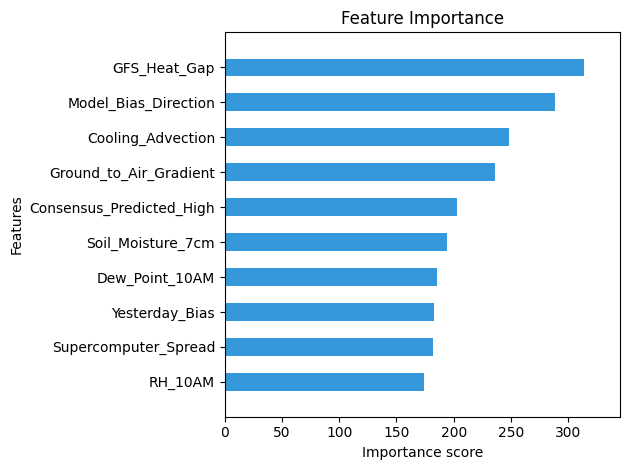

In [28]:
from sklearn.utils.extmath import randomized_svd
#defining the timeseries split
#We use 3 fold for the cross validation
tscv = TimeSeriesSplit(n_splits=3)

# 2. Define the Hyperparameter Grid
# The computer will test every possible combination of these numbers
#Defining the hyperparameter grid
param_grid = {'n_estimators':[300,800,1000], 'learning_rate':[0.005,0.05,0.1],'max_depth':[3,4,5,7],'subsample':[0.8,1.0]}

#XGBOOST model initilization
base_model = xgb.XGBRegressor(objective='reg:absoluteerror',colsample_bytree=0.8,tree_method='hist',random_state=123)


## 4. Set up the Grid Search
# scoring='neg_mean_absolute_error' tells it to search for the lowest MAE
print("Commencing Hyperparameter Grid Search. This will train 162 models.")
print("Please wait, this may take 1-3 minutes...")

grid_search = GridSearchCV(estimator=base_model,param_grid=param_grid, cv = tscv, scoring = 'neg_mean_absolute_error',verbose=1,n_jobs=-1)

# 5. Fit the Grid Search on the Training Data ONLY
# We never let the optimizer see our final X_test holdout set!

grid_search.fit(X_train,y_train)

# 6. Extract the absolute best model
best_model = grid_search.best_estimator_

print("\n==================================")
print("     OPTIMIZATION COMPLETE        ")
print("==================================")
print("The Best Hyperparameters for milan are:") #Add city name
for param, value in grid_search.best_params_.items():
    print(f" - {param}: {value}")

# 7. Final Test: Evaluate the tuned model on the unseen Future (X_test)
print("\nEvaluating Optimized Model on the Future (Test Set)...")
delta_predictions = best_model.predict(X_test)
actual_predicted_highs = X_test['Temp_10AM'] + delta_predictions
actual_real_highs = y_test + X_test['Temp_10AM']

final_mae = mean_absolute_error(actual_real_highs, actual_predicted_highs)
print(f"🔥 True Heating Delta MAE: {final_mae:.2f}°C")
#Plotting features importace
plt.figure(figsize=(10, 6))
xgb.plot_importance(best_model, importance_type='weight', max_num_features=10,
                    height=0.5, show_values=False, color='#3498db')
plt.title('Feature Importance')
plt.grid(False)
plt.tight_layout()
plt.show()

Finding the MAE bleedeing spot

In [29]:
# Create a dataframe of the test results
df_audit = X_test.copy()
df_audit['Actual'] = actual_real_highs
df_audit['Predicted'] = actual_predicted_highs
df_audit['Error'] = df_audit['Predicted'] - df_audit['Actual']
df_audit['Abs_Error'] = np.abs(df_audit['Error'])

# Filter for the days where we missed by more than 1.5 degrees
trouble_days = df_audit[df_audit['Abs_Error'] > 1.5]

print(f"Model suffered catastrophic misses (>1.5C) on {len(trouble_days)} days.")
print("Average DNI on Trouble Days:", trouble_days['DNI_Radiation_Wm2'].mean())
print("Average Wind Speed on Trouble Days:", trouble_days['Wind_Speed_10AM'].mean())

Model suffered catastrophic misses (>1.5C) on 30 days.
Average DNI on Trouble Days: 221.23839
Average Wind Speed on Trouble Days: 4.966666666666667


Downloading the model

In [30]:
from google.colab import files

best_model.save_model('milan_MAE_081_oracle.json') #Add city name and MAE value

# 2. Trigger the browser to download the file to your hard drive
files.download('milan_MAE_081_oracle.json')

print("Model successfully packaged and downloaded!")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Model successfully packaged and downloaded!


Testing the Mixture of experts architecture

In [ ]:
# ---------------------------------------------------------
# 2. THE REGIME SPLIT (TRAIN DATA ONLY)
# ---------------------------------------------------------
# Threshold: 600 W/m2 separates "Pure Solar" from "Scattered/Cloudy"
clear_mask_train = X_train['DNI_Radiation_Wm2'] >= 600
messy_mask_train = X_train['DNI_Radiation_Wm2'] < 600

X_clear = X_train[clear_mask_train]
y_clear = y_train[clear_mask_train]

X_messy = X_train[messy_mask_train]
y_messy = y_train[messy_mask_train]

print(f"Training Regime Split -> Clear Days: {len(X_clear)} | Messy Days: {len(X_messy)}")

# ---------------------------------------------------------
# 3. TRAIN EXPERT 1: THE CLEAR SKY MODEL
# ---------------------------------------------------------
# High confidence physics: Deeper trees (max_depth=4), tighter error slope (1.0)
model_clear = xgb.XGBRegressor(
    objective='reg:absoluteerror',
    base_score=0.5,
    n_estimators=2000,
    learning_rate=0.005,
    max_depth=4,
    subsample=0.8,
    colsample_bytree=0.8,
    tree_method='hist',
    random_state=42
)
model_clear.fit(X_clear, y_clear)

# ---------------------------------------------------------
# 4. TRAIN EXPERT 2: THE MESSY SKY MODEL
# ---------------------------------------------------------
# Low confidence physics (Dust/Clouds): Shallow trees (max_depth=3) to prevent overfitting
model_messy = xgb.XGBRegressor(
    objective='reg:absoluteerror',
    base_score=0.5,
    n_estimators=2000,
    learning_rate=0.005,
    max_depth=3,              # 🛑 Strict Regularization
    subsample=0.7,
    colsample_bytree=0.8,
    tree_method='hist',
    random_state=42
)
model_messy.fit(X_messy, y_messy)

# ---------------------------------------------------------
# 5. THE EVALUATION ROUTER (TEST DATA)
# ---------------------------------------------------------
print("\nRouting Test Data through Expert AI...")

# Create evaluation dataframe to safely hold predictions
df_eval = X_test.copy()
df_eval['Actual_Delta'] = y_test
df_eval['Predicted_Delta'] = 0.0

# Route the Test Days
clear_mask_test = df_eval['DNI_Radiation_Wm2'] >= 600
if clear_mask_test.sum() > 0:
    df_eval.loc[clear_mask_test, 'Predicted_Delta'] = model_clear.predict(X_test[clear_mask_test])

messy_mask_test = df_eval['DNI_Radiation_Wm2'] < 600
if messy_mask_test.sum() > 0:
    df_eval.loc[messy_mask_test, 'Predicted_Delta'] = model_messy.predict(X_test[messy_mask_test])

# ---------------------------------------------------------
# 6. FINAL MAE CALCULATION (ABSOLUTE THERMODYNAMICS)
# ---------------------------------------------------------
# Add the predicted delta back to the physical baseline
df_eval['Predicted_High'] = df_eval['Temp_10AM'] + df_eval['Predicted_Delta']
df_eval['Actual_High'] = df_eval['Temp_10AM'] + df_eval['Actual_Delta']

final_moe_mae = mean_absolute_error(df_eval['Actual_High'], df_eval['Predicted_High'])

# Calculate independent MAEs just to see which Expert is performing better
mae_clear = mean_absolute_error(df_eval.loc[clear_mask_test, 'Actual_High'], df_eval.loc[clear_mask_test, 'Predicted_High'])
mae_messy = mean_absolute_error(df_eval.loc[messy_mask_test, 'Actual_High'], df_eval.loc[messy_mask_test, 'Predicted_High'])

print("==================================================")
print(f" ☀️ Clear Sky Expert MAE:  {mae_clear:.4f}°C")
print(f" 🌪️ Messy Sky Expert MAE:  {mae_messy:.4f}°C")
print(f" 🏆 FINAL COMBINED MAE:    {final_moe_mae:.4f}°C")
print("==================================================")

Training Regime Split -> Clear Days: 321 | Messy Days: 622

Routing Test Data through Expert AI...
 ☀️ Clear Sky Expert MAE:  0.7683°C
 🌪️ Messy Sky Expert MAE:  0.9688°C
 🏆 FINAL COMBINED MAE:    0.8966°C
